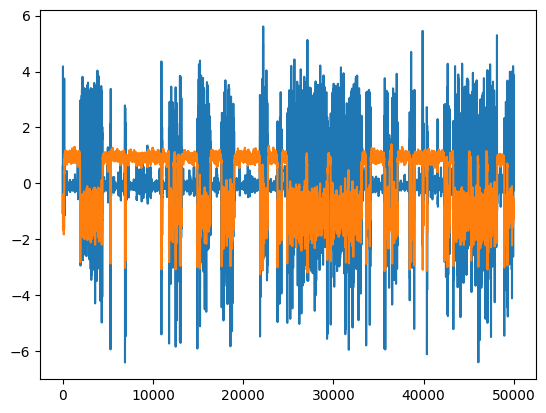

In [1]:
# Init pack

import numpy as np
from scipy.integrate import solve_ivp
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch
import matplotlib.pyplot as plt
from torch.amp import GradScaler, autocast

psi = np.load('/home/danielboscu/Documents/code/AI_RES/data/actual/long_run_310k.npy')
psi = psi[:,1,:]

# Normalization
mean_psi = np.mean(psi, axis=0, keepdims=True)
std_psi = np.std(psi, axis=0, keepdims=True)
psi = (psi - mean_psi) / std_psi

# Pre-processing

lead = 1
trainN = 250000
valN = 50000
index = 63

# Defining the variable ranges
variable_range = [(0,24), (25, 49), (50, 74), (0, 49), (0,74)]

# Select the variable: 0 for real perturbation, 1 for imaginary perturbation, 2 for zonal winds
variable = 3
num_variables = variable_range[variable][1] - variable_range[variable][0] + 1

# Shuffle and map indices
np.random.seed(42)
valid_indices = np.arange(0, trainN - lead)
shuffled_indices = np.random.permutation(valid_indices)

# Now constrain the shuffled indices to the variable range
np_psi_train_input = psi[shuffled_indices, variable_range[variable][0]:variable_range[variable][1]+1]
np_psi_train_label = psi[shuffled_indices + lead, :]

psi_train_input = torch.tensor(np_psi_train_input)
psi_train_label = torch.tensor(np_psi_train_label)

np_psi_val_input = psi[trainN:trainN+valN, variable_range[variable][0]:variable_range[variable][1]+1]
np_psi_val_label = psi[trainN+lead:trainN+valN+lead, :]

psi_val_input = torch.tensor(np_psi_val_input)
psi_val_label =  torch.tensor(np_psi_val_label)

plt.plot(np_psi_val_input[:,-1]) # Real and Imaginary PSI
plt.plot(np_psi_val_label[:,-1]) # Real and Imaginary PSI + Zonal Wind
plt.show()
# plt.plot(psi_val_input[0:50000,63])

In [2]:
class Encoder(nn.Module):
    def __init__(self, latent_dim, num_neurons):
        super(Encoder, self).__init__()
        self.fc1 = nn.Linear(75, num_neurons)  # Input layer (2 + 2) -> Hidden layer (128)
        self.fc2 = nn.Linear(num_neurons, num_neurons)  # Hidden layer (128) -> Hidden layer (128)
        self.fc3 = nn.Linear(num_neurons, num_neurons)  # Hidden layer (128) -> Hidden layer (128)
        self.fc4 = nn.Linear(num_neurons, num_neurons)  # Hidden layer (128) -> Hidden layer (128)
        self.fc5 = nn.Linear(num_neurons, num_neurons)  # Hidden layer (128) -> Hidden layer (128)
        self.fc6 = nn.Linear(num_neurons, num_neurons)  # Hidden layer (128) -> Hidden layer (128)
        self.fc_mu = nn.Linear(num_neurons, latent_dim)  # Hidden layer (128) -> Latent space (2)
        self.fc_logvar = nn.Linear(num_neurons, latent_dim)  # Hidden layer (128) -> Log variance (2)

    def forward(self, x):
        x = torch.relu(self.fc1(x))  # Activation function for hidden layer
        x = torch.relu(self.fc2(x)) + x
        x = torch.relu(self.fc3(x)) + x
        x = torch.relu(self.fc4(x)) + x
        x = torch.relu(self.fc5(x)) + x
        x = torch.relu(self.fc6(x)) + x
        mu = self.fc_mu(x)
        logvar = self.fc_logvar(x)
        return mu, logvar

# Define the decoder (MLP)
class Decoder(nn.Module):
    def __init__(self, latent_dim, output_dim, condition_dim, num_neurons):
        super(Decoder, self).__init__()
        self.fc1 = nn.Linear(latent_dim + condition_dim, num_neurons)  # Input layer (2 + 2) -> Hidden layer (128)
        self.fc2 = nn.Linear(num_neurons, num_neurons)  # Hidden layer (128) -> Hidden layer (128)
        self.fc3 = nn.Linear(num_neurons, num_neurons)  # Hidden layer (128) -> Hidden layer (128)
        self.fc4 = nn.Linear(num_neurons, num_neurons)  # Hidden layer (128) -> Hidden layer (128)
        self.fc5 = nn.Linear(num_neurons, num_neurons)  # Hidden layer (128) -> Hidden layer (128)
        self.fc6 = nn.Linear(num_neurons, num_neurons)  # Hidden layer (128) -> Hidden layer (128)
        self.fc_output = nn.Linear(num_neurons, output_dim)  # Hidden layer (128) -> Output layer (2)

    def forward(self, z, condition):
        z = torch.cat((z, condition[:, :50]), dim=1)  # Concatenate latent vector and condition
        z = torch.relu(self.fc1(z))  # Activation function for hidden layer
        z = torch.relu(self.fc2(z)) + z
        z = torch.relu(self.fc3(z)) + z
        z = torch.relu(self.fc4(z)) + z
        z = torch.relu(self.fc5(z)) + z
        z = torch.relu(self.fc6(z)) + z
        output = self.fc_output(z)
        return output

# Define the VAE model
class ConditionalVAE(nn.Module):
    def __init__(self, latent_dim, output_dim, condition_dim, num_neurons):
        super(ConditionalVAE, self).__init__()
        self.encoder = Encoder(latent_dim, num_neurons)
        self.decoder = Decoder(latent_dim, output_dim, condition_dim, num_neurons)

    def encode(self, x):
        mu, logvar = self.encoder(x)
        return mu, logvar

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std
        return z

    def decode(self, z, condition):
        return self.decoder(z, condition)

    def forward(self, x, condition):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        output = self.decode(z, condition)
        return output, mu, logvar

output_dim = 75
latent_dim = 32
condition_dim = num_variables
batch_size = 1024

# CHOOSING BY EXP FIT

In [3]:
# CHOOSING BY EXP FIT
# TO-DO: Check if crps is correct

from scipy.stats import linregress

def normalize_transition_time(s, neuro_num, r):
    """
    Normalize the transition time based on the specified num_neurons and reference value.

    Args:
        s (float): The transition time to normalize.
        neuro_num (float): The num_neurons value for normalization.
        r (float): The reference value for normalization.

    Returns:
        norm (float): The normalized transition time.
    """
    norm = 1 - np.exp(-np.abs((s - r)) / neuro_num)
    return norm

# Code from Ira Shokar but slightly changed
def crps_score(p, y):
    """
    Calculate CRPS for given predictions and observations.

    Args:
        p (Tensor): Predictions, shape (N, D) where N = ens_num and D is the dimension of the prediction.
        y (Tensor): Observations, shape (D) where D is the dimension of the observation.

    Returns:
        crps (float): The CRPS score.
    """
    y  = y.unsqueeze(0)
    # First term: mean distance from observations to ensemble members
    mae     = torch.cdist(y, p, 1).mean()
    # Second term: mean distance between ensemble members (properly normalized)
    ens_var = torch.cdist(p, p, 1).mean()
    
    return mae - 0.5 * ens_var

# Function to calculate transition durations
def calculate_transition_durations(y, u, l):
    """
    Calculate the return periods with user-defined upper and lower bounds.

    Args:
        y (np.array): The time series data.
        u (float): The upper bound for the transition.
        l (float): The lower bound for the transition.

    Returns:
        t_times (list): The list of return periods for transitions.
    """

    t_times = []
    s = None
    above_u = False
    below_l = False
    for i in range(1, len(y)):
        if y[i] < l:  
            below_l = True
            above_u = False
        elif y[i] > u:  
            if below_l and s is not None:
                t_times.append(i - s)
                s = None  
            above_u = True
            below_l = False

        if below_l and s is None:
            s = i
    return t_times

def KL_coefficient(r, p, num_neurons, cycle, KL_by_dim_cycle, L1_by_dym_cycle):
    """
    Calculate the KL divergence between two distributions and normalize it.

    Args:
        r (np.array): Real distribution.
        p (np.array): Predicted distribution.
        num_neurons (float): num_neurons value for normalization.
        cycle (int): Cycle number for tracking.
        KL_by_dim_cycle (dict): Dictionary to store KL divergence values by dimension and cycle.

    Returns:
        r (np.array): Processed real distribution.
        p (np.array): Processed predicted distribution.
        nkl (float): Normalized KL divergence.
    """
    # Calculating KL divergence
    r = r[:300000, 1, 63]
    p = p[:300000]
    
    rh, b = np.histogram(r, bins=100, density=True)
    ph, _ = np.histogram(p, bins=b, density=True)

    abs_diff = np.abs(rh-ph)
    max_diff = np.max(abs_diff)
    norm_diff = max_diff / (np.max(rh) + np.max(ph))

    e = 1e-10
    rh += e
    ph += e

    # Calculate KL divergence between the two histograms
    kl = np.sum(rh * np.log(rh / ph))
    nkl = normalize_transition_time(kl, 1, 0)

    KL_by_dim_cycle[num_neurons][cycle].append(nkl)
    L1_by_dym_cycle[num_neurons][cycle].append(norm_diff)
    
    return r, p, nkl, norm_diff

def CCDF_fit(p_times, s):
    """
    Calculate the slope of the CCDF of transition times and normalize it.

    Args:
        p_times (list): Transition times from predictions.
        s (float): Real value for normalization.
    
    Returns:
        np_slope (float): Normalized slope of the CCDF.
    """
    # === PREDICTIONS CCDF AND FIT ===
    if len(p_times) > 0 and len(np.unique(p_times)) > 1:
        sp_times = np.sort(p_times)
        p_ccdf = 1 - np.arange(1, len(sp_times) + 1) / len(sp_times)

        p_v_indices = p_ccdf > 0
        px_fit = sp_times[p_v_indices]
        py_fit = np.log(p_ccdf[p_v_indices])

        p_slope, _, *_ = linregress(px_fit, py_fit)
        np_slope = normalize_transition_time(p_slope, 0.005, s)
        return np_slope

    else:
        print("No transitions detected in predictions for CCDF slope evaluation.")

def Mean_and_std_of_predictions(p_times, r_times, neuro_num, cc, transitions_by_dim_cycle, transitions_normalized_by_dim_cycle, transitions_normalized_std_by_dim_cycle):
    """
    Calculate the mean and standard deviation of transition times from predictions and normalize them.

    Args:
        p_times (list): Transition times from predictions.
        r_times (list): Transition times from real data.
        neuro_num (float): num_neurons value for normalization.
        cc (int): Cycle number for tracking.
        transitions_by_dim_cycle (dict): Dictionary to store transition times by dimension and cycle.
        transitions_normalized_by_dim_cycle (dict): Dictionary to store normalized transition times by dimension and cycle.
        transitions_normalized_std_by_dim_cycle (dict): Dictionary to store normalized standard deviations by dimension and cycle.

    Returns:
        npd_mean (float): Normalized mean of transition times.
        npd_std (float): Normalized standard deviation of transition times.
    """
    p_mean = np.mean(p_times)
    p_std = np.std(p_times)

    pd_mean = abs(p_mean - np.mean(r_times))
    pd_std = abs(p_std - np.std(r_times))

    npd_mean = normalize_transition_time(pd_mean, 1000, np.mean(r_times))
    npd_std = normalize_transition_time(pd_std, 1000, np.std(r_times))

    npd_std = 1 if npd_std == 0 else npd_std

    transitions_by_dim_cycle[neuro_num][cc].append(pd_mean)
    transitions_normalized_by_dim_cycle[neuro_num][cc].append(npd_mean)
    transitions_normalized_std_by_dim_cycle[neuro_num][cc].append(npd_std)

    return npd_mean, npd_std

# KL Annealing (FROM PAPER)
def frange_cycle_linear(start, stop, n_epoch, n_cycle=4, ratio=0.5):
    """
    Generate a linear schedule for KL annealing over multiple cycles.

    Args:
        start (float): Starting value of the schedule.
        stop (float): Stopping value of the schedule.
        n_epoch (int): Total number of epochs.
        n_cycle (int): Number of cycles for the schedule.
        ratio (float): Ratio of the cycle length to the total number of epochs.

    Returns:
        L (np.array): Array containing the linear schedule values for each epoch.
    """
    L = np.zeros(n_epoch)
    L[:] = stop
    period = n_epoch/n_cycle
    step = (stop-start)/(period*ratio) # linear schedule

    for c in range(n_cycle):

        v , i = start , 0
        while v <=stop and (int(i+c*period) < n_epoch):
            L[int(i+c*period)] = v
            v += step
            i += 1
    return L

from matplotlib import gridspec
import seaborn as sns
import os

def Timeseries_plot(y, p, ep, ax):
    """
    Plot the timeseries.

    Args:
        y (np.array): Actual zonal wind values.
        p (np.array): Predicted zonal wind values.
        ep (int): Current epoch number.
        ax (matplotlib.axes.Axes): Axes object to plot on.

    Returns:
        None. Just plots the timeseries on the provided axes.
    """
    ax.plot(y, 'b', label='Actual')
    ax.plot(p, 'r', label='Predictions')

    ax.set_title(f"Timeseries | Epoch {ep}", fontsize=16)
    ax.set_xlabel('Time Step', fontsize=14)
    ax.set_ylabel('Zonal Wind Value', fontsize=14)

    ax.legend(['Predictions', 'Actual'])
    ax.grid(True)

    # save_path = os.path.join(folder, "timeseries")
    # save_path = os.path.join(save_path, f"timeseries_plot_{epoch+1}.png")

    # plt.savefig(save_path)

    # plt.show()75

def PDF_plot(y, p, ep, pdf_dt, ax):
    """
    Plot PDFs of the zonal wind values.

    Args:
        y (np.array): Actual zonal wind values.
        p (np.array): Predicted zonal wind values.
        ep (int): Current epoch number.
        pdf_dt (float): KL diff between the PDFs of actual and predicted values.
        ax (matplotlib.axes.Axes): Axes object to plot on.

    Returns:
        None. Just plots the PDFs on the provided axes.
    """

    sns.histplot(y, bins=100, kde=True, color='black', alpha=0.6, element='step', label='Real Data', ax=ax)
    sns.histplot(p, bins=100, kde=True, color='red', alpha=0.6, element='step', label='Predictions', ax=ax)

    ax.set_title(f"Probability Distribution Functions (PDFs) | Epoch {ep} | KL Error: {pdf_dt:.4f}", fontsize=16)
    ax.set_xlabel('Zonal Wind (m/s)', fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    
    ax.axvline(np.mean(y), color='black', linestyle='--', label=f'Real Mean: {np.mean(y):.2f}')
    ax.axvline(np.mean(p), color='red', linestyle='--', label=f'Pred Mean: {np.mean(p):.2f}')

    ax.legend(fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.5)

    # save_path = os.path.join(folder, "bi_modal_distri")
    # save_path = os.path.join(save_path, f"bi_modal_distribution_plot_{epoch+1}.png")
    # plt.savefig(save_path)

    # plt.show()

def Exp_fit_plot(xlp, yvp, xlr, yvr, p_exp_fit, r_exp_fit, ep, exp_d, range_d, ax):
    """
    Plot the exponential fits of transition return periods.

    Args:
        xlp (np.array): X values for predicted exponential fit.
        yvp (np.array): Y values for predicted exponential fit.
        xlr (np.array): X values for real exponential fit.
        yvr (np.array): Y values for real exponential fit.
        p_exp_fit (float): Slope of the predicted exponential fit.
        r_exp_fit (float): Slope of the real exponential fit.
        ep (int): Current epoch number.
        exp_d (float): Exponential fit error for predictions.
        range_d (float): Range error for predictions.
        ax (matplotlib.axes.Axes): Axes object to plot on.

    Returns:
        None. Just plots the exponential fits on the provided axes.
    """
    ax.plot(xlp, yvp, 'r-', label=f'Pred Exp Fit (slope={p_exp_fit:.4f})', linewidth=2)
    ax.plot(xlr, yvr, 'b-', label=f'Real Exp Fit (slope={r_exp_fit:.4f})', linewidth=2)

    ax.set_xlabel('Time Duration (Steps)')
    ax.set_ylabel('Exponential Fit')
    ax.set_title(f"Exponential Fits of Transition Return Periods | Epoch {ep} | Exp Error: {exp_d:.4f} | Range Error: {range_d:.4f}", fontsize=16)
   
    ax.set_yscale("linear")  # y-axis log scale
    ax.set_xscale("linear")  # x-axis linear scale
    
    ax.grid()
    ax.legend()
    
    # save_path = os.path.join(folder, "expo_fit")
    # save_path = os.path.join(save_path, f"expo_fit_plot_{epoch}.png")
    # plt.savefig(save_path)
    # plt.show()

def Final_KL_PDF_plot(KL_by_dim_cycle, r, neuro_num, ncc, f):
    """
    Plot the average transition values across all cycles.

    Args:
        KL_by_dim_cycle (dict): Dictionary containing KL PDF values by dimension and cycle.
        r (float): Real data value for comparison.
        neuro_num (float): num_neurons coefficient for normalization.
        ncc (int): Number of cycles.
        f (str): Folder path to save the plot.
    
    Returns:
        None. Just plots the average transition values and saves the figure.
    """
    plt.figure(figsize=(10, 6))
    for c in range(ncc):
        plt.plot(KL_by_dim_cycle[neuro_num][c], 'o-', label=f'Cycle {c}')
    
    plt.xlabel('Epoch within Cycle')
    plt.ylabel('KL Difference Normalized')
    plt.ylim(0,1)
    plt.title(f'KL Difference Value between PDFs Normalized)')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    f = os.path.join(f, f"KL_diff_all_cycles.png")
    plt.savefig(f)
    plt.close()


def Final_exp_fit_plot(exp_fit_by_dim_cycle, r_exp_fit, neuro_num, ncc, f):
    """
    Plot the exponential fit values across all cycles.

    Args:
        exp_fit_by_dim_cycle (dict): Dictionary containing exponential fit values by dimension and cycle.
        r_exp_fit (float): Real data value for comparison.
        neuro_num (float): num_neurons coefficient for normalization.
        ncc (int): Number of cycles.
        f (str): Folder path to save the plot.

    Returns:
        None. Just plots the exponential fit values and saves the figure.
    """
    plt.figure(figsize=(10, 6))
    for c in range(ncc):
        plt.plot(exp_fit_by_dim_cycle[neuro_num][c], 'o-', label=f'Cycle {c}')
    
    plt.axhline(y=r_exp_fit, color='r', linestyle='--', label='Real Data')

    plt.xlabel('Epoch within Cycle')
    plt.ylabel('Exponential Fit Value')
    plt.title(f'Exponential Fit Progress (num_neurons Coefficient={neuro_num})')
    plt.grid(True)
    plt.tight_layout()
    plt.legend()

    f = os.path.join(f, f"exponential_fit_plot_all_cycles.png")
    plt.savefig(f)
    plt.close()
    
def all_plot(y, p, xlp, yvp, xlr, yvr, 
             p_exp_fit, r_exp_fit, pdf_dt, exp_dt, range_dt, ep, folder):
    """
    Comprehensive plot with timeseries, PDF, and exponential fit.

    Args:
        y (np.array): Actual zonal wind values.
        p (np.array): Predicted zonal wind values.
        xlp (np.array): X values for predicted exponential fit.
        yvp (np.array): Y values for predicted exponential fit.
        xlr (np.array): X values for real exponential fit.
        yvr (np.array): Y values for real exponential fit.
        p_exp_fit (float): Slope of the predicted exponential fit.
        r_exp_fit (float): Slope of the real exponential fit.
        pdf_dt (float): KL divergence between the PDFs of actual and predicted values.
        exp_dt (float): Exponential fit error for predictions.
        range_dt (float): Range error for predictions.
        ep (int): Current epoch number.
        folder (str): Folder path to save the plot.
    
    Returns:
        None. Just plots the timeseries, PDF, and exponential fit and saves the figure.
    """
    fig = plt.figure(figsize=(24, 10))
    gs = gridspec.GridSpec(2, 2, figure=fig, width_ratios=[1,1], height_ratios=[1,1])

    ax_timmeseries = fig.add_subplot(gs[:, 0])
    ax_pdf = fig.add_subplot(gs[0, 1])
    ax_exp_fit = fig.add_subplot(gs[1, 1])

    Timeseries_plot(y[:60000], p[:60000], ep, ax_timmeseries)
    PDF_plot(y, p, ep, pdf_dt, ax_pdf)
    Exp_fit_plot(xlp, yvp, xlr, yvr, 
                 p_exp_fit, r_exp_fit, ep, exp_dt, range_dt, ax_exp_fit)
    
    dt = np.sqrt(pdf_dt**2 + exp_dt**2 + range_dt**2)
    fig.suptitle(f"Predictions vs Actual | Epoch {ep} | Euclidean Metric Error: {dt}", fontsize=20)
    plt.subplots_adjust(wspace=0.2, hspace=0.35)  # Adjust these values as desired
    fig.tight_layout(pad=2.0)
    plt.savefig(os.path.join(folder, f"plots/all_plots_epoch_{ep}.png"))
    plt.close()

def Loss_plot(t_loss, v_loss, cc, neuro_num, f):
    """
    Plot the training and validation losses.

    Args:
        t_loss (list): Training loss values.
        v_loss (list): Validation loss values.
        cc (int): Cycle number for tracking.
        neuro_num (float): num_neurons value for normalization.
        f (str): Folder path to save the plot.
    
    Returns:
        None. Just plots the training and validation losses and saves the figure.
    """
    plt.figure(figsize=(10,6))

    plt.plot(t_loss, label='Training Loss')
    plt.plot(v_loss, label='Validation Loss')

    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'Losses for Cycle {cc+1} with num_neurons {neuro_num}')
    plt.legend()

    f = os.path.join(f, f"loss_plot_cycle_{cc+1}_num_neurons_{neuro_num}.png")
    plt.savefig(f)
    plt.close()
    
# TO-DO: Try to change KL metric to KS. Add all graphs in one figure and add the distance metric to the best model selection to it.

# Training

torch.cuda.empty_cache()

import datetime
import os
import shutil
from scipy.stats import linregress
import seaborn as sns
from matplotlib.gridspec import GridSpec

def model_restore(mp, model):
    """
    Restore the model state from a saved checkpoint.

    Args:
        mp (str): Path to the model checkpoint.
        model (nn.Module): The model to restore.

    Returns:
        None. The model state is loaded from the checkpoint if it exists.
    """
    if os.path.exists(mp):
        print(f"Loading model from {mp}")
        model.load_state_dict(torch.load(mp))

def inference(model, psi, tst, vr, v, nv, ld):
    """
    Perform inference using the trained model.

    Args:
        model (nn.Module): The trained model.
        psi (np.array): Input data for inference.
        tst (int): Number of time steps.
        vr (dict): Variable ranges for the input data.
        v (int): Index of the variable to use for inference.
        nv (int): Number of variables.
        ld (int): Latent dimension of the model.
    
    Returns:
        p (np.array): Predictions made by the model.
    """
    s, e = vr[v][0], vr[v][1]+1
    init_c = torch.reshape(torch.tensor(psi[0,s:e]), [1, nv])
    z = torch.zeros([1,ld])
    p = np.zeros ([tst, 75])

    for k in range (0, tst):

        with torch.inference_mode():
            model.eval()

            with autocast(device_type='cuda'):

                if (k ==0):

                    z = torch.randn_like(z).float().cuda(non_blocking=True)
                    init_c = init_c.float().cuda(non_blocking=True)

                    y = (model.decode(z, init_c)).detach().cpu().numpy()
                    p[k,:] = y

                    init_c = torch.tensor(y[:, s:e])

                else:
                    z = torch.randn_like(z).float().cuda(non_blocking=True)
                    init_c = torch.reshape(torch.tensor(p[k-1,s:e]),[1,nv]).float().cuda(non_blocking=True)

                    y = (model.decode(z,init_c)).detach().cpu().numpy()
                    p[k,:] = y

                    init_c = torch.tensor(y[:, s:e])
    
    return p

def euclidean_distance_for_predictions(ms):
    """
    Calculate the Euclidean distance for a list of metrics.

    Args:
        ms (list): List of computed metrics.

    Returns:
        dt (float): The Euclidean distance calculated from the given computed metrics.
    """
    s = 0
    for m in ms:
        s += m ** 2
    dt = np.sqrt(s)
    return dt

def save_best_cycle_epoch(models, neuro_num, cc, ep, f,
                          exp_fit_normalized_by_dim_cycle, 
                          KL_by_dim_cycle, duration_diff_by_dim_cycle, 
                          best_models_saved, best_models):
    """
    Select the best model from a cycle based on combined distance metrics and save it.

    Args:
        models (list): List of model paths for the current cycle.
        neuro_num (float): num_neurons coefficient for normalization.
        cc (int): Current cycle number.
        ep (int): Current epoch number.
        f (str): Folder path to save the best model.
        exp_fit_normalized_by_dim_cycle (dict): Dictionary containing normalized exponential fit values by dimension and cycle.
        KL_by_dim_cycle (dict): Dictionary containing KL divergence values by dimension and cycle.
        duration_diff_by_dim_cycle (dict): Dictionary containing range differences by dimension and cycle.
        best_models_saved (list): List to store the paths of the best models saved.
        best_models (list): List to store the best models selected.

    Returns:
        None. The best model is saved to the specified folder.
    """
    
    b_model = None
    b_i = -1
    b_dt = float('inf')

    for i in range(len(models)):  # models contains each epoch's model in the current cycle
        print(exp_fit_normalized_by_dim_cycle[neuro_num][cc][i])
        print(KL_by_dim_cycle[neuro_num][cc][i])
        print(duration_diff_by_dim_cycle[neuro_num][cc][i])
        ms = [exp_fit_normalized_by_dim_cycle[neuro_num][cc][i],
                   KL_by_dim_cycle[neuro_num][cc][i], 
                   duration_diff_by_dim_cycle[neuro_num][cc][i]]
        
        dt = euclidean_distance_for_predictions(ms)
        if dt < b_dt:
            b_dt = dt
            b_i = i
            b_model = models[i]

    if b_i != -1:
        best_models_saved.append(b_model)
        best_models.append((cc, b_i))

    shutil.copyfile(models[b_i], f"{f}/best_model_combined_distance_at_cycle_{cc}_and_checkpoint_{ep}.pth")
    print(f"New best model saved with distance {dt:.4f} at epoch {i+1}")

def save_best_epoch(best_models, best_models_saved, exp_fit_normalized_by_dim_cycle,
                    KL_by_dim_cycle, duration_diff_by_dim_cycle, neuro_num, mf):
    
    """
    Select the best model from the master training run based on combined distance metrics and save it.

    Args:
        models (list): List of model paths for the current cycle.
        neuro_num (float): num_neurons coefficient for normalization.
        cc (int): Current cycle number.
        ep (int): Current epoch number.
        f (str): Folder path to save the best model.
        exp_fit_normalized_by_dim_cycle (dict): Dictionary containing normalized exponential fit values by dimension and cycle.
        KL_by_dim_cycle (dict): Dictionary containing KL divergence values by dimension and cycle.
        duration_diff_by_dim_cycle (dict): Dictionary containing range differences by dimension and cycle.
        best_models_saved (list): List to store the paths of the best models saved.
        best_models (list): List to store the best models selected.

    Returns:
        None. The best model is saved to the specified folder.
    """

    print("Selecting the best model based on combined distance...")

    # Ensure best_models is not empty
    if not best_models:
        print("No best models found.")
        return
    
    # After all cycles - final best model selection
    b_model = None
    w_model = (-1, -1)
    b_model_dt = float('inf')

    print(f"Number of best models saved: {len(best_models)}")
    for idx, (cc, ep_idx) in enumerate(best_models):

        ms = [exp_fit_normalized_by_dim_cycle[neuro_num][cc][ep_idx], 
                   KL_by_dim_cycle[neuro_num][cc][ep_idx], 
                   duration_diff_by_dim_cycle[neuro_num][cc][ep_idx]]
        
        dt = euclidean_distance_for_predictions(ms)        
        print(f"Distance for model from cycle {cc+1}, epoch {ep_idx+1}: {dt:.4f}")
        print(f"Current best distance: {b_model_dt:.4f}")
        
        if dt < b_model_dt:
            b_model_dt = dt
            b_model = best_models_saved[idx]
            w_model = (cc, ep_idx)

    # Save the best model  
    i,n = w_model
    cc = i
    ep = n

    if cc == -1:
        print("No best model found.")
    else:
        shutil.copyfile(b_model, f"{mf}/best_{neuro_num}_neurons_model_with_emr_{b_model_dt:.4f}_at_epoch_{ep+1}.pth")
        print(f"Best model saved with cycle {cc+1} and epoch {ep+1}.")

In [4]:
import torch
print(torch.cuda.is_available())
import gc

True


In [5]:
scaler          = GradScaler()
level           = 63
upper_bound     = 53.8 / 2.8935
lower_bound     = 7.41

best_distance   = float('inf')

real_data       = np.load(r"/home/danielboscu/Documents/code/AI_RES/data/actual/long_run_310k.npy")
real_data_1d    = real_data[:, 1, level]

# Function to calculate transition durations
real_durations      = calculate_transition_durations(real_data_1d, upper_bound, lower_bound)
real_data_sorted    = np.sort(real_durations)
transition_real     = np.mean(real_data_sorted)

actual_hist, bin_edges = np.histogram(real_data[:, 1, level], bins=50, density=True)
print(f"Reference Real Data average_transition_time: {transition_real}")

# Compute CCDF slope for real data
ccdf_real           = 1 - np.arange(1, len(real_data_sorted) + 1) / len(real_data_sorted)
valid_indices_real  = ccdf_real > 0
x_fit_real          = real_data_sorted[valid_indices_real]
y_fit_real          = np.log(ccdf_real[valid_indices_real])
slope_real, intercept_real, *_ = linregress(x_fit_real, y_fit_real)
print(f"Reference Real Data CCDF Slope: {slope_real}")

# Compute exponential fit for real data
x_line_real = np.linspace(min(real_data_sorted), max(real_data_sorted), 100)
exponential_fit_real = 1/np.mean(real_data_sorted)
y_values_real = exponential_fit_real*x_line_real

import wandb

num_neurons_lst = [1024]
num_cycles      = 1
ens_size        = 1
batch_size      = 1024
latent_dim      = 6
learning_rate   = 1e-4
num_epochs      = 1500
KL_annealing    = True
KL_weight       = 0.01
kl_range        = [0.01, 0.3, num_epochs//100, 1]
TRAIN_N         = 250000
VAL_N           = 50000
time_step       = 30000
restore         = False

beta_kl_coef = frange_cycle_linear(kl_range[0], kl_range[1], num_epochs, kl_range[2], kl_range[3])
print(beta_kl_coef)

transitions_by_dim_cycle                = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
transitions_normalized_by_dim_cycle     = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
transitions_normalized_std_by_dim_cycle = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
duration_diff_by_dim_cycle              = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
slope_diff_by_dim_cycle                 = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
exp_fit_by_dim_cycle                    = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
exp_fit_normalized_by_dim_cycle         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
KL_by_dim_cycle                         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
L1_by_dim_cycle                         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}

models_by_dim_cycle = []
if restore:
    master_folder = f"/home/danielboscu/Documents/code/AI_RES/training/Finetuning_RCVAE_at_{datetime.datetime.now()}"
else:
    master_folder = f"/home/danielboscu/Documents/code/AI_RES/training/RCVAE_at_{datetime.datetime.now()}"
os.makedirs(master_folder)

Reference Real Data average_transition_time: 759.8341708542714
Reference Real Data CCDF Slope: -0.0013499649649256768
[0.01   0.0129 0.0158 ... 0.2913 0.2942 0.2971]


In [6]:
for num_neurons in num_neurons_lst:
    run = wandb.init(entity="fabio2-the-university-of-chicago", project="ssw_research",
        config={
        "architecture": "VAE",
        "dataset": "Holton-Mass",
        "Finetuning": restore,
        "batch_size": batch_size,
        "Neurons @ Deep layer" : num_neurons_lst,
        "latent_dim size" : latent_dim,
        "learning_rate": learning_rate,
        "epochs": num_epochs,
        "KL list" : KL_annealing,
        "KL range and # of cycles" : [kl_range[0], kl_range[1], num_epochs//100] if KL_annealing else KL_weight,
        "Inference length" : time_step,
        },
    )

    best_models         = []
    best_models_saved   = []

    losses_training     = []
    losses_validation   = []

    for cycle in range(0,num_cycles):

        models = []

        # Initialize the model, optimizer, and loss function
        model       = ConditionalVAE(latent_dim, output_dim, condition_dim, num_neurons)
        model       = model.cuda()
        optimizer   = optim.Adam(model.parameters(), lr=0.0001)

        # Create the folder structure for saving results
        subfolders  = ['plots','checkpoints']
        folder      = f"{master_folder}/model_at_{cycle}_with_num_neurons_{num_neurons}"
        os.makedirs(folder)
        for subfolder in subfolders:
            path = os.path.join(folder, subfolder)
            os.mkdir(path)

        # Restore the model if specified
        if restore:
            model_path = "/home/danielboscu/Documents/code/AI_RES/training/RCVAE_at_2025-07-24 17:28:33.892860/model_at_0_with_num_neurons_1024/checkpoints/checkpoint_960"
            model_restore(model_path, model)
        
        # Training loop
        for epoch in range(num_epochs):
            model.train()
            for batch in range (0, TRAIN_N, batch_size):
                
                input_batch = psi_train_input[batch:batch + batch_size,:]
                label_batch = psi_train_label[batch:batch + batch_size,:]

                optimizer.zero_grad()

                with autocast(device_type='cuda'):

                    output, mu, logvar = model(label_batch.float().cuda(non_blocking=True), input_batch.float().cuda(non_blocking=True))

                    reconstruction_loss = F.smooth_l1_loss(output, label_batch.float().cuda(non_blocking=True), reduction="mean")
                    crps_loss = crps_score(output, label_batch.float().cuda(non_blocking=True)) * 0.0001
                    kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum() * beta_kl_coef[epoch]

                    # Total loss
                    loss = reconstruction_loss + kl_loss + 0*crps_loss
                    
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()

            losses_training.append(loss.item())
            print(f'''Epoch {epoch+1}, 
                Reconstrunction Loss: {reconstruction_loss.item()}
                KL Loss: {kl_loss.item()}
                CRPS Loss: {crps_loss.item()}
                Total Loss: {loss.item()}
                ''')

            run.log({"Epoch":epoch+1, "Loss": loss, "Reconstruction Loss": reconstruction_loss, "KL Loss": kl_loss})

            # Validation Loss
            for batch in range (0, VAL_N, batch_size):

                model.eval()
                input_batch = psi_val_input[batch:batch + batch_size,:]
                label_batch = psi_val_label[batch:batch + batch_size,:]

                with torch.no_grad():
                    with autocast(device_type='cuda'):

                        output, mu, logvar = model(label_batch.float().cuda(non_blocking=True), input_batch.float().cuda(non_blocking=True))

                        val_reconstruction_loss = F.smooth_l1_loss(output, label_batch.float().cuda(non_blocking=True), reduction="mean")
                        val_crps_loss = crps_score(output, label_batch.float().cuda(non_blocking=True)) * 0.0001
                        val_kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum() * beta_kl_coef[epoch]  
                
                # Total loss
                val_loss = val_reconstruction_loss + val_kl_loss + 0*val_crps_loss

            losses_validation.append(val_loss.item())
            print(f'''
                Validation Reconstrunction Loss: {val_reconstruction_loss.item()}
                Validation KL Loss: {kl_loss.item()}
                Validation CRPS Loss: {crps_loss.item()}
                Validation Total Loss: {val_loss.item()}''')
            
            run.log({"Epoch":epoch+1, "Val Loss": val_loss, "Val Reconstruction Loss": val_reconstruction_loss, "Val KL Loss": val_kl_loss})

            # Inference
            pred = inference(model, psi, time_step, variable_range, variable, 
                             num_variables, latent_dim)

            # Denormalize final preds
            pred_mean = pred[:time_step, :] * std_psi[:, :] + mean_psi[:, :]
            actual_values = psi[:time_step, :] * std_psi[:, :] + mean_psi[:, :]
            predictions_1d = pred_mean[:, 63]  # shape (300000,)

            # # Plotting the timeseries
            # Timeseries_plot(actual_values[:30000, 63], 
            #                 predictions_1d[:30000], 
            #                 epoch, folder)
            
            # Calculate transition durations for predictions
            pred_durations = calculate_transition_durations(predictions_1d, 
                                                            upper_bound, 
                                                            lower_bound)

            # Calculate transition durations for predictions
            pred_durations = calculate_transition_durations(predictions_1d, 
                                                            upper_bound, 
                                                            lower_bound)


            # Calculate KL coefficient
            KL_real_data, KL_predictions, avg_norm_KL, l1_diff = KL_coefficient(real_data, 
                                                                           predictions_1d, 
                                                                           num_neurons, 
                                                                           cycle, 
                                                                           KL_by_dim_cycle,
                                                                           L1_by_dim_cycle)
            
            run.log({"Epoch": epoch+1,"L1 Norm PDF Difference": l1_diff, "KL Divergence": avg_norm_KL, "KL Weight": beta_kl_coef[epoch]})

            # Calculate mean and standard deviation of predictions
            transition_diff_normalized, transition_std_diff_normalized = Mean_and_std_of_predictions(pred_durations, 
                                                                                                     real_durations, 
                                                                                                     num_neurons, cycle,
                                                                                                     transitions_by_dim_cycle,
                                                                                                     transitions_normalized_by_dim_cycle,
                                                                                                     transitions_normalized_std_by_dim_cycle)

            # Initialize variables for exponential fit and range of transitions
            exponential_fit_pred = 0
            duration_diff_normalized = 1

            if len(pred_durations) > 0 and  len(np.unique(pred_durations)) > 1:

                # Calculate the exponential fit for predictions
                x_line_pred = np.linspace(min(pred_durations), max(pred_durations), 100)
                avg_trans_dur = np.mean(pred_durations)
                
                l2_transitions_diff = np.abs((avg_trans_dur-transition_real)/transition_real)
                run.log({"Epoch":epoch+1, "Transition Deviation": l2_transitions_diff})

                exponential_fit_pred = 1/avg_trans_dur
                exp_fit_by_dim_cycle[num_neurons][cycle].append(exponential_fit_pred)
                exp_fit_normalized = normalize_transition_time(exponential_fit_pred, 0.005, exponential_fit_real)
                exp_fit_normalized_by_dim_cycle[num_neurons][cycle].append(exp_fit_normalized)
                # print(f"Exponential Fit Normalized: {exp_fit_normalized:.6f}")

                # Calculate the y-values for the exponential fit
                y_values_pred = exponential_fit_pred*x_line_pred
                
                # Calculate the range of transitions
                max_pred = np.max(pred_durations)
                min_pred = np.min(pred_durations)
                
                if max_pred > 0:

                    # Calculate the predicted range and normalize it
                    difference = abs(max_pred - min_pred)
                    duration_diff_normalized = normalize_transition_time(difference, 10000, abs(np.max(real_durations)-np.min(real_durations)))
                    duration_diff_by_dim_cycle[num_neurons][cycle].append(duration_diff_normalized)
                    # print(f"Duration Difference Normalized: {duration_diff_normalized:.6f}")
                    all_plot(actual_values[:300000, 63],
                                predictions_1d[:300000], 
                                x_line_pred, y_values_pred, 
                                x_line_real, y_values_real, 
                                exponential_fit_pred, exponential_fit_real, avg_norm_KL,
                                exp_fit_normalized, duration_diff_normalized,
                                epoch+1, folder)
                    run.log({"Epoch":epoch+1, "Exp Fit Diff Norm": exp_fit_normalized, "Range Diff Norm": duration_diff_normalized} )
                    
                else:
                    continue
                    # print("No distribution of transitions detected in predictions.")
            else:
                exp_fit_by_dim_cycle[num_neurons][cycle].append(exponential_fit_pred)
                duration_diff_by_dim_cycle[num_neurons][cycle].append(duration_diff_normalized)
                exp_fit_normalized = normalize_transition_time(exponential_fit_pred, 0.005, exponential_fit_real)
                exp_fit_normalized_by_dim_cycle[num_neurons][cycle].append(exp_fit_normalized)
                run.log({"Epoch":epoch+1, "Transition Deviation": np.nan})
                # print("No transitions detected in predictions for exponential fit evaluation.")



            # Calculate accuracy by euclidean distance with specified metrics
            metrics = [exp_fit_normalized, avg_norm_KL, duration_diff_normalized]
            distance = euclidean_distance_for_predictions(metrics)
            run.log({"Epoch":epoch+1, "Euclidean distance": distance})
            
            print(f"Epoch {epoch+1}: Exponential Transition Fit Predictions Normalized: {exp_fit_normalized}, KL Normalized = {avg_norm_KL}, Duration Difference Normalized = {duration_diff_normalized}, Combined Distance = {distance:.6f}")
            
            # Save the model weights at each epoch
            path = f"{folder}/checkpoints/checkpoint_{epoch+1}"
            torch.save(model.state_dict(), path)
            # print(f"Model weights saved to {folder} with point {epoch+1}.")
            models.append(path)

            # Final plots if last epoch
            if epoch == num_epochs - 1:

                folder = os.path.join(folder, "summary")
                if not os.path.exists(folder):
                    os.makedirs(folder)
                # Plot the final average transition plot
                Final_KL_PDF_plot(KL_by_dim_cycle, transition_real, num_neurons, num_cycles, folder)
                
                # Plot the final exponential fit plot
                Final_exp_fit_plot(exp_fit_by_dim_cycle, exponential_fit_real, num_neurons, num_cycles, folder)
        
        Loss_plot(losses_training, losses_validation, cycle, num_neurons, folder)
    
    # Save the best model for the current cycle
    save_best_cycle_epoch(models, num_neurons, cycle, epoch, folder, exp_fit_normalized_by_dim_cycle, 
                            KL_by_dim_cycle, duration_diff_by_dim_cycle,
                            best_models_saved, best_models)
    
    wandb.finish()
    
    # Delete tensors and lists
    del losses_training, losses_validation
    del model, optimizer
    del output, mu, logvar, pred, pred_mean, predictions_1d
    # Add deletes for other tensors like output, mu, logvar, pred
    
    gc.collect()
    gc.collect()
    torch.cuda.empty_cache()
    
    # Optional: Print RAM usage for debugging
    import psutil
    print(f"RAM used: {psutil.virtual_memory().used / (1024 ** 3):.2f} GB")

        
# Save the best model after all cycles
save_best_epoch(best_models, best_models_saved, exp_fit_normalized_by_dim_cycle,
                KL_by_dim_cycle, duration_diff_by_dim_cycle, num_neurons, master_folder)
del best_models, best_models_saved

wandb: Currently logged in as: danielboscu2005 (fabio2-the-university-of-chicago) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


Epoch 1, 
                Reconstrunction Loss: 0.017875438556075096
                KL Loss: 0.0018355768406763673
                CRPS Loss: 0.004052865318953991
                Total Loss: 0.01971101574599743
                

                Validation Reconstrunction Loss: 0.030376534909009933
                Validation KL Loss: 0.0018355768406763673
                Validation CRPS Loss: 0.004052865318953991
                Validation Total Loss: 0.05890589952468872
Epoch 1: Exponential Transition Fit Predictions Normalized: 0.11326586076628387, KL Normalized = 0.9992709831315236, Duration Difference Normalized = 0.04905590152559236, Combined Distance = 1.006865
Epoch 2, 
                Reconstrunction Loss: 0.012127011083066463
                KL Loss: 0.0012985124485567212
                CRPS Loss: 0.004050012677907944
                Total Loss: 0.013425523415207863
                

                Validation Reconstrunction Loss: 0.02321348525583744
                Validati

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 706: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999988969688, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 707, 
                Reconstrunction Loss: 0.0017795301973819733
                KL Loss: 2.9478670171556587e-07
                CRPS Loss: 0.004045321140438318
                Total Loss: 0.001779824960976839
                

                Validation Reconstrunction Loss: 0.011540091596543789
                Validation KL Loss: 2.9478670171556587e-07
                Validation CRPS Loss: 0.004045321140438318
                Validation Total Loss: 0.011541677638888359
Epoch 707: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999520738217184, Duration Difference Normalized = 1, Combined Distance = 1.432990
Epoch 708, 
                Reconstrunction Loss: 0.0016527659026905894
                KL Loss: 7.133782276014244e-08
                CRPS Loss: 0.0

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 745: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999996854726, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 746, 
                Reconstrunction Loss: 0.0014495686627924442
                KL Loss: 1.926124014062225e-06
                CRPS Loss: 0.004045118112117052
                Total Loss: 0.0014514947542920709
                

                Validation Reconstrunction Loss: 0.010382034815847874
                Validation KL Loss: 1.926124014062225e-06
                Validation CRPS Loss: 0.004045118112117052
                Validation Total Loss: 0.01039443351328373
Epoch 746: Exponential Transition Fit Predictions Normalized: 0.09290473081900763, KL Normalized = 0.8103538508906762, Duration Difference Normalized = 0.24881250655852083, Combined Distance = 0.852767
Epoch 747, 
                Reconstrunction Loss: 0.0013971920125186443
                KL Loss: 2.5043607365660137e-06
             

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 768: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999987511456, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 769, 
                Reconstrunction Loss: 0.0015658674528822303
                KL Loss: 2.902269443438854e-06
                CRPS Loss: 0.004045313224196434
                Total Loss: 0.0015687696868553758
                

                Validation Reconstrunction Loss: 0.010540369898080826
                Validation KL Loss: 2.902269443438854e-06
                Validation CRPS Loss: 0.004045313224196434
                Validation Total Loss: 0.01055834535509348
Epoch 769: Exponential Transition Fit Predictions Normalized: 0.10423391910170066, KL Normalized = 0.9999975495564586, Duration Difference Normalized = 0.2448961579109764, Combined Distance = 1.034811
Epoch 770, 
                Reconstrunction Loss: 0.0016556031769141555
                KL Loss: 2.291697228429257e-06
               

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 771: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999992203, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 772, 
                Reconstrunction Loss: 0.0019448806997388601
                KL Loss: 8.042902095439786e-07
                CRPS Loss: 0.004046296700835228
                Total Loss: 0.0019456850131973624
                

                Validation Reconstrunction Loss: 0.010753229260444641
                Validation KL Loss: 8.042902095439786e-07
                Validation CRPS Loss: 0.004046296700835228
                Validation Total Loss: 0.010757501237094402
Epoch 772: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999983301, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 773, 
                Reconstrunction Loss: 0.0019015034195035696
                KL Loss: 4.636251560441451e-06
                CRPS Loss: 0.00

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 782: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999997414997, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 783, 
                Reconstrunction Loss: 0.001501185353845358
                KL Loss: 3.899288003594847e-06
                CRPS Loss: 0.004045017063617706
                Total Loss: 0.001505084685049951
                

                Validation Reconstrunction Loss: 0.009464421309530735
                Validation KL Loss: 3.899288003594847e-06
                Validation CRPS Loss: 0.004045017063617706
                Validation Total Loss: 0.009484766982495785
Epoch 783: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999381687, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 784, 
                Reconstrunction Loss: 0.0014493066119030118
                KL Loss: 3.399506113055395e-06
                CRPS Loss: 0.0040

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 807: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999636311, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 808, 
                Reconstrunction Loss: 0.0013966320548206568
                KL Loss: 8.397996964504273e-08
                CRPS Loss: 0.004045089241117239
                Total Loss: 0.001396715990267694
                

                Validation Reconstrunction Loss: 0.010421393439173698
                Validation KL Loss: 8.397996964504273e-08
                Validation CRPS Loss: 0.004045089241117239
                Validation Total Loss: 0.010422168299555779
Epoch 808: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999792658, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 809, 
                Reconstrunction Loss: 0.001581180258654058
                KL Loss: 3.977537232913164e-07
                CRPS Loss: 0.0040

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 818: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999981662855, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 819, 
                Reconstrunction Loss: 0.0013246844755485654
                KL Loss: 1.0936855687759817e-06
                CRPS Loss: 0.004044991452246904
                Total Loss: 0.0013257781974971294
                

                Validation Reconstrunction Loss: 0.0097279604524374
                Validation KL Loss: 1.0936855687759817e-06
                Validation CRPS Loss: 0.004044991452246904
                Validation Total Loss: 0.009734855964779854
Epoch 819: Exponential Transition Fit Predictions Normalized: 0.03612309911695499, KL Normalized = 0.9907564164336248, Duration Difference Normalized = 0.0967898243589943, Combined Distance = 0.996128
Epoch 820, 
                Reconstrunction Loss: 0.0012403054861351848
                KL Loss: 2.916017137977178e-06
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 840: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999968125, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 841, 
                Reconstrunction Loss: 0.0013365244958549738
                KL Loss: 4.80651863199455e-07
                CRPS Loss: 0.004045357462018728
                Total Loss: 0.0013370051747187972
                

                Validation Reconstrunction Loss: 0.01016388088464737
                Validation KL Loss: 4.80651863199455e-07
                Validation CRPS Loss: 0.004045357462018728
                Validation Total Loss: 0.010167902335524559
Epoch 841: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999997245944, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 842, 
                Reconstrunction Loss: 0.001388444798067212
                KL Loss: 6.108016350481194e-07
                CRPS Loss: 0.004045

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 846: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999976256427, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 847, 
                Reconstrunction Loss: 0.0020714837592095137
                KL Loss: 1.5983462162694195e-06
                CRPS Loss: 0.004046761430799961
                Total Loss: 0.0020730821415781975
                

                Validation Reconstrunction Loss: 0.009702397510409355
                Validation KL Loss: 1.5983462162694195e-06
                Validation CRPS Loss: 0.004046761430799961
                Validation Total Loss: 0.009711897931993008
Epoch 847: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999990345768, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 848, 
                Reconstrunction Loss: 0.0018038980197161436
                KL Loss: 5.733505076932488e-06
                CRPS Loss: 0.

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 851: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999998448216, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 852, 
                Reconstrunction Loss: 0.0016040512127801776
                KL Loss: 2.7152391339768656e-06
                CRPS Loss: 0.004045372363179922
                Total Loss: 0.001606766483746469
                

                Validation Reconstrunction Loss: 0.010023060254752636
                Validation KL Loss: 2.7152391339768656e-06
                Validation CRPS Loss: 0.004045372363179922
                Validation Total Loss: 0.01003964338451624
Epoch 852: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999994660594, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 853, 
                Reconstrunction Loss: 0.0015475143445655704
                KL Loss: 2.4536132059438387e-06
                CRPS Loss: 0.0

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 885: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999963581045, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 886, 
                Reconstrunction Loss: 0.0016552108572795987
                KL Loss: 1.208563207910629e-05
                CRPS Loss: 0.004045973997563124
                Total Loss: 0.001667296513915062
                

                Validation Reconstrunction Loss: 0.010332552716135979
                Validation KL Loss: 1.208563207910629e-05
                Validation CRPS Loss: 0.004045973997563124
                Validation Total Loss: 0.010396145284175873
Epoch 886: Exponential Transition Fit Predictions Normalized: 0.2148144170331573, KL Normalized = 0.9994215917500423, Duration Difference Normalized = 0.37655828588251083, Combined Distance = 1.089397
Epoch 887, 
                Reconstrunction Loss: 0.0018243419472128153
                KL Loss: 1.1905312931048684e-05
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 902: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999993913122, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 903, 
                Reconstrunction Loss: 0.0010599798988550901
                KL Loss: 6.4086316342582e-07
                CRPS Loss: 0.004044910427182913
                Total Loss: 0.0010606207652017474
                

                Validation Reconstrunction Loss: 0.01007836777716875
                Validation KL Loss: 6.4086316342582e-07
                Validation CRPS Loss: 0.004044910427182913
                Validation Total Loss: 0.010082215070724487
Epoch 903: Exponential Transition Fit Predictions Normalized: 0.3295244874339701, KL Normalized = 0.9995399296696187, Duration Difference Normalized = 0.36662967733925655, Combined Distance = 1.114488
Epoch 904, 
                Reconstrunction Loss: 0.0010427790693938732
                KL Loss: 1.368737230222905e-06
                CRP

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 913: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999985738166, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 914, 
                Reconstrunction Loss: 0.0010092175798490644
                KL Loss: 7.676482027818565e-07
                CRPS Loss: 0.0040448312647640705
                Total Loss: 0.0010099852224811912
                

                Validation Reconstrunction Loss: 0.0109404930844903
                Validation KL Loss: 7.676482027818565e-07
                Validation CRPS Loss: 0.0040448312647640705
                Validation Total Loss: 0.010944551788270473
Epoch 914: Exponential Transition Fit Predictions Normalized: 0.5281688095319672, KL Normalized = 0.34883438527627086, Duration Difference Normalized = 0.3502060718671417, Combined Distance = 0.723389
Epoch 915, 
                Reconstrunction Loss: 0.0010726633481681347
                KL Loss: 7.916987101452833e-07
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 919: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999977578893, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 920, 
                Reconstrunction Loss: 0.001046535326167941
                KL Loss: 1.9750534647755558e-06
                CRPS Loss: 0.004045411013066769
                Total Loss: 0.0010485104285180569
                

                Validation Reconstrunction Loss: 0.010176144540309906
                Validation KL Loss: 1.9750534647755558e-06
                Validation CRPS Loss: 0.004045411013066769
                Validation Total Loss: 0.010189006105065346
Epoch 920: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999193475427846, Duration Difference Normalized = 1, Combined Distance = 1.432967
Epoch 921, 
                Reconstrunction Loss: 0.0010182494297623634
                KL Loss: 1.36792664306995e-06
                CRPS Loss: 0.00

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1106: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999984925124, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1107, 
                Reconstrunction Loss: 0.0014368584379553795
                KL Loss: 4.1645765236353327e-07
                CRPS Loss: 0.004047474358230829
                Total Loss: 0.0014372748555615544
                

                Validation Reconstrunction Loss: 0.010640431195497513
                Validation KL Loss: 4.1645765236353327e-07
                Validation CRPS Loss: 0.004047474358230829
                Validation Total Loss: 0.010642869397997856
Epoch 1107: Exponential Transition Fit Predictions Normalized: 0.4640436901759971, KL Normalized = 0.9999999759783176, Duration Difference Normalized = 0.3903681325650049, Combined Distance = 1.169497
Epoch 1108, 
                Reconstrunction Loss: 0.0014411829179152846
                KL Loss: 1.083612488628205e-07
         

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1144: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999989462978, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1145, 
                Reconstrunction Loss: 0.0012759757228195667
                KL Loss: 5.212116320763016e-06
                CRPS Loss: 0.0040467060171067715
                Total Loss: 0.0012811878696084023
                

                Validation Reconstrunction Loss: 0.010553935542702675
                Validation KL Loss: 5.212116320763016e-06
                Validation CRPS Loss: 0.0040467060171067715
                Validation Total Loss: 0.010583912022411823
Epoch 1145: Exponential Transition Fit Predictions Normalized: 0.8659459155809773, KL Normalized = 0.9999999833857703, Duration Difference Normalized = 0.39189030872059794, Combined Distance = 1.379652
Epoch 1146, 
                Reconstrunction Loss: 0.0013487309915944934
                KL Loss: 2.7049479740526294e-06
       

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1146: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999980668859, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1147, 
                Reconstrunction Loss: 0.0014892731560394168
                KL Loss: 1.9530593817762565e-06
                CRPS Loss: 0.004047938622534275
                Total Loss: 0.0014912262558937073
                

                Validation Reconstrunction Loss: 0.011236272752285004
                Validation KL Loss: 1.9530593817762565e-06
                Validation CRPS Loss: 0.004047938622534275
                Validation Total Loss: 0.01124766655266285
Epoch 1147: Exponential Transition Fit Predictions Normalized: 0.0737703086815723, KL Normalized = 0.9412509059617247, Duration Difference Normalized = 0.12199237423219988, Combined Distance = 0.951986
Epoch 1148, 
                Reconstrunction Loss: 0.0012944138143211603
                KL Loss: 2.5375663881277433e-06
        

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1188: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999934059, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1189, 
                Reconstrunction Loss: 0.0009289376903325319
                KL Loss: 6.970953563723015e-06
                CRPS Loss: 0.004045434761792421
                Total Loss: 0.0009359086398035288
                

                Validation Reconstrunction Loss: 0.010519755072891712
                Validation KL Loss: 6.970953563723015e-06
                Validation CRPS Loss: 0.004045434761792421
                Validation Total Loss: 0.010561589151620865
Epoch 1189: Exponential Transition Fit Predictions Normalized: 0.21457138655442765, KL Normalized = 0.9999999777298786, Duration Difference Normalized = 0.8299053105104888, Combined Distance = 1.317112
Epoch 1190, 
                Reconstrunction Loss: 0.0010526953265070915
                KL Loss: 4.098871158930706e-06
          

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1228: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999740664, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1229, 
                Reconstrunction Loss: 0.00045340575161390007
                KL Loss: 1.0871887070607045e-06
                CRPS Loss: 0.004044301342219114
                Total Loss: 0.0004544929543044418
                

                Validation Reconstrunction Loss: 0.01044499035924673
                Validation KL Loss: 1.0871887070607045e-06
                Validation CRPS Loss: 0.004044301342219114
                Validation Total Loss: 0.010450885631144047
Epoch 1229: Exponential Transition Fit Predictions Normalized: 0.21859646811595046, KL Normalized = 0.67762133176158, Duration Difference Normalized = 0.3142896700630118, Combined Distance = 0.778289
Epoch 1230, 
                Reconstrunction Loss: 0.0004194732755422592
                KL Loss: 4.599213525580126e-07
          

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1286: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999737534, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1287, 
                Reconstrunction Loss: 0.0004439766053110361
                KL Loss: 6.184578182910627e-07
                CRPS Loss: 0.004044225439429283
                Total Loss: 0.0004445950617082417
                

                Validation Reconstrunction Loss: 0.010690344497561455
                Validation KL Loss: 6.184578182910627e-07
                Validation CRPS Loss: 0.004044225439429283
                Validation Total Loss: 0.01069265604019165
Epoch 1287: Exponential Transition Fit Predictions Normalized: 0.5784650043445889, KL Normalized = 0.5004189602160003, Duration Difference Normalized = 0.34163777157517283, Combined Distance = 0.837710
Epoch 1288, 
                Reconstrunction Loss: 0.0004678410477936268
                KL Loss: 4.322883796703536e-06
           

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1296: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999308851, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1297, 
                Reconstrunction Loss: 0.0006144347134977579
                KL Loss: 1.1336791430949233e-05
                CRPS Loss: 0.004044985398650169
                Total Loss: 0.0006257715285755694
                

                Validation Reconstrunction Loss: 0.010468536987900734
                Validation KL Loss: 1.1336791430949233e-05
                Validation CRPS Loss: 0.004044985398650169
                Validation Total Loss: 0.01053753774613142
Epoch 1297: Exponential Transition Fit Predictions Normalized: 0.3368741674044883, KL Normalized = 0.4923432252478006, Duration Difference Normalized = 0.32395794950530044, Combined Distance = 0.678848
Epoch 1298, 
                Reconstrunction Loss: 0.0007416974985972047
                KL Loss: 1.0521876902203076e-05
        

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1310: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999302111, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1311, 
                Reconstrunction Loss: 0.0008974240045063198
                KL Loss: 9.681880328571424e-07
                CRPS Loss: 0.004045304376631975
                Total Loss: 0.0008983921725302935
                

                Validation Reconstrunction Loss: 0.011227446608245373
                Validation KL Loss: 9.681880328571424e-07
                Validation CRPS Loss: 0.004045304376631975
                Validation Total Loss: 0.011233165860176086
Epoch 1311: Exponential Transition Fit Predictions Normalized: 0.8864837252998325, KL Normalized = 0.9973660425812377, Duration Difference Normalized = 0.3852256567177148, Combined Distance = 1.388881
Epoch 1312, 
                Reconstrunction Loss: 0.0006661911611445248
                KL Loss: 7.754534863124718e-07
            

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1321: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999997785992, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1322, 
                Reconstrunction Loss: 0.0006925416528247297
                KL Loss: 1.5002191844359913e-07
                CRPS Loss: 0.0040449462831020355
                Total Loss: 0.0006926916539669037
                

                Validation Reconstrunction Loss: 0.01085087563842535
                Validation KL Loss: 1.5002191844359913e-07
                Validation CRPS Loss: 0.0040449462831020355
                Validation Total Loss: 0.010851568542420864
Epoch 1322: Exponential Transition Fit Predictions Normalized: 0.45999757980533806, KL Normalized = 0.6929516182941533, Duration Difference Normalized = 0.3265893788796139, Combined Distance = 0.893555
Epoch 1323, 
                Reconstrunction Loss: 0.0006814745720475912
                KL Loss: 5.08064033510891e-07
        

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1326: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999997585177, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1327, 
                Reconstrunction Loss: 0.0005795685574412346
                KL Loss: 7.7880622484372e-07
                CRPS Loss: 0.004044737201184034
                Total Loss: 0.0005803473759442568
                

                Validation Reconstrunction Loss: 0.010470660403370857
                Validation KL Loss: 7.7880622484372e-07
                Validation CRPS Loss: 0.004044737201184034
                Validation Total Loss: 0.010475113987922668
Epoch 1327: Exponential Transition Fit Predictions Normalized: 0.002625555299144544, KL Normalized = 0.9999972900456041, Duration Difference Normalized = 0.3755599807087556, Combined Distance = 1.068198
Epoch 1328, 
                Reconstrunction Loss: 0.0006987801170907915
                KL Loss: 3.368377576862258e-07
             

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1331: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999991331603, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1332, 
                Reconstrunction Loss: 0.0007108798017725348
                KL Loss: 2.6616633022058522e-06
                CRPS Loss: 0.004044672008603811
                Total Loss: 0.000713541463483125
                

                Validation Reconstrunction Loss: 0.01038359571248293
                Validation KL Loss: 2.6616633022058522e-06
                Validation CRPS Loss: 0.004044672008603811
                Validation Total Loss: 0.010399243794381618
Epoch 1332: Exponential Transition Fit Predictions Normalized: 0.8291965033178248, KL Normalized = 0.9999992526785785, Duration Difference Normalized = 0.38374842632643824, Combined Distance = 1.354558
Epoch 1333, 
                Reconstrunction Loss: 0.0008004020783118904
                KL Loss: 2.138447598554194e-06
          

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1333: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999638042, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1334, 
                Reconstrunction Loss: 0.0007490556454285979
                KL Loss: 9.544819477014244e-07
                CRPS Loss: 0.004044735804200172
                Total Loss: 0.000750010134652257
                

                Validation Reconstrunction Loss: 0.010404606349766254
                Validation KL Loss: 9.544819477014244e-07
                Validation CRPS Loss: 0.004044735804200172
                Validation Total Loss: 0.010409211739897728
Epoch 1334: Exponential Transition Fit Predictions Normalized: 0.9827700993918177, KL Normalized = 0.7850194262592332, Duration Difference Normalized = 0.38694461721116036, Combined Distance = 1.315986
Epoch 1335, 
                Reconstrunction Loss: 0.0007561733364127576
                KL Loss: 8.738636552152457e-07
            

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1335: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999991675715, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1336, 
                Reconstrunction Loss: 0.0008228764636442065
                KL Loss: 1.1497438663354842e-06
                CRPS Loss: 0.004045210313051939
                Total Loss: 0.0008240261813625693
                

                Validation Reconstrunction Loss: 0.010503794066607952
                Validation KL Loss: 1.1497438663354842e-06
                Validation CRPS Loss: 0.004045210313051939
                Validation Total Loss: 0.010512656532227993
Epoch 1336: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999992270175, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1337, 
                Reconstrunction Loss: 0.0012068533105775714
                KL Loss: 1.3467073358697235e-06
                CRPS Los

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1400: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999987888634, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1401, 
                Reconstrunction Loss: 0.0008405770058743656
                KL Loss: 4.261731945121028e-08
                CRPS Loss: 0.004045133013278246
                Total Loss: 0.0008406196138821542
                

                Validation Reconstrunction Loss: 0.011146198958158493
                Validation KL Loss: 4.261731945121028e-08
                Validation CRPS Loss: 0.004045133013278246
                Validation Total Loss: 0.01114647090435028
Epoch 1401: Exponential Transition Fit Predictions Normalized: 0.5352224790104769, KL Normalized = 0.39684874708181317, Duration Difference Normalized = 0.3334232551962223, Combined Distance = 0.745066
Epoch 1402, 
                Reconstrunction Loss: 0.0008114092634059489
                KL Loss: 2.199053881213331e-07
           

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1414: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999995341765, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1415, 
                Reconstrunction Loss: 0.0004655354714486748
                KL Loss: 6.469309141721169e-07
                CRPS Loss: 0.004044626839458942
                Total Loss: 0.0004661823913920671
                

                Validation Reconstrunction Loss: 0.011132674291729927
                Validation KL Loss: 6.469309141721169e-07
                Validation CRPS Loss: 0.004044626839458942
                Validation Total Loss: 0.011137879453599453
Epoch 1415: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.8946959398778711, Duration Difference Normalized = 1, Combined Distance = 1.361631
Epoch 1416, 
                Reconstrunction Loss: 0.0004501767107285559
                KL Loss: 1.1400132962080534e-06
                CRPS Loss:

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1447: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999988670493, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1448, 
                Reconstrunction Loss: 0.0008386287372559309
                KL Loss: 1.8704743069974938e-06
                CRPS Loss: 0.004045270383358002
                Total Loss: 0.0008404992404393852
                

                Validation Reconstrunction Loss: 0.011583850719034672
                Validation KL Loss: 1.8704743069974938e-06
                Validation CRPS Loss: 0.004045270383358002
                Validation Total Loss: 0.011595143005251884
Epoch 1448: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999919811, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1449, 
                Reconstrunction Loss: 0.0009335352224297822
                KL Loss: 1.271700966753997e-06
                CRPS Loss

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1451: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999988566971, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1452, 
                Reconstrunction Loss: 0.0010132528841495514
                KL Loss: 2.691710051294649e-06
                CRPS Loss: 0.0040453337132930756
                Total Loss: 0.0010159446392208338
                

                Validation Reconstrunction Loss: 0.011715460568666458
                Validation KL Loss: 2.691710051294649e-06
                Validation CRPS Loss: 0.0040453337132930756
                Validation Total Loss: 0.011723926290869713
Epoch 1452: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999988797, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1453, 
                Reconstrunction Loss: 0.001279503689147532
                KL Loss: 2.7411460905568674e-06
                CRPS Loss

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1483: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999997607775, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1484, 
                Reconstrunction Loss: 0.00045736628817394376
                KL Loss: 3.2052487313194433e-06
                CRPS Loss: 0.004044629167765379
                Total Loss: 0.00046057155122980475
                

                Validation Reconstrunction Loss: 0.010932098142802715
                Validation KL Loss: 3.2052487313194433e-06
                Validation CRPS Loss: 0.004044629167765379
                Validation Total Loss: 0.010951598174870014
Epoch 1484: Exponential Transition Fit Predictions Normalized: 0.3490389361331223, KL Normalized = 0.6641891149400273, Duration Difference Normalized = 0.3234168994737481, Combined Distance = 0.817052
Epoch 1485, 
                Reconstrunction Loss: 0.0004396356816869229
                KL Loss: 2.16155058296863e-06
        

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1496: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999992811093, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1497, 
                Reconstrunction Loss: 0.000717120710760355
                KL Loss: 0.0
                CRPS Loss: 0.004044818691909313
                Total Loss: 0.000717120710760355
                

                Validation Reconstrunction Loss: 0.01074241939932108
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.004044818691909313
                Validation Total Loss: 0.010757305659353733
Epoch 1497: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999932474, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1498, 
                Reconstrunction Loss: 0.0008766416576690972
                KL Loss: 0.0
                CRPS Loss: 0.004045546520501375
                Total Loss: 0.000876

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1500: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999998897372, Duration Difference Normalized = 1, Combined Distance = 1.433024
0.11326586076628387
0.9992709831315236
0.04905590152559236
0.03881431434018112
0.9990418354154391
0.046103400808671036
0.09828226103081084
0.989570639973146
0.2126638551786062
0.0772646598643224
0.9850567392285223
0.08716487438377718
0.1396857894636947
0.99901900128787
0.24095939120953347
0.09616839686290202
0.9803768212701606
0.08944411196373991
0.2021747254822941
0.9999540855703234
0.5761603164140832
0.07089892520082686
0.977311219176314
0.2076879799168534
0.1355532444751314
0.9550709357371876
0.19948499324977131
0.08166987039803741
0.9524696260947306
0.19740094614499748
0.06382543978805699
0.9753039068288573
0.09922520259311685
0.16439543950540703
0.9600533210172008
0.12304535147042106
0.10896983562619189
0.9185116386249913
0.30462221113269505
0.08370794587002539
0.9145518009863809
0.19200547784890964

Epoch,▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▆▆▆▆▆▇▇▇▇█████
Euclidean distance,▅▇█▇▇▆█▆█▃▅▅▅▂▆▇▅▆▇▄▅▁▄▅█▆▅▃▅▆█▆▃▁▆▅▂▂▂▆
Exp Fit Diff Norm,▂▁▇▃▇▂▂▂▁▁▆█▇▄▃█▅▄█▁▁▂▅▁▁▆▇▂▂▆▂▃▅▂▃█▇▅▁▁
KL Divergence,█▇████████▆█▇█▆▃▇▁▄▅██▅██▆██▁▃▆▁▇█▁▆▇▄▅▁
KL Loss,█▆▄▃▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
KL Weight,▁▄▅▆█▁▃▃▄▅▄▅█▅▅▄▂▇▇▂▃▄▅▇▂▄▅▇▃▄▅█▃▆▂▅▁▂▃▅
L1 Norm PDF Difference,▃▁▆▅▄▂▄▂▂▇▇▆▄▃▆▂▄▇▂▃▃▃▃▃▃▇██▃▇▃▃▃▄▄▃▃▁▃▃
Loss,█▇▆▅▅▄▄▄▄▄▄▃▃▃▃▃▃▃▃▃▂▂▂▂▂▂▂▂▁▃▁▁▂▁▁▂▁▁▁▂
Range Diff Norm,▄▇███▇█▅▄█▂▇▆▇▆█▇▇█▇▆▁▂▇██▆███▁▃▄▃▇██▇▆▆
Reconstruction Loss,███▆▆▆▅▆▅▅▅▆▅▅▄▄▅▄▄▃▃▃▃▂▂▂▂▂▂▂▃▂▁▁▁▁▂▂▁▁
Transition Deviation,▅ ▅▁▃▄▄▁▄▄▄▅▄▅▂▆▃▄▄▅▂▄ █ ▃▄▂▅▁▂▁▃


RAM used: 33.82 GB
Selecting the best model based on combined distance...
Number of best models saved: 1
Distance for model from cycle 1, epoch 1338: 0.2320
Current best distance: inf
Best model saved with cycle 1 and epoch 1338.


In [7]:
KL_lst1 = KL_by_dim_cycle[num_neurons][0]
exp_fit_lst1 = exp_fit_normalized_by_dim_cycle[num_neurons][0]
range_lst1 = duration_diff_by_dim_cycle[num_neurons][0]

print(KL_lst1)
print(exp_fit_lst1)
print(range_lst1)

error_lst1 = [np.sqrt(KL_lst1[i]**2+exp_fit_lst1[i]**2+range_lst1[i]**2) for i in range(len(KL_lst1))]
print(error_lst1)

[np.float64(0.9992709831315236), np.float64(0.9990418354154391), np.float64(0.989570639973146), np.float64(0.9850567392285223), np.float64(0.99901900128787), np.float64(0.9803768212701606), np.float64(0.9999540855703234), np.float64(0.977311219176314), np.float64(0.9550709357371876), np.float64(0.9524696260947306), np.float64(0.9753039068288573), np.float64(0.9600533210172008), np.float64(0.9185116386249913), np.float64(0.9145518009863809), np.float64(0.9403223187434343), np.float64(0.9420455470865273), np.float64(0.9553661020539499), np.float64(0.9615371668903947), np.float64(0.999793220602606), np.float64(0.9872310641204537), np.float64(0.6976519039634098), np.float64(0.973763395977599), np.float64(0.8673829607644571), np.float64(0.9620019785966781), np.float64(0.9021668703328871), np.float64(0.831902142851134), np.float64(0.9715244248429196), np.float64(0.7700694859785004), np.float64(0.7959646171622106), np.float64(0.8446136424723636), np.float64(0.9275556479907057), np.float64(0.9

In [8]:
scaler          = GradScaler()
level           = 63
upper_bound     = 53.8 / 2.8935
lower_bound     = 7.41

best_distance   = float('inf')

real_data       = np.load(r"/home/danielboscu/Documents/code/AI_RES/data/actual/long_run_310k.npy")
real_data_1d    = real_data[:, 1, level]

# Function to calculate transition durations
real_durations      = calculate_transition_durations(real_data_1d, upper_bound, lower_bound)
real_data_sorted    = np.sort(real_durations)
transition_real     = np.mean(real_data_sorted)

actual_hist, bin_edges = np.histogram(real_data[:, 1, level], bins=50, density=True)
print(f"Reference Real Data average_transition_time: {transition_real}")

# Compute CCDF slope for real data
ccdf_real           = 1 - np.arange(1, len(real_data_sorted) + 1) / len(real_data_sorted)
valid_indices_real  = ccdf_real > 0
x_fit_real          = real_data_sorted[valid_indices_real]
y_fit_real          = np.log(ccdf_real[valid_indices_real])
slope_real, intercept_real, *_ = linregress(x_fit_real, y_fit_real)
print(f"Reference Real Data CCDF Slope: {slope_real}")

# Compute exponential fit for real data
x_line_real = np.linspace(min(real_data_sorted), max(real_data_sorted), 100)
exponential_fit_real = 1/np.mean(real_data_sorted)
y_values_real = exponential_fit_real*x_line_real

import wandb

num_neurons_lst = [1024]
num_cycles      = 1
ens_size        = 1
batch_size      = 1024
latent_dim      = 5
learning_rate   = 1e-4
num_epochs      = 1500
KL_annealing    = True
KL_weight       = 0.1
kl_range        = [0.01, 0.3, num_epochs//100, 1]
TRAIN_N         = 250000
VAL_N           = 50000
time_step       = 30000
restore         = False

beta_kl_coef = frange_cycle_linear(kl_range[0], kl_range[1], num_epochs, kl_range[2], kl_range[3])
print(beta_kl_coef)

transitions_by_dim_cycle                = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
transitions_normalized_by_dim_cycle     = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
transitions_normalized_std_by_dim_cycle = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
duration_diff_by_dim_cycle              = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
slope_diff_by_dim_cycle                 = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
exp_fit_by_dim_cycle                    = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
exp_fit_normalized_by_dim_cycle         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
KL_by_dim_cycle                         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
L1_by_dim_cycle                         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}

models_by_dim_cycle = []
if restore:
    master_folder = f"/home/danielboscu/Documents/code/AI_RES/training/Finetuning_RCVAE_at_{datetime.datetime.now()}"
else:
    master_folder = f"/home/danielboscu/Documents/code/AI_RES/training/RCVAE_at_{datetime.datetime.now()}"
os.makedirs(master_folder)

Reference Real Data average_transition_time: 759.8341708542714
Reference Real Data CCDF Slope: -0.0013499649649256768
[0.01   0.0129 0.0158 ... 0.2913 0.2942 0.2971]


In [9]:
for num_neurons in num_neurons_lst:
    run = wandb.init(entity="fabio2-the-university-of-chicago", project="ssw_research",
        config={
        "architecture": "VAE",
        "dataset": "Holton-Mass",
        "Finetuning": restore,
        "batch_size": batch_size,
        "Neurons @ Deep layer" : num_neurons_lst,
        "latent_dim size" : latent_dim,
        "learning_rate": learning_rate,
        "epochs": num_epochs,
        "KL list" : KL_annealing,
        "KL range and # of cycles" : [kl_range[0], kl_range[1], num_epochs//100] if KL_annealing else KL_weight,
        "Inference length" : time_step,
        },
    )

    best_models         = []
    best_models_saved   = []

    losses_training     = []
    losses_validation   = []

    for cycle in range(0,num_cycles):

        models = []

        # Initialize the model, optimizer, and loss function
        model       = ConditionalVAE(latent_dim, output_dim, condition_dim, num_neurons)
        model       = model.cuda()
        optimizer   = optim.Adam(model.parameters(), lr=0.0001)

        # Create the folder structure for saving results
        subfolders  = ['plots','checkpoints']
        folder      = f"{master_folder}/model_at_{cycle}_with_num_neurons_{num_neurons}"
        os.makedirs(folder)
        for subfolder in subfolders:
            path = os.path.join(folder, subfolder)
            os.mkdir(path)

        # Restore the model if specified
        if restore:
            model_path = "/home/danielboscu/Documents/code/AI_RES/training/RCVAE_at_2025-07-24 17:28:33.892860/model_at_0_with_num_neurons_1024/checkpoints/checkpoint_960"
            model_restore(model_path, model)
        
        # Training loop
        for epoch in range(num_epochs):
            model.train()
            for batch in range (0, TRAIN_N, batch_size):
                
                input_batch = psi_train_input[batch:batch + batch_size,:]
                label_batch = psi_train_label[batch:batch + batch_size,:]

                optimizer.zero_grad()

                with autocast(device_type='cuda'):

                    output, mu, logvar = model(label_batch.float().cuda(non_blocking=True), input_batch.float().cuda(non_blocking=True))

                    reconstruction_loss = F.smooth_l1_loss(output, label_batch.float().cuda(non_blocking=True), reduction="mean")
                    crps_loss = crps_score(output, label_batch.float().cuda(non_blocking=True)) * 0.0001
                    kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum() * beta_kl_coef[epoch]

                    # Total loss
                    loss = reconstruction_loss + kl_loss + 0*crps_loss
                    
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()

            losses_training.append(loss.item())
            print(f'''Epoch {epoch+1}, 
                Reconstrunction Loss: {reconstruction_loss.item()}
                KL Loss: {kl_loss.item()}
                CRPS Loss: {crps_loss.item()}
                Total Loss: {loss.item()}
                ''')

            run.log({"Epoch":epoch+1, "Loss": loss, "Reconstruction Loss": reconstruction_loss, "KL Loss": kl_loss})

            # Validation Loss
            for batch in range (0, VAL_N, batch_size):

                model.eval()
                input_batch = psi_val_input[batch:batch + batch_size,:]
                label_batch = psi_val_label[batch:batch + batch_size,:]

                with torch.no_grad():
                    with autocast(device_type='cuda'):

                        output, mu, logvar = model(label_batch.float().cuda(non_blocking=True), input_batch.float().cuda(non_blocking=True))

                        val_reconstruction_loss = F.smooth_l1_loss(output, label_batch.float().cuda(non_blocking=True), reduction="mean")
                        val_crps_loss = crps_score(output, label_batch.float().cuda(non_blocking=True)) * 0.0001
                        val_kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum() * beta_kl_coef[epoch]  
                
                # Total loss
                val_loss = val_reconstruction_loss + val_kl_loss + 0*val_crps_loss

            losses_validation.append(val_loss.item())
            print(f'''
                Validation Reconstrunction Loss: {val_reconstruction_loss.item()}
                Validation KL Loss: {kl_loss.item()}
                Validation CRPS Loss: {crps_loss.item()}
                Validation Total Loss: {val_loss.item()}''')
            
            run.log({"Epoch":epoch+1, "Val Loss": val_loss, "Val Reconstruction Loss": val_reconstruction_loss, "Val KL Loss": val_kl_loss})

            # Inference
            pred = inference(model, psi, time_step, variable_range, variable, 
                             num_variables, latent_dim)

            # Denormalize final preds
            pred_mean = pred[:time_step, :] * std_psi[:, :] + mean_psi[:, :]
            actual_values = psi[:time_step, :] * std_psi[:, :] + mean_psi[:, :]
            predictions_1d = pred_mean[:, 63]  # shape (300000,)

            # # Plotting the timeseries
            # Timeseries_plot(actual_values[:30000, 63], 
            #                 predictions_1d[:30000], 
            #                 epoch, folder)
            
            # Calculate transition durations for predictions
            pred_durations = calculate_transition_durations(predictions_1d, 
                                                            upper_bound, 
                                                            lower_bound)

            # Calculate transition durations for predictions
            pred_durations = calculate_transition_durations(predictions_1d, 
                                                            upper_bound, 
                                                            lower_bound)


            # Calculate KL coefficient
            KL_real_data, KL_predictions, avg_norm_KL, l1_diff = KL_coefficient(real_data, 
                                                                           predictions_1d, 
                                                                           num_neurons, 
                                                                           cycle, 
                                                                           KL_by_dim_cycle,
                                                                           L1_by_dim_cycle)
            
            run.log({"Epoch": epoch+1,"L1 Norm PDF Difference": l1_diff, "KL Divergence": avg_norm_KL, "KL Weight": beta_kl_coef[epoch]})

            # Calculate mean and standard deviation of predictions
            transition_diff_normalized, transition_std_diff_normalized = Mean_and_std_of_predictions(pred_durations, 
                                                                                                     real_durations, 
                                                                                                     num_neurons, cycle,
                                                                                                     transitions_by_dim_cycle,
                                                                                                     transitions_normalized_by_dim_cycle,
                                                                                                     transitions_normalized_std_by_dim_cycle)

            # Initialize variables for exponential fit and range of transitions
            exponential_fit_pred = 0
            duration_diff_normalized = 1

            if len(pred_durations) > 0 and  len(np.unique(pred_durations)) > 1:

                # Calculate the exponential fit for predictions
                x_line_pred = np.linspace(min(pred_durations), max(pred_durations), 100)
                avg_trans_dur = np.mean(pred_durations)
                
                l2_transitions_diff = np.abs((avg_trans_dur-transition_real)/transition_real)
                run.log({"Epoch":epoch+1, "Transition Deviation": l2_transitions_diff})

                exponential_fit_pred = 1/avg_trans_dur
                exp_fit_by_dim_cycle[num_neurons][cycle].append(exponential_fit_pred)
                exp_fit_normalized = normalize_transition_time(exponential_fit_pred, 0.005, exponential_fit_real)
                exp_fit_normalized_by_dim_cycle[num_neurons][cycle].append(exp_fit_normalized)
                # print(f"Exponential Fit Normalized: {exp_fit_normalized:.6f}")

                # Calculate the y-values for the exponential fit
                y_values_pred = exponential_fit_pred*x_line_pred
                
                # Calculate the range of transitions
                max_pred = np.max(pred_durations)
                min_pred = np.min(pred_durations)
                
                if max_pred > 0:

                    # Calculate the predicted range and normalize it
                    difference = abs(max_pred - min_pred)
                    duration_diff_normalized = normalize_transition_time(difference, 10000, abs(np.max(real_durations)-np.min(real_durations)))
                    duration_diff_by_dim_cycle[num_neurons][cycle].append(duration_diff_normalized)
                    # print(f"Duration Difference Normalized: {duration_diff_normalized:.6f}")
                    all_plot(actual_values[:300000, 63],
                                predictions_1d[:300000], 
                                x_line_pred, y_values_pred, 
                                x_line_real, y_values_real, 
                                exponential_fit_pred, exponential_fit_real, avg_norm_KL,
                                exp_fit_normalized, duration_diff_normalized,
                                epoch+1, folder)
                    run.log({"Epoch":epoch+1, "Exp Fit Diff Norm": exp_fit_normalized, "Range Diff Norm": duration_diff_normalized} )
                    
                else:
                    continue
                    # print("No distribution of transitions detected in predictions.")
            else:
                exp_fit_by_dim_cycle[num_neurons][cycle].append(exponential_fit_pred)
                duration_diff_by_dim_cycle[num_neurons][cycle].append(duration_diff_normalized)
                exp_fit_normalized = normalize_transition_time(exponential_fit_pred, 0.005, exponential_fit_real)
                exp_fit_normalized_by_dim_cycle[num_neurons][cycle].append(exp_fit_normalized)
                run.log({"Epoch":epoch+1, "Transition Deviation": np.nan})
                # print("No transitions detected in predictions for exponential fit evaluation.")



            # Calculate accuracy by euclidean distance with specified metrics
            metrics = [exp_fit_normalized, avg_norm_KL, duration_diff_normalized]
            distance = euclidean_distance_for_predictions(metrics)
            run.log({"Epoch":epoch+1, "Euclidean distance": distance})
            
            print(f"Epoch {epoch+1}: Exponential Transition Fit Predictions Normalized: {exp_fit_normalized}, KL Normalized = {avg_norm_KL}, Duration Difference Normalized = {duration_diff_normalized}, Combined Distance = {distance:.6f}")
            
            # Save the model weights at each epoch
            path = f"{folder}/checkpoints/checkpoint_{epoch+1}"
            torch.save(model.state_dict(), path)
            # print(f"Model weights saved to {folder} with point {epoch+1}.")
            models.append(path)

            # Final plots if last epoch
            if epoch == num_epochs - 1:

                folder = os.path.join(folder, "summary")
                if not os.path.exists(folder):
                    os.makedirs(folder)
                # Plot the final average transition plot
                Final_KL_PDF_plot(KL_by_dim_cycle, transition_real, num_neurons, num_cycles, folder)
                
                # Plot the final exponential fit plot
                Final_exp_fit_plot(exp_fit_by_dim_cycle, exponential_fit_real, num_neurons, num_cycles, folder)
        
        Loss_plot(losses_training, losses_validation, cycle, num_neurons, folder)
    
    # Save the best model for the current cycle
    save_best_cycle_epoch(models, num_neurons, cycle, epoch, folder, exp_fit_normalized_by_dim_cycle, 
                            KL_by_dim_cycle, duration_diff_by_dim_cycle,
                            best_models_saved, best_models)
    
    wandb.finish()
    
    # Delete tensors and lists
    del losses_training, losses_validation
    del model, optimizer
    del output, mu, logvar, pred, pred_mean, predictions_1d
    # Add deletes for other tensors like output, mu, logvar, pred
    
    gc.collect()
    gc.collect()
    torch.cuda.empty_cache()
    
    # Optional: Print RAM usage for debugging
    import psutil
    print(f"RAM used: {psutil.virtual_memory().used / (1024 ** 3):.2f} GB")

        
# Save the best model after all cycles
save_best_epoch(best_models, best_models_saved, exp_fit_normalized_by_dim_cycle,
                KL_by_dim_cycle, duration_diff_by_dim_cycle, num_neurons, master_folder)
del best_models, best_models_saved

Epoch 1, 
                Reconstrunction Loss: 0.017615104094147682
                KL Loss: 0.0022803395986557007
                CRPS Loss: 0.004052057396620512
                Total Loss: 0.019895443692803383
                

                Validation Reconstrunction Loss: 0.02885066345334053
                Validation KL Loss: 0.0022803395986557007
                Validation CRPS Loss: 0.004052057396620512
                Validation Total Loss: 0.05483495071530342
Epoch 1: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.993845493079869, Duration Difference Normalized = 1, Combined Distance = 1.428736
Epoch 2, 
                Reconstrunction Loss: 0.011976941488683224
                KL Loss: 0.0015547844814136624
                CRPS Loss: 0.0040502087213099
                Total Loss: 0.013531725853681564
                

                Validation Reconstrunction Loss: 0.02293493039906025
                Validation KL Loss: 0.0015547

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 2: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999987320016, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 3, 
                Reconstrunction Loss: 0.010345063172280788
                KL Loss: 0.001273980364203453
                CRPS Loss: 0.004049958195537329
                Total Loss: 0.011619043536484241
                

                Validation Reconstrunction Loss: 0.019028833135962486
                Validation KL Loss: 0.001273980364203453
                Validation CRPS Loss: 0.004049958195537329
                Validation Total Loss: 0.03685376048088074
Epoch 3: Exponential Transition Fit Predictions Normalized: 0.10257709176844632, KL Normalized = 0.9977732400237478, Duration Difference Normalized = 0.24391388457693042, Combined Distance = 1.032263
Epoch 4, 
                Reconstrunction Loss: 0.009387402795255184
                KL Loss: 0.0012911321828141809
                CRPS Loss: 

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 117: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999999556, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 118, 
                Reconstrunction Loss: 0.0035129995085299015
                KL Loss: 6.205619138199836e-05
                CRPS Loss: 0.004046484362334013
                Total Loss: 0.0035750556271523237
                

                Validation Reconstrunction Loss: 0.008625838905572891
                Validation KL Loss: 6.205619138199836e-05
                Validation CRPS Loss: 0.004046484362334013
                Validation Total Loss: 0.010394297540187836
Epoch 118: Exponential Transition Fit Predictions Normalized: 0.9706438691506444, KL Normalized = 0.9997100192142756, Duration Difference Normalized = 0.39042909270369075, Combined Distance = 1.447068
Epoch 119, 
                Reconstrunction Loss: 0.0035868568811565638
                KL Loss: 5.8445446484256536e-05
             

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 237: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999965844051, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 238, 
                Reconstrunction Loss: 0.002729977248236537
                KL Loss: 1.6933714505285025e-05
                CRPS Loss: 0.004045921377837658
                Total Loss: 0.002746911020949483
                

                Validation Reconstrunction Loss: 0.009393224492669106
                Validation KL Loss: 1.6933714505285025e-05
                Validation CRPS Loss: 0.004045921377837658
                Validation Total Loss: 0.009732874110341072
Epoch 238: Exponential Transition Fit Predictions Normalized: 0.1882228558108896, KL Normalized = 0.9999972610513972, Duration Difference Normalized = 0.36694628334249013, Combined Distance = 1.081699
Epoch 239, 
                Reconstrunction Loss: 0.002843092195689678
                KL Loss: 2.471745028742589e-05
               

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 351: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999952137885, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 352, 
                Reconstrunction Loss: 0.0027749661821871996
                KL Loss: 9.199813575833105e-06
                CRPS Loss: 0.004046676214784384
                Total Loss: 0.002784166019409895
                

                Validation Reconstrunction Loss: 0.00973880011588335
                Validation KL Loss: 9.199813575833105e-06
                Validation CRPS Loss: 0.004046676214784384
                Validation Total Loss: 0.009866100735962391
Epoch 352: Exponential Transition Fit Predictions Normalized: 0.19871031269298578, KL Normalized = 0.9999980477477358, Duration Difference Normalized = 0.5707432267230077, Combined Distance = 1.168430
Epoch 353, 
                Reconstrunction Loss: 0.00250628381036222
                KL Loss: 2.2053765860619023e-05
                C

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 697: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999987572, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 698, 
                Reconstrunction Loss: 0.0020420432556420565
                KL Loss: 4.323345365264686e-06
                CRPS Loss: 0.004045909736305475
                Total Loss: 0.002046366687864065
                

                Validation Reconstrunction Loss: 0.011742589063942432
                Validation KL Loss: 4.323345365264686e-06
                Validation CRPS Loss: 0.004045909736305475
                Validation Total Loss: 0.011772331781685352
Epoch 698: Exponential Transition Fit Predictions Normalized: 0.6654667385663193, KL Normalized = 0.9900865222513926, Duration Difference Normalized = 0.3862698852555525, Combined Distance = 1.253923
Epoch 699, 
                Reconstrunction Loss: 0.0019708583131432533
                KL Loss: 4.813546183868311e-06
                

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 956: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999967712889, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 957, 
                Reconstrunction Loss: 0.0014703429769724607
                KL Loss: 2.9388904749794165e-06
                CRPS Loss: 0.004045830108225346
                Total Loss: 0.0014732818817719817
                

                Validation Reconstrunction Loss: 0.009940572082996368
                Validation KL Loss: 2.9388904749794165e-06
                Validation CRPS Loss: 0.004045830108225346
                Validation Total Loss: 0.00995815359055996
Epoch 957: Exponential Transition Fit Predictions Normalized: 0.09621733515374387, KL Normalized = 0.981421102014898, Duration Difference Normalized = 0.31538592934961296, Combined Distance = 1.035333
Epoch 958, 
                Reconstrunction Loss: 0.001602500444278121
                KL Loss: 0.0
                CRPS Loss: 0.004

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1077: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999996848177, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1078, 
                Reconstrunction Loss: 0.001436094637028873
                KL Loss: 1.98852421817719e-06
                CRPS Loss: 0.004047106951475143
                Total Loss: 0.0014380831271409988
                

                Validation Reconstrunction Loss: 0.010339072905480862
                Validation KL Loss: 1.98852421817719e-06
                Validation CRPS Loss: 0.004047106951475143
                Validation Total Loss: 0.01034538634121418
Epoch 1078: Exponential Transition Fit Predictions Normalized: 0.11544199631482821, KL Normalized = 0.9999999695427214, Duration Difference Normalized = 0.3683374706519841, Combined Distance = 1.071914
Epoch 1079, 
                Reconstrunction Loss: 0.0011481010587885976
                KL Loss: 1.0066211189041496e-06
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1106: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999990929702, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1107, 
                Reconstrunction Loss: 0.0010729050263762474
                KL Loss: 1.1677146005695249e-07
                CRPS Loss: 0.004045921843498945
                Total Loss: 0.0010730217909440398
                

                Validation Reconstrunction Loss: 0.012013386003673077
                Validation KL Loss: 1.1677146005695249e-07
                Validation CRPS Loss: 0.004045921843498945
                Validation Total Loss: 0.012013467028737068
Epoch 1107: Exponential Transition Fit Predictions Normalized: 0.8853572457152232, KL Normalized = 0.9999999984497493, Duration Difference Normalized = 0.39255886160950393, Combined Distance = 1.392106
Epoch 1108, 
                Reconstrunction Loss: 0.0010980818187817931
                KL Loss: 2.582609681667236e-07
        

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1111: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999989501367, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1112, 
                Reconstrunction Loss: 0.0018353918567299843
                KL Loss: 5.356997689887066e-07
                CRPS Loss: 0.0040487064979970455
                Total Loss: 0.0018359276000410318
                

                Validation Reconstrunction Loss: 0.011194652877748013
                Validation KL Loss: 5.356997689887066e-07
                Validation CRPS Loss: 0.0040487064979970455
                Validation Total Loss: 0.011197894811630249
Epoch 1112: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999984768684, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1113, 
                Reconstrunction Loss: 0.002347990171983838
                KL Loss: 7.637023600182147e-07
                CRPS Loss:

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1162: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999962898524, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1163, 
                Reconstrunction Loss: 0.0018146607326343656
                KL Loss: 0.0
                CRPS Loss: 0.0040490273386240005
                Total Loss: 0.0018146607326343656
                

                Validation Reconstrunction Loss: 0.010764850303530693
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.0040490273386240005
                Validation Total Loss: 0.01076546125113964
Epoch 1163: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999997088824, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1164, 
                Reconstrunction Loss: 0.0018697261111810803
                KL Loss: 1.6424714885943104e-06
                CRPS Loss: 0.0040491921827197075
             

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1198: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999971030653, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1199, 
                Reconstrunction Loss: 0.0013423425843939185
                KL Loss: 3.761404741453589e-06
                CRPS Loss: 0.00404720101505518
                Total Loss: 0.0013461039634421468
                

                Validation Reconstrunction Loss: 0.010445784777402878
                Validation KL Loss: 3.761404741453589e-06
                Validation CRPS Loss: 0.00404720101505518
                Validation Total Loss: 0.0104689234867692
Epoch 1199: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999978903874, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1200, 
                Reconstrunction Loss: 0.0014317574677988887
                KL Loss: 2.532321332182619e-06
                CRPS Loss: 0.00

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1247: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999830262, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1248, 
                Reconstrunction Loss: 0.000973579240962863
                KL Loss: 2.4939656668721e-06
                CRPS Loss: 0.0040458794683218
                Total Loss: 0.0009760732064023614
                

                Validation Reconstrunction Loss: 0.01105816662311554
                Validation KL Loss: 2.4939656668721e-06
                Validation CRPS Loss: 0.0040458794683218
                Validation Total Loss: 0.011073470115661621
Epoch 1248: Exponential Transition Fit Predictions Normalized: 0.05668005562382872, KL Normalized = 0.9974263057059728, Duration Difference Normalized = 0.21846863846299536, Combined Distance = 1.022644
Epoch 1249, 
                Reconstrunction Loss: 0.0009048135834746063
                KL Loss: 2.543401933507994e-06
                CRPS

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1296: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999668394, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1297, 
                Reconstrunction Loss: 0.0010896329768002033
                KL Loss: 1.2290835229578079e-06
                CRPS Loss: 0.004045828711241484
                Total Loss: 0.001090862089768052
                

                Validation Reconstrunction Loss: 0.010553504340350628
                Validation KL Loss: 1.2290835229578079e-06
                Validation CRPS Loss: 0.004045828711241484
                Validation Total Loss: 0.010561652481555939
Epoch 1297: Exponential Transition Fit Predictions Normalized: 0.2408115243418274, KL Normalized = 0.9999991210147993, Duration Difference Normalized = 0.3172318941664428, Combined Distance = 1.076394
Epoch 1298, 
                Reconstrunction Loss: 0.0010286454344168305
                KL Loss: 0.0
                CRPS Loss: 0

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1356: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999993545301, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1357, 
                Reconstrunction Loss: 0.0004094525065738708
                KL Loss: 7.347226187448541e-07
                CRPS Loss: 0.004044178873300552
                Total Loss: 0.000410187232773751
                

                Validation Reconstrunction Loss: 0.010296371765434742
                Validation KL Loss: 7.347226187448541e-07
                Validation CRPS Loss: 0.004044178873300552
                Validation Total Loss: 0.010301108472049236
Epoch 1357: Exponential Transition Fit Predictions Normalized: 0.19154199788662596, KL Normalized = 0.983427428175662, Duration Difference Normalized = 0.32022947431967896, Combined Distance = 1.051839
Epoch 1358, 
                Reconstrunction Loss: 0.0004073198069818318
                KL Loss: 0.0
                CRPS Loss: 0.

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1388: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999994770657, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1389, 
                Reconstrunction Loss: 0.000597403384745121
                KL Loss: 1.1302113307465333e-06
                CRPS Loss: 0.004044809844344854
                Total Loss: 0.0005985336028970778
                

                Validation Reconstrunction Loss: 0.010297941043972969
                Validation KL Loss: 1.1302113307465333e-06
                Validation CRPS Loss: 0.004044809844344854
                Validation Total Loss: 0.010305386036634445
Epoch 1389: Exponential Transition Fit Predictions Normalized: 0.5359265805587785, KL Normalized = 0.9999988903174747, Duration Difference Normalized = 0.35859872250754266, Combined Distance = 1.189877
Epoch 1390, 
                Reconstrunction Loss: 0.0005699831526726484
                KL Loss: 2.285140681124176e-06
         

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1422: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999983671766, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1423, 
                Reconstrunction Loss: 0.0009511944954283535
                KL Loss: 1.2580633210745873e-06
                CRPS Loss: 0.004045994020998478
                Total Loss: 0.0009524525376036763
                

                Validation Reconstrunction Loss: 0.0104470020160079
                Validation KL Loss: 1.2580633210745873e-06
                Validation CRPS Loss: 0.004045994020998478
                Validation Total Loss: 0.010454517789185047
Epoch 1423: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999940507907, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1424, 
                Reconstrunction Loss: 0.0009688991704024374
                KL Loss: 3.2687486850591085e-07
                CRPS Loss:

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1425: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999988118693, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1426, 
                Reconstrunction Loss: 0.0007918797782622278
                KL Loss: 0.0
                CRPS Loss: 0.004045847337692976
                Total Loss: 0.0007918797782622278
                

                Validation Reconstrunction Loss: 0.010554454289376736
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.004045847337692976
                Validation Total Loss: 0.010554712265729904
Epoch 1426: Exponential Transition Fit Predictions Normalized: 0.4704147241594182, KL Normalized = 0.82537093267499, Duration Difference Normalized = 0.3622443099944891, Combined Distance = 1.016734
Epoch 1427, 
                Reconstrunction Loss: 0.0010193377966061234
                KL Loss: 0.0
                CRPS Loss: 0.004046471323817968
                Tot

Epoch,▁▁▁▁▁▂▂▂▂▂▂▂▂▃▃▃▃▃▄▄▄▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇███
Euclidean distance,▅▅███▆▂▇▅▅▆▅▅▂▄▄▄▆▁▄▄▄▅▆▅▇▄▇▄█▅▅▄██▅▅▅▅█
Exp Fit Diff Norm,▄▃▂▂▂▁▂▁▂▂▁▁▃▆▂▃▅▃▆▇▅▇▂▁▂▁▂▄▅▃▃█▂▂▃▆▃▁▃▄
KL Divergence,██████▇███▇██▇▆▆█▄▇▆▃▄▄▃█▁▆▆▇██▆▅██▃▅▇█▄
KL Loss,█▂▂▃▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
KL Weight,▅▅▆▇▇▅█▆▂▅▂▃▄▇▇█▂▂▆█▄▅▁▂▂▄▇▃▄▄▇█▂█▄▇▂▃▄▆
L1 Norm PDF Difference,▃▆▆▅▅▃█▅▇▃▇▂▂▂▃▂▁▄▂▃▇▇▃▃▄▃▃▄▄▄▄▄▃▄▂▄▃▃▃▂
Loss,█▇▆▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▂▁▁▁▂▁▂▁▁▁▁▂▁▁▁▁▁▁
Range Diff Norm,███▇█▅█▄▆▅▄▁▃▅▅▅▆▄▅▇▅▆▇▆▇▇▇▅▅█▆▃▅▁▇▆▆▄▆▆
Reconstruction Loss,█▇▆▅▅▅▅▅▅▅▄▃▃▄▃▃▄▃▃▂▂▂▂▃▂▄▂▃▃▃▃▁▂▁▂▁▁▁▂▁
Transition Deviation,▁▃▁▂ ▃▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁█▁ ▁▁▁▁▁▁▁


RAM used: 40.98 GB
Selecting the best model based on combined distance...
Number of best models saved: 1
Distance for model from cycle 1, epoch 556: 0.3922
Current best distance: inf
Best model saved with cycle 1 and epoch 556.


In [10]:
KL_lst2 = KL_by_dim_cycle[num_neurons][0]
exp_fit_lst2 = exp_fit_normalized_by_dim_cycle[num_neurons][0]
range_lst2 = duration_diff_by_dim_cycle[num_neurons][0]

print(KL_lst2)
print(exp_fit_lst2)
print(range_lst2)

error_lst2 = [np.sqrt(KL_lst2[i]**2+exp_fit_lst2[i]**2+range_lst2[i]**2) for i in range(len(KL_lst2))]
print(error_lst2)

[np.float64(0.993845493079869), np.float64(0.9999999987320016), np.float64(0.9977732400237478), np.float64(0.9981044872793959), np.float64(0.9953782505576382), np.float64(0.976537494639276), np.float64(0.9993941878252045), np.float64(0.994998982901397), np.float64(0.9906094432506913), np.float64(0.999165733202471), np.float64(0.9913104528122917), np.float64(0.9980592231404006), np.float64(0.9931298389140816), np.float64(0.9895180626592655), np.float64(0.992969918060116), np.float64(0.9769498169896085), np.float64(0.9526012783165755), np.float64(0.9772651025894754), np.float64(0.9534823679576038), np.float64(0.9471665219075011), np.float64(0.9807827655202437), np.float64(0.9922674310753422), np.float64(0.944798043658491), np.float64(0.9917129249176044), np.float64(0.9951255135950472), np.float64(0.9892348998657452), np.float64(0.9999987259697642), np.float64(0.9996597046550694), np.float64(0.9999562007895035), np.float64(0.9998131596709983), np.float64(0.9997477318960519), np.float64(0.

In [11]:
scaler          = GradScaler()
level           = 63
upper_bound     = 53.8 / 2.8935
lower_bound     = 7.41

best_distance   = float('inf')

real_data       = np.load(r"/home/danielboscu/Documents/code/AI_RES/data/actual/long_run_310k.npy")
real_data_1d    = real_data[:, 1, level]

# Function to calculate transition durations
real_durations      = calculate_transition_durations(real_data_1d, upper_bound, lower_bound)
real_data_sorted    = np.sort(real_durations)
transition_real     = np.mean(real_data_sorted)

actual_hist, bin_edges = np.histogram(real_data[:, 1, level], bins=50, density=True)
print(f"Reference Real Data average_transition_time: {transition_real}")

# Compute CCDF slope for real data
ccdf_real           = 1 - np.arange(1, len(real_data_sorted) + 1) / len(real_data_sorted)
valid_indices_real  = ccdf_real > 0
x_fit_real          = real_data_sorted[valid_indices_real]
y_fit_real          = np.log(ccdf_real[valid_indices_real])
slope_real, intercept_real, *_ = linregress(x_fit_real, y_fit_real)
print(f"Reference Real Data CCDF Slope: {slope_real}")

# Compute exponential fit for real data
x_line_real = np.linspace(min(real_data_sorted), max(real_data_sorted), 100)
exponential_fit_real = 1/np.mean(real_data_sorted)
y_values_real = exponential_fit_real*x_line_real

import wandb

num_neurons_lst = [1024]
num_cycles      = 1
ens_size        = 1
batch_size      = 1024
latent_dim      = 4
learning_rate   = 1e-4
num_epochs      = 1500
KL_annealing    = True
KL_weight       = 0.1
kl_range        = [0.01, 0.3, num_epochs//100, 1]
TRAIN_N         = 250000
VAL_N           = 50000
time_step       = 30000
restore         = False

beta_kl_coef = frange_cycle_linear(kl_range[0], kl_range[1], num_epochs, kl_range[2], kl_range[3])
print(beta_kl_coef)

transitions_by_dim_cycle                = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
transitions_normalized_by_dim_cycle     = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
transitions_normalized_std_by_dim_cycle = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
duration_diff_by_dim_cycle              = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
slope_diff_by_dim_cycle                 = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
exp_fit_by_dim_cycle                    = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
exp_fit_normalized_by_dim_cycle         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
KL_by_dim_cycle                         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
L1_by_dim_cycle                         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}

models_by_dim_cycle = []
if restore:
    master_folder = f"/home/danielboscu/Documents/code/AI_RES/training/Finetuning_RCVAE_at_{datetime.datetime.now()}"
else:
    master_folder = f"/home/danielboscu/Documents/code/AI_RES/training/RCVAE_at_{datetime.datetime.now()}"
os.makedirs(master_folder)

Reference Real Data average_transition_time: 759.8341708542714
Reference Real Data CCDF Slope: -0.0013499649649256768
[0.01   0.0129 0.0158 ... 0.2913 0.2942 0.2971]


In [12]:
for num_neurons in num_neurons_lst:
    run = wandb.init(entity="fabio2-the-university-of-chicago", project="ssw_research",
        config={
        "architecture": "VAE",
        "dataset": "Holton-Mass",
        "Finetuning": restore,
        "batch_size": batch_size,
        "Neurons @ Deep layer" : num_neurons_lst,
        "latent_dim size" : latent_dim,
        "learning_rate": learning_rate,
        "epochs": num_epochs,
        "KL list" : KL_annealing,
        "KL range and # of cycles" : [kl_range[0], kl_range[1], num_epochs//100] if KL_annealing else KL_weight,
        "Inference length" : time_step,
        },
    )

    best_models         = []
    best_models_saved   = []

    losses_training     = []
    losses_validation   = []

    for cycle in range(0,num_cycles):

        models = []

        # Initialize the model, optimizer, and loss function
        model       = ConditionalVAE(latent_dim, output_dim, condition_dim, num_neurons)
        model       = model.cuda()
        optimizer   = optim.Adam(model.parameters(), lr=0.0001)

        # Create the folder structure for saving results
        subfolders  = ['plots','checkpoints']
        folder      = f"{master_folder}/model_at_{cycle}_with_num_neurons_{num_neurons}"
        os.makedirs(folder)
        for subfolder in subfolders:
            path = os.path.join(folder, subfolder)
            os.mkdir(path)

        # Restore the model if specified
        if restore:
            model_path = "/home/danielboscu/Documents/code/AI_RES/training/RCVAE_at_2025-07-24 17:28:33.892860/model_at_0_with_num_neurons_1024/checkpoints/checkpoint_960"
            model_restore(model_path, model)
        
        # Training loop
        for epoch in range(num_epochs):
            model.train()
            for batch in range (0, TRAIN_N, batch_size):
                
                input_batch = psi_train_input[batch:batch + batch_size,:]
                label_batch = psi_train_label[batch:batch + batch_size,:]

                optimizer.zero_grad()

                with autocast(device_type='cuda'):

                    output, mu, logvar = model(label_batch.float().cuda(non_blocking=True), input_batch.float().cuda(non_blocking=True))

                    reconstruction_loss = F.smooth_l1_loss(output, label_batch.float().cuda(non_blocking=True), reduction="mean")
                    crps_loss = crps_score(output, label_batch.float().cuda(non_blocking=True)) * 0.0001
                    kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum() * beta_kl_coef[epoch]

                    # Total loss
                    loss = reconstruction_loss + kl_loss + 0*crps_loss
                    
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()

            losses_training.append(loss.item())
            print(f'''Epoch {epoch+1}, 
                Reconstrunction Loss: {reconstruction_loss.item()}
                KL Loss: {kl_loss.item()}
                CRPS Loss: {crps_loss.item()}
                Total Loss: {loss.item()}
                ''')

            run.log({"Epoch":epoch+1, "Loss": loss, "Reconstruction Loss": reconstruction_loss, "KL Loss": kl_loss})

            # Validation Loss
            for batch in range (0, VAL_N, batch_size):

                model.eval()
                input_batch = psi_val_input[batch:batch + batch_size,:]
                label_batch = psi_val_label[batch:batch + batch_size,:]

                with torch.no_grad():
                    with autocast(device_type='cuda'):

                        output, mu, logvar = model(label_batch.float().cuda(non_blocking=True), input_batch.float().cuda(non_blocking=True))

                        val_reconstruction_loss = F.smooth_l1_loss(output, label_batch.float().cuda(non_blocking=True), reduction="mean")
                        val_crps_loss = crps_score(output, label_batch.float().cuda(non_blocking=True)) * 0.0001
                        val_kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum() * beta_kl_coef[epoch]  
                
                # Total loss
                val_loss = val_reconstruction_loss + val_kl_loss + 0*val_crps_loss

            losses_validation.append(val_loss.item())
            print(f'''
                Validation Reconstrunction Loss: {val_reconstruction_loss.item()}
                Validation KL Loss: {kl_loss.item()}
                Validation CRPS Loss: {crps_loss.item()}
                Validation Total Loss: {val_loss.item()}''')
            
            run.log({"Epoch":epoch+1, "Val Loss": val_loss, "Val Reconstruction Loss": val_reconstruction_loss, "Val KL Loss": val_kl_loss})

            # Inference
            pred = inference(model, psi, time_step, variable_range, variable, 
                             num_variables, latent_dim)

            # Denormalize final preds
            pred_mean = pred[:time_step, :] * std_psi[:, :] + mean_psi[:, :]
            actual_values = psi[:time_step, :] * std_psi[:, :] + mean_psi[:, :]
            predictions_1d = pred_mean[:, 63]  # shape (300000,)

            # # Plotting the timeseries
            # Timeseries_plot(actual_values[:30000, 63], 
            #                 predictions_1d[:30000], 
            #                 epoch, folder)
            
            # Calculate transition durations for predictions
            pred_durations = calculate_transition_durations(predictions_1d, 
                                                            upper_bound, 
                                                            lower_bound)

            # Calculate transition durations for predictions
            pred_durations = calculate_transition_durations(predictions_1d, 
                                                            upper_bound, 
                                                            lower_bound)


            # Calculate KL coefficient
            KL_real_data, KL_predictions, avg_norm_KL, l1_diff = KL_coefficient(real_data, 
                                                                           predictions_1d, 
                                                                           num_neurons, 
                                                                           cycle, 
                                                                           KL_by_dim_cycle,
                                                                           L1_by_dim_cycle)
            
            run.log({"Epoch": epoch+1,"L1 Norm PDF Difference": l1_diff, "KL Divergence": avg_norm_KL, "KL Weight": beta_kl_coef[epoch]})

            # Calculate mean and standard deviation of predictions
            transition_diff_normalized, transition_std_diff_normalized = Mean_and_std_of_predictions(pred_durations, 
                                                                                                     real_durations, 
                                                                                                     num_neurons, cycle,
                                                                                                     transitions_by_dim_cycle,
                                                                                                     transitions_normalized_by_dim_cycle,
                                                                                                     transitions_normalized_std_by_dim_cycle)

            # Initialize variables for exponential fit and range of transitions
            exponential_fit_pred = 0
            duration_diff_normalized = 1

            if len(pred_durations) > 0 and  len(np.unique(pred_durations)) > 1:

                # Calculate the exponential fit for predictions
                x_line_pred = np.linspace(min(pred_durations), max(pred_durations), 100)
                avg_trans_dur = np.mean(pred_durations)
                
                l2_transitions_diff = np.abs((avg_trans_dur-transition_real)/transition_real)
                run.log({"Epoch":epoch+1, "Transition Deviation": l2_transitions_diff})

                exponential_fit_pred = 1/avg_trans_dur
                exp_fit_by_dim_cycle[num_neurons][cycle].append(exponential_fit_pred)
                exp_fit_normalized = normalize_transition_time(exponential_fit_pred, 0.005, exponential_fit_real)
                exp_fit_normalized_by_dim_cycle[num_neurons][cycle].append(exp_fit_normalized)
                # print(f"Exponential Fit Normalized: {exp_fit_normalized:.6f}")

                # Calculate the y-values for the exponential fit
                y_values_pred = exponential_fit_pred*x_line_pred
                
                # Calculate the range of transitions
                max_pred = np.max(pred_durations)
                min_pred = np.min(pred_durations)
                
                if max_pred > 0:

                    # Calculate the predicted range and normalize it
                    difference = abs(max_pred - min_pred)
                    duration_diff_normalized = normalize_transition_time(difference, 10000, abs(np.max(real_durations)-np.min(real_durations)))
                    duration_diff_by_dim_cycle[num_neurons][cycle].append(duration_diff_normalized)
                    # print(f"Duration Difference Normalized: {duration_diff_normalized:.6f}")
                    all_plot(actual_values[:300000, 63],
                                predictions_1d[:300000], 
                                x_line_pred, y_values_pred, 
                                x_line_real, y_values_real, 
                                exponential_fit_pred, exponential_fit_real, avg_norm_KL,
                                exp_fit_normalized, duration_diff_normalized,
                                epoch+1, folder)
                    run.log({"Epoch":epoch+1, "Exp Fit Diff Norm": exp_fit_normalized, "Range Diff Norm": duration_diff_normalized} )
                    
                else:
                    continue
                    # print("No distribution of transitions detected in predictions.")
            else:
                exp_fit_by_dim_cycle[num_neurons][cycle].append(exponential_fit_pred)
                duration_diff_by_dim_cycle[num_neurons][cycle].append(duration_diff_normalized)
                exp_fit_normalized = normalize_transition_time(exponential_fit_pred, 0.005, exponential_fit_real)
                exp_fit_normalized_by_dim_cycle[num_neurons][cycle].append(exp_fit_normalized)
                run.log({"Epoch":epoch+1, "Transition Deviation": np.nan})
                # print("No transitions detected in predictions for exponential fit evaluation.")



            # Calculate accuracy by euclidean distance with specified metrics
            metrics = [exp_fit_normalized, avg_norm_KL, duration_diff_normalized]
            distance = euclidean_distance_for_predictions(metrics)
            run.log({"Epoch":epoch+1, "Euclidean distance": distance})
            
            print(f"Epoch {epoch+1}: Exponential Transition Fit Predictions Normalized: {exp_fit_normalized}, KL Normalized = {avg_norm_KL}, Duration Difference Normalized = {duration_diff_normalized}, Combined Distance = {distance:.6f}")
            
            # Save the model weights at each epoch
            path = f"{folder}/checkpoints/checkpoint_{epoch+1}"
            torch.save(model.state_dict(), path)
            # print(f"Model weights saved to {folder} with point {epoch+1}.")
            models.append(path)

            # Final plots if last epoch
            if epoch == num_epochs - 1:

                folder = os.path.join(folder, "summary")
                if not os.path.exists(folder):
                    os.makedirs(folder)
                # Plot the final average transition plot
                Final_KL_PDF_plot(KL_by_dim_cycle, transition_real, num_neurons, num_cycles, folder)
                
                # Plot the final exponential fit plot
                Final_exp_fit_plot(exp_fit_by_dim_cycle, exponential_fit_real, num_neurons, num_cycles, folder)
        
        Loss_plot(losses_training, losses_validation, cycle, num_neurons, folder)
    
    # Save the best model for the current cycle
    save_best_cycle_epoch(models, num_neurons, cycle, epoch, folder, exp_fit_normalized_by_dim_cycle, 
                            KL_by_dim_cycle, duration_diff_by_dim_cycle,
                            best_models_saved, best_models)
    
    wandb.finish()
    
    # Delete tensors and lists
    del losses_training, losses_validation
    del model, optimizer
    del output, mu, logvar, pred, pred_mean, predictions_1d
    # Add deletes for other tensors like output, mu, logvar, pred
    
    gc.collect()
    gc.collect()
    torch.cuda.empty_cache()
    
    # Optional: Print RAM usage for debugging
    import psutil
    print(f"RAM used: {psutil.virtual_memory().used / (1024 ** 3):.2f} GB")

        
# Save the best model after all cycles
save_best_epoch(best_models, best_models_saved, exp_fit_normalized_by_dim_cycle,
                KL_by_dim_cycle, duration_diff_by_dim_cycle, num_neurons, master_folder)
del best_models, best_models_saved

Epoch 1, 
                Reconstrunction Loss: 0.01676878146827221
                KL Loss: 0.0014469209127128124
                CRPS Loss: 0.004052210133522749
                Total Loss: 0.01821570284664631
                

                Validation Reconstrunction Loss: 0.029954640194773674
                Validation KL Loss: 0.0014469209127128124
                Validation CRPS Loss: 0.004052210133522749
                Validation Total Loss: 0.04906274750828743
Epoch 1: Exponential Transition Fit Predictions Normalized: 0.0010547291568738792, KL Normalized = 0.9139768120212173, Duration Difference Normalized = 0.3555125955963534, Combined Distance = 0.980685
Epoch 2, 
                Reconstrunction Loss: 0.011834358796477318
                KL Loss: 0.00102079042699188
                CRPS Loss: 0.0040509686805307865
                Total Loss: 0.012855148874223232
                

                Validation Reconstrunction Loss: 0.0232893954962492
                Validation

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 95: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999999937, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 96, 
                Reconstrunction Loss: 0.004279503133147955
                KL Loss: 0.0003903813776560128
                CRPS Loss: 0.004048085771501064
                Total Loss: 0.0046698846854269505
                

                Validation Reconstrunction Loss: 0.008353836834430695
                Validation KL Loss: 0.0003903813776560128
                Validation CRPS Loss: 0.004048085771501064
                Validation Total Loss: 0.018418751657009125
Epoch 96: Exponential Transition Fit Predictions Normalized: 0.8796964387807531, KL Normalized = 0.9999997544690475, Duration Difference Normalized = 0.3877410714013949, Combined Distance = 1.387158
Epoch 97, 
                Reconstrunction Loss: 0.004187826067209244
                KL Loss: 0.0006237126071937382
                CRPS 

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 106: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999999545, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 107, 
                Reconstrunction Loss: 0.0037185470573604107
                KL Loss: 8.783173143456224e-06
                CRPS Loss: 0.004046475514769554
                Total Loss: 0.0037273301277309656
                

                Validation Reconstrunction Loss: 0.008289092220366001
                Validation KL Loss: 8.783173143456224e-06
                Validation CRPS Loss: 0.004046475514769554
                Validation Total Loss: 0.008519843220710754
Epoch 107: Exponential Transition Fit Predictions Normalized: 0.48399569163804057, KL Normalized = 0.9901864894203894, Duration Difference Normalized = 0.3856558481734368, Combined Distance = 1.167669
Epoch 108, 
                Reconstrunction Loss: 0.0037420394364744425
                KL Loss: 9.670337931311224e-06
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 226: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999980737658, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 227, 
                Reconstrunction Loss: 0.0028149608988314867
                KL Loss: 1.347131092188647e-05
                CRPS Loss: 0.004046241287142038
                Total Loss: 0.002828432247042656
                

                Validation Reconstrunction Loss: 0.009347903542220592
                Validation KL Loss: 1.347131092188647e-05
                Validation CRPS Loss: 0.004046241287142038
                Validation Total Loss: 0.00955588836222887
Epoch 227: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999993983191, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 228, 
                Reconstrunction Loss: 0.0027653826400637627
                KL Loss: 9.284090992878191e-06
                CRPS Loss: 0.0040

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 252: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999909333, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 253, 
                Reconstrunction Loss: 0.002562924288213253
                KL Loss: 4.467780308914371e-05
                CRPS Loss: 0.004045987036079168
                Total Loss: 0.002607602160423994
                

                Validation Reconstrunction Loss: 0.008528728038072586
                Validation KL Loss: 4.467780308914371e-05
                Validation CRPS Loss: 0.004045987036079168
                Validation Total Loss: 0.009344223886728287
Epoch 253: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9535894389317823, Duration Difference Normalized = 1, Combined Distance = 1.401032
Epoch 254, 
                Reconstrunction Loss: 0.00268214987590909
                KL Loss: 1.4279779861681163e-05
                CRPS Loss: 0.00404

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 255: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999986201231, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 256, 
                Reconstrunction Loss: 0.002639021724462509
                KL Loss: 1.6488074834342115e-05
                CRPS Loss: 0.004045899957418442
                Total Loss: 0.0026555098593235016
                

                Validation Reconstrunction Loss: 0.009178041480481625
                Validation KL Loss: 1.6488074834342115e-05
                Validation CRPS Loss: 0.004045899957418442
                Validation Total Loss: 0.00954177975654602
Epoch 256: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999834928, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 257, 
                Reconstrunction Loss: 0.0026561832055449486
                KL Loss: 3.4372686059214175e-05
                CRPS Loss: 0.00

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 278: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999955085, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 279, 
                Reconstrunction Loss: 0.002451334148645401
                KL Loss: 2.1167201339267194e-05
                CRPS Loss: 0.00404580682516098
                Total Loss: 0.0024725012481212616
                

                Validation Reconstrunction Loss: 0.00933676864951849
                Validation KL Loss: 2.1167201339267194e-05
                Validation CRPS Loss: 0.00404580682516098
                Validation Total Loss: 0.009707149118185043
Epoch 279: Exponential Transition Fit Predictions Normalized: 0.3248303137958267, KL Normalized = 0.9959605506503124, Duration Difference Normalized = 0.35014108922525045, Combined Distance = 1.104559
Epoch 280, 
                Reconstrunction Loss: 0.0023965290747582912
                KL Loss: 1.9652778064482845e-05
               

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 288: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999994683, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 289, 
                Reconstrunction Loss: 0.0023251965176314116
                KL Loss: 2.6453268219484016e-05
                CRPS Loss: 0.004045501351356506
                Total Loss: 0.0023516498040407896
                

                Validation Reconstrunction Loss: 0.008791806176304817
                Validation KL Loss: 2.6453268219484016e-05
                Validation CRPS Loss: 0.004045501351356506
                Validation Total Loss: 0.009471979923546314
Epoch 289: Exponential Transition Fit Predictions Normalized: 0.25080995315944865, KL Normalized = 0.9979884789124478, Duration Difference Normalized = 0.3648537553052278, Combined Distance = 1.091790
Epoch 290, 
                Reconstrunction Loss: 0.002657222794368863
                KL Loss: 2.8963759177713655e-05
             

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 292: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999609933, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 293, 
                Reconstrunction Loss: 0.0024617451708763838
                KL Loss: 1.7884445696836337e-05
                CRPS Loss: 0.004045923240482807
                Total Loss: 0.0024796295911073685
                

                Validation Reconstrunction Loss: 0.009169881232082844
                Validation KL Loss: 1.7884445696836337e-05
                Validation CRPS Loss: 0.004045923240482807
                Validation Total Loss: 0.009471409022808075
Epoch 293: Exponential Transition Fit Predictions Normalized: 0.8098920345005802, KL Normalized = 0.679846510416209, Duration Difference Normalized = 0.3641547100316501, Combined Distance = 1.118358
Epoch 294, 
                Reconstrunction Loss: 0.002709649968892336
                KL Loss: 3.5476779885357246e-05
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 294: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999998928248, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 295, 
                Reconstrunction Loss: 0.0026231163647025824
                KL Loss: 6.510310777230188e-05
                CRPS Loss: 0.004046635702252388
                Total Loss: 0.0026882195379585028
                

                Validation Reconstrunction Loss: 0.00896413903683424
                Validation KL Loss: 6.510310777230188e-05
                Validation CRPS Loss: 0.004046635702252388
                Validation Total Loss: 0.010042029432952404
Epoch 295: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999992509946, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 296, 
                Reconstrunction Loss: 0.0025367862544953823
                KL Loss: 1.8940059817396104e-05
                CRPS Loss: 0.00

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 320: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999996646184, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 321, 
                Reconstrunction Loss: 0.0024456907995045185
                KL Loss: 4.328727754909778e-06
                CRPS Loss: 0.004046060144901276
                Total Loss: 0.0024500195868313313
                

                Validation Reconstrunction Loss: 0.008573368191719055
                Validation KL Loss: 4.328727754909778e-06
                Validation CRPS Loss: 0.004046060144901276
                Validation Total Loss: 0.008650754578411579
Epoch 321: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999669343625703, Duration Difference Normalized = 1, Combined Distance = 1.433001
Epoch 322, 
                Reconstrunction Loss: 0.002411510795354843
                KL Loss: 4.967626864527119e-06
                CRPS Loss: 0.004

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 333: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999705684, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 334, 
                Reconstrunction Loss: 0.002299346961081028
                KL Loss: 4.205390723655e-06
                CRPS Loss: 0.0040458436124026775
                Total Loss: 0.002303552348166704
                

                Validation Reconstrunction Loss: 0.009302874095737934
                Validation KL Loss: 4.205390723655e-06
                Validation CRPS Loss: 0.0040458436124026775
                Validation Total Loss: 0.0093971723690629
Epoch 334: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999998976532, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 335, 
                Reconstrunction Loss: 0.0022061860654503107
                KL Loss: 7.405185442621587e-06
                CRPS Loss: 0.0040454333

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 344: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999746548, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 345, 
                Reconstrunction Loss: 0.002787846140563488
                KL Loss: 3.9244650906766765e-06
                CRPS Loss: 0.004046901129186153
                Total Loss: 0.002791770501062274
                

                Validation Reconstrunction Loss: 0.008796735666692257
                Validation KL Loss: 3.9244650906766765e-06
                Validation CRPS Loss: 0.004046901129186153
                Validation Total Loss: 0.008856385946273804
Epoch 345: Exponential Transition Fit Predictions Normalized: 0.015039078133324613, KL Normalized = 0.9999077269016421, Duration Difference Normalized = 0.23860271436047198, Combined Distance = 1.028092
Epoch 346, 
                Reconstrunction Loss: 0.0025436722207814455
                KL Loss: 6.192907221702626e-06
            

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 360: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999998026997, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 361, 
                Reconstrunction Loss: 0.002213492291048169
                KL Loss: 4.880428150499938e-06
                CRPS Loss: 0.00404549902305007
                Total Loss: 0.002218372654169798
                

                Validation Reconstrunction Loss: 0.00907739344984293
                Validation KL Loss: 4.880428150499938e-06
                Validation CRPS Loss: 0.00404549902305007
                Validation Total Loss: 0.009161512367427349
Epoch 361: Exponential Transition Fit Predictions Normalized: 0.009011424351315744, KL Normalized = 0.9966444598504621, Duration Difference Normalized = 0.2452736154597701, Combined Distance = 1.026421
Epoch 362, 
                Reconstrunction Loss: 0.0022413060069084167
                KL Loss: 6.505823421321111e-06
                CR

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 435: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999980800997, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 436, 
                Reconstrunction Loss: 0.002843535738065839
                KL Loss: 1.2627243961560453e-07
                CRPS Loss: 0.004047264810651541
                Total Loss: 0.002843661932274699
                

                Validation Reconstrunction Loss: 0.010016649030148983
                Validation KL Loss: 1.2627243961560453e-07
                Validation CRPS Loss: 0.004047264810651541
                Validation Total Loss: 0.01001841388642788
Epoch 436: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9963228159759508, Duration Difference Normalized = 1, Combined Distance = 1.430460
Epoch 437, 
                Reconstrunction Loss: 0.0027567886281758547
                KL Loss: 1.1148690646223258e-06
                CRPS Loss: 0.00

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 456: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999998495701, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 457, 
                Reconstrunction Loss: 0.002005544491112232
                KL Loss: 2.3634434000996407e-06
                CRPS Loss: 0.004045216832309961
                Total Loss: 0.0020079079549759626
                

                Validation Reconstrunction Loss: 0.009377516806125641
                Validation KL Loss: 2.3634434000996407e-06
                Validation CRPS Loss: 0.004045216832309961
                Validation Total Loss: 0.009389991872012615
Epoch 457: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999875756, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 458, 
                Reconstrunction Loss: 0.002085990272462368
                KL Loss: 9.717285820443067e-07
                CRPS Loss: 0.00

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 470: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999678142, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 471, 
                Reconstrunction Loss: 0.0023830924183130264
                KL Loss: 8.252263228314405e-07
                CRPS Loss: 0.004045919515192509
                Total Loss: 0.0023839175701141357
                

                Validation Reconstrunction Loss: 0.009664537385106087
                Validation KL Loss: 8.252263228314405e-07
                Validation CRPS Loss: 0.004045919515192509
                Validation Total Loss: 0.009667977690696716
Epoch 471: Exponential Transition Fit Predictions Normalized: 0.13928558633708932, KL Normalized = 0.9967377248991651, Duration Difference Normalized = 0.19038787173769822, Combined Distance = 1.024272
Epoch 472, 
                Reconstrunction Loss: 0.002446012571454048
                KL Loss: 1.4155507699342706e-07
             

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 472: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999951699, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 473, 
                Reconstrunction Loss: 0.002421800047159195
                KL Loss: 2.660465270309942e-06
                CRPS Loss: 0.004046393558382988
                Total Loss: 0.0024244606029242277
                

                Validation Reconstrunction Loss: 0.00905989482998848
                Validation KL Loss: 2.660465270309942e-06
                Validation CRPS Loss: 0.004046393558382988
                Validation Total Loss: 0.009076235815882683
Epoch 473: Exponential Transition Fit Predictions Normalized: 0.17560769606181514, KL Normalized = 0.991172966822817, Duration Difference Normalized = 0.009554067102784058, Combined Distance = 1.006654
Epoch 474, 
                Reconstrunction Loss: 0.0021205078810453415
                KL Loss: 1.6650080851832172e-06
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 700: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999988279696, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 701, 
                Reconstrunction Loss: 0.0022166988346725702
                KL Loss: 9.80496395186492e-08
                CRPS Loss: 0.0040465970523655415
                Total Loss: 0.0022167968563735485
                

                Validation Reconstrunction Loss: 0.009889485314488411
                Validation KL Loss: 9.80496395186492e-08
                Validation CRPS Loss: 0.0040465970523655415
                Validation Total Loss: 0.009889963082969189
Epoch 701: Exponential Transition Fit Predictions Normalized: 0.1718051809124841, KL Normalized = 0.8405894161072966, Duration Difference Normalized = 0.26581922997373664, Combined Distance = 0.898202
Epoch 702, 
                Reconstrunction Loss: 0.0021172526758164167
                KL Loss: 1.1302829250325885e-07
             

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 834: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999889063, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 835, 
                Reconstrunction Loss: 0.0014035437488928437
                KL Loss: 1.5794277032910031e-06
                CRPS Loss: 0.004045480862259865
                Total Loss: 0.0014051231555640697
                

                Validation Reconstrunction Loss: 0.01007731631398201
                Validation KL Loss: 1.5794277032910031e-06
                Validation CRPS Loss: 0.004045480862259865
                Validation Total Loss: 0.010086809284985065
Epoch 835: Exponential Transition Fit Predictions Normalized: 0.0036742804311755695, KL Normalized = 0.9917600890584943, Duration Difference Normalized = 0.11485163149737287, Combined Distance = 0.998395
Epoch 836, 
                Reconstrunction Loss: 0.0014365229289978743
                KL Loss: 9.171366741611564e-07
          

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 847: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999895811, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 848, 
                Reconstrunction Loss: 0.0015476789558306336
                KL Loss: 4.438561063579982e-06
                CRPS Loss: 0.00404526898637414
                Total Loss: 0.0015521175228059292
                

                Validation Reconstrunction Loss: 0.01018236018717289
                Validation KL Loss: 4.438561063579982e-06
                Validation CRPS Loss: 0.00404526898637414
                Validation Total Loss: 0.010206105187535286
Epoch 848: Exponential Transition Fit Predictions Normalized: 0.2731435694089702, KL Normalized = 0.999855608278443, Duration Difference Normalized = 0.38694461721116036, Combined Distance = 1.106366
Epoch 849, 
                Reconstrunction Loss: 0.0016239996766671538
                KL Loss: 1.6896725583137595e-06
                C

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1036: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999547001, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1037, 
                Reconstrunction Loss: 0.0011586075415834785
                KL Loss: 1.6978740404738346e-06
                CRPS Loss: 0.004046281334012747
                Total Loss: 0.0011603054590523243
                

                Validation Reconstrunction Loss: 0.011731325648725033
                Validation KL Loss: 1.6978740404738346e-06
                Validation CRPS Loss: 0.004046281334012747
                Validation Total Loss: 0.011742600239813328
Epoch 1037: Exponential Transition Fit Predictions Normalized: 0.42102806370949497, KL Normalized = 0.9999999836329159, Duration Difference Normalized = 0.3568645990451187, Combined Distance = 1.142198
Epoch 1038, 
                Reconstrunction Loss: 0.0010333661921322346
                KL Loss: 6.642043217652827e-07
        

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1074: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999981122, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1075, 
                Reconstrunction Loss: 0.0009865863248705864
                KL Loss: 2.8782487788703293e-06
                CRPS Loss: 0.004045417066663504
                Total Loss: 0.0009894645772874355
                

                Validation Reconstrunction Loss: 0.01114172674715519
                Validation KL Loss: 2.8782487788703293e-06
                Validation CRPS Loss: 0.004045417066663504
                Validation Total Loss: 0.011159330606460571
Epoch 1075: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999998794133, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1076, 
                Reconstrunction Loss: 0.0008368245325982571
                KL Loss: 3.525614715726988e-07
                CRPS Loss: 0

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1103: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999991575, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1104, 
                Reconstrunction Loss: 0.0018696708139032125
                KL Loss: 9.284675002163567e-07
                CRPS Loss: 0.004048128612339497
                Total Loss: 0.0018705992260947824
                

                Validation Reconstrunction Loss: 0.012086672708392143
                Validation KL Loss: 9.284675002163567e-07
                Validation CRPS Loss: 0.004048128612339497
                Validation Total Loss: 0.012092063203454018
Epoch 1104: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999962107, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1105, 
                Reconstrunction Loss: 0.0016842628829181194
                KL Loss: 2.3109913627195056e-07
                CRPS Loss: 

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1220: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999968511619, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1221, 
                Reconstrunction Loss: 0.0010025202063843608
                KL Loss: 5.795956212750752e-07
                CRPS Loss: 0.004045967943966389
                Total Loss: 0.001003099838271737
                

                Validation Reconstrunction Loss: 0.010641510598361492
                Validation KL Loss: 5.795956212750752e-07
                Validation CRPS Loss: 0.004045967943966389
                Validation Total Loss: 0.010646754875779152
Epoch 1221: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.99999999860148, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1222, 
                Reconstrunction Loss: 0.0008543298463337123
                KL Loss: 3.0215680908440845e-06
                CRPS Loss: 0.

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1290: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999955536, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1291, 
                Reconstrunction Loss: 0.0008507063030265272
                KL Loss: 0.0
                CRPS Loss: 0.004045469220727682
                Total Loss: 0.0008507063030265272
                

                Validation Reconstrunction Loss: 0.011763802729547024
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.004045469220727682
                Validation Total Loss: 0.011764359660446644
Epoch 1291: Exponential Transition Fit Predictions Normalized: 0.5788253323370871, KL Normalized = 0.8528867317791378, Duration Difference Normalized = 0.35654295093931576, Combined Distance = 1.090678
Epoch 1292, 
                Reconstrunction Loss: 0.0009455251274630427
                KL Loss: 2.3345769477600697e-06
                CRPS Loss: 0.0040457630529999

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1296: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999986368429, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1297, 
                Reconstrunction Loss: 0.001618884620256722
                KL Loss: 1.2290835229578079e-06
                CRPS Loss: 0.004047364927828312
                Total Loss: 0.0016201137332245708
                

                Validation Reconstrunction Loss: 0.010495445691049099
                Validation KL Loss: 1.2290835229578079e-06
                Validation CRPS Loss: 0.004047364927828312
                Validation Total Loss: 0.010496090166270733
Epoch 1297: Exponential Transition Fit Predictions Normalized: 0.3638673568201679, KL Normalized = 0.9968221469100047, Duration Difference Normalized = 0.36320022641294925, Combined Distance = 1.121592
Epoch 1298, 
                Reconstrunction Loss: 0.001194541808217764
                KL Loss: 2.482885065546725e-06
          

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1337: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999989911168, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1338, 
                Reconstrunction Loss: 0.0009017476113513112
                KL Loss: 9.998022960644448e-07
                CRPS Loss: 0.004045623820275068
                Total Loss: 0.0009027473861351609
                

                Validation Reconstrunction Loss: 0.010776624083518982
                Validation KL Loss: 9.998022960644448e-07
                Validation CRPS Loss: 0.004045623820275068
                Validation Total Loss: 0.010779795236885548
Epoch 1338: Exponential Transition Fit Predictions Normalized: 0.11750162068060321, KL Normalized = 0.9999819711754502, Duration Difference Normalized = 0.3009968288057261, Combined Distance = 1.050890
Epoch 1339, 
                Reconstrunction Loss: 0.0008146848995238543
                KL Loss: 5.122602146911959e-07
          

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1406: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999971635106, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1407, 
                Reconstrunction Loss: 0.0007218979299068451
                KL Loss: 5.838572860739077e-07
                CRPS Loss: 0.004045376554131508
                Total Loss: 0.0007224818109534681
                

                Validation Reconstrunction Loss: 0.00989700946956873
                Validation KL Loss: 5.838572860739077e-07
                Validation CRPS Loss: 0.004045376554131508
                Validation Total Loss: 0.00989843811839819
Epoch 1407: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9996944784371982, Duration Difference Normalized = 1, Combined Distance = 1.432811
Epoch 1408, 
                Reconstrunction Loss: 0.0006685105618089437
                KL Loss: 0.0
                CRPS Loss: 0.004045115783810615

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1445: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999981536835, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1446, 
                Reconstrunction Loss: 0.000534932769369334
                KL Loss: 1.7963200207304908e-06
                CRPS Loss: 0.004044820554554462
                Total Loss: 0.0005367291159927845
                

                Validation Reconstrunction Loss: 0.010007036849856377
                Validation KL Loss: 1.7963200207304908e-06
                Validation CRPS Loss: 0.004044820554554462
                Validation Total Loss: 0.010021420195698738
Epoch 1446: Exponential Transition Fit Predictions Normalized: 0.7617840209785991, KL Normalized = 0.9999862092179869, Duration Difference Normalized = 0.3826381745670103, Combined Distance = 1.314039
Epoch 1447, 
                Reconstrunction Loss: 0.0004838531312998384
                KL Loss: 1.222264700118103e-06
          

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1448: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999980756659, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1449, 
                Reconstrunction Loss: 0.00041157560190185905
                KL Loss: 6.358504833769985e-07
                CRPS Loss: 0.004044465720653534
                Total Loss: 0.00041221146238967776
                

                Validation Reconstrunction Loss: 0.00998702459037304
                Validation KL Loss: 6.358504833769985e-07
                Validation CRPS Loss: 0.004044465720653534
                Validation Total Loss: 0.009991119615733624
Epoch 1449: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999963484018, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1450, 
                Reconstrunction Loss: 0.00036861520493403077
                KL Loss: 1.2964188726982684e-06
                CRPS Los

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1491: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999998980051, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1492, 
                Reconstrunction Loss: 0.0011524783913046122
                KL Loss: 2.3345769477600697e-06
                CRPS Loss: 0.004046719055622816
                Total Loss: 0.0011548129841685295
                

                Validation Reconstrunction Loss: 0.010230039246380329
                Validation KL Loss: 2.3345769477600697e-06
                Validation CRPS Loss: 0.004046719055622816
                Validation Total Loss: 0.010243956930935383
Epoch 1492: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999983726917, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1493, 
                Reconstrunction Loss: 0.0010011703707277775
                KL Loss: 1.1796474836955895e-06
                CRPS Los

Epoch,▁▁▁▁▁▂▂▃▃▃▃▃▄▄▄▅▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇▇▇▇▇█████
Euclidean distance,▄▅▃▁▅█▆▆▅▅▆▅▅▅▅█▆▅▆▅▆▃▄▅▆▃▄▄▄██▅▅▄▇▅██▇█
Exp Fit Diff Norm,▁██▂▂▁▁▂▅▇▅▄█▃▅▅▄▁▂▄▅▃▁▂▁▂▁▇▃▂▅▂▄▂▄▃▁▂▄▆
KL Divergence,█▃██████▇█▃▁▂▃██▇▇█▇▇▆▆▇██▇▇█▇███▆▃████▆
KL Loss,█▅▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
KL Weight,▂▃▆▁▁▃█▅▆▃▇▅▇▇█▄▄▄▅▆▂▄▄▆▆█▂▃▆▅█▆▃▁▂▄▇▂▆▇
L1 Norm PDF Difference,▁▄▃▄▅▆▅▇▃█▃▄▂█▆▂▃▃▃▃█▃▅▃▃▂▇▂▂▃▂▂▄▃▃▃▃▃▃▃
Loss,█▇▅▄▅▄▄▄▄▃▃▃▃▃▄▃▃▃▃▂▂▂▂▂▁▁▂▂▁▁▂▁▁▂▁▂▁▁▁▁
Range Diff Norm,▇█▇▆▆▁▇▅▇▂▆▇▆▇▇▇▃▅▅▇██▇▄▇▇▇▄▇█▆▁▆▇▆▆█▂▇▇
Reconstruction Loss,█▇▇▆▆▅▅▅▄▄▄▄▄▃▃▄▄▃▃▃▃▃▃▃▃▃▄▃▂▂▂▃▂▂▁▁▁▁▁▁
Transition Deviation,▃▄ ▃▂▄▄▃▃▄▄▃▃▃▂▂▄▄▃▂▁█▄▃ ▂▂▄▄▄▂▄▃▂▁▂


RAM used: 39.32 GB
Selecting the best model based on combined distance...
Number of best models saved: 1
Distance for model from cycle 1, epoch 324: 0.4967
Current best distance: inf
Best model saved with cycle 1 and epoch 324.


In [13]:
KL_lst3 = KL_by_dim_cycle[num_neurons][0]
exp_fit_lst3 = exp_fit_normalized_by_dim_cycle[num_neurons][0]
range_lst3 = duration_diff_by_dim_cycle[num_neurons][0]

print(KL_lst3)
print(exp_fit_lst3)
print(range_lst3)

error_lst3 = [np.sqrt(KL_lst3[i]**2+exp_fit_lst3[i]**2+range_lst3[i]**2) for i in range(len(KL_lst3))]
print(error_lst3)

[np.float64(0.9139768120212173), np.float64(0.9999982072478433), np.float64(0.9988679994911801), np.float64(0.9977020158006135), np.float64(0.9942182067676902), np.float64(0.9771493817602473), np.float64(0.96583436956233), np.float64(0.9949464892819166), np.float64(0.9819355829295455), np.float64(0.9733644520927907), np.float64(0.99973713534698), np.float64(0.977221147424731), np.float64(0.9928126824762523), np.float64(0.9815643996927619), np.float64(0.9256665025300879), np.float64(0.8239551770891376), np.float64(0.9408824613660233), np.float64(0.7368988631454334), np.float64(0.8286378972647388), np.float64(0.9624011183601183), np.float64(0.5896729969852955), np.float64(0.8328657545941139), np.float64(0.9306980499821175), np.float64(0.9440985623888519), np.float64(0.9599729838731875), np.float64(0.8786210012523509), np.float64(0.8161315754857961), np.float64(0.9841673414060765), np.float64(0.7768346608494483), np.float64(0.8491470696162626), np.float64(0.6936710218172837), np.float64(0

In [14]:
scaler          = GradScaler()
level           = 63
upper_bound     = 53.8 / 2.8935
lower_bound     = 7.41

best_distance   = float('inf')

real_data       = np.load(r"/home/danielboscu/Documents/code/AI_RES/data/actual/long_run_310k.npy")
real_data_1d    = real_data[:, 1, level]

# Function to calculate transition durations
real_durations      = calculate_transition_durations(real_data_1d, upper_bound, lower_bound)
real_data_sorted    = np.sort(real_durations)
transition_real     = np.mean(real_data_sorted)

actual_hist, bin_edges = np.histogram(real_data[:, 1, level], bins=50, density=True)
print(f"Reference Real Data average_transition_time: {transition_real}")

# Compute CCDF slope for real data
ccdf_real           = 1 - np.arange(1, len(real_data_sorted) + 1) / len(real_data_sorted)
valid_indices_real  = ccdf_real > 0
x_fit_real          = real_data_sorted[valid_indices_real]
y_fit_real          = np.log(ccdf_real[valid_indices_real])
slope_real, intercept_real, *_ = linregress(x_fit_real, y_fit_real)
print(f"Reference Real Data CCDF Slope: {slope_real}")

# Compute exponential fit for real data
x_line_real = np.linspace(min(real_data_sorted), max(real_data_sorted), 100)
exponential_fit_real = 1/np.mean(real_data_sorted)
y_values_real = exponential_fit_real*x_line_real

import wandb

num_neurons_lst = [1024]
num_cycles      = 1
ens_size        = 1
batch_size      = 1024
latent_dim      = 3
learning_rate   = 1e-4
num_epochs      = 1500
KL_annealing    = True
KL_weight       = 0.01
kl_range        = [0.01, 0.3, num_epochs//100, 1]
TRAIN_N         = 250000
VAL_N           = 50000
time_step       = 30000
restore         = False

beta_kl_coef = frange_cycle_linear(kl_range[0], kl_range[1], num_epochs, kl_range[2], kl_range[3])
print(beta_kl_coef)

transitions_by_dim_cycle                = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
transitions_normalized_by_dim_cycle     = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
transitions_normalized_std_by_dim_cycle = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
duration_diff_by_dim_cycle              = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
slope_diff_by_dim_cycle                 = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
exp_fit_by_dim_cycle                    = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
exp_fit_normalized_by_dim_cycle         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
KL_by_dim_cycle                         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
L1_by_dim_cycle                         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}

models_by_dim_cycle = []
if restore:
    master_folder = f"/home/danielboscu/Documents/code/AI_RES/training/Finetuning_RCVAE_at_{datetime.datetime.now()}"
else:
    master_folder = f"/home/danielboscu/Documents/code/AI_RES/training/RCVAE_at_{datetime.datetime.now()}"
os.makedirs(master_folder)

Reference Real Data average_transition_time: 759.8341708542714
Reference Real Data CCDF Slope: -0.0013499649649256768
[0.01   0.0129 0.0158 ... 0.2913 0.2942 0.2971]


In [15]:
for num_neurons in num_neurons_lst:
    run = wandb.init(entity="fabio2-the-university-of-chicago", project="ssw_research",
        config={
        "architecture": "VAE",
        "dataset": "Holton-Mass",
        "Finetuning": restore,
        "batch_size": batch_size,
        "Neurons @ Deep layer" : num_neurons_lst,
        "latent_dim size" : latent_dim,
        "learning_rate": learning_rate,
        "epochs": num_epochs,
        "KL list" : KL_annealing,
        "KL range and # of cycles" : [kl_range[0], kl_range[1], num_epochs//100] if KL_annealing else KL_weight,
        "Inference length" : time_step,
        },
    )

    best_models         = []
    best_models_saved   = []

    losses_training     = []
    losses_validation   = []

    for cycle in range(0,num_cycles):

        models = []

        # Initialize the model, optimizer, and loss function
        model       = ConditionalVAE(latent_dim, output_dim, condition_dim, num_neurons)
        model       = model.cuda()
        optimizer   = optim.Adam(model.parameters(), lr=0.0001)

        # Create the folder structure for saving results
        subfolders  = ['plots','checkpoints']
        folder      = f"{master_folder}/model_at_{cycle}_with_num_neurons_{num_neurons}"
        os.makedirs(folder)
        for subfolder in subfolders:
            path = os.path.join(folder, subfolder)
            os.mkdir(path)

        # Restore the model if specified
        if restore:
            model_path = "/home/danielboscu/Documents/code/AI_RES/training/RCVAE_at_2025-07-24 17:28:33.892860/model_at_0_with_num_neurons_1024/checkpoints/checkpoint_960"
            model_restore(model_path, model)
        
        # Training loop
        for epoch in range(num_epochs):
            model.train()
            for batch in range (0, TRAIN_N, batch_size):
                
                input_batch = psi_train_input[batch:batch + batch_size,:]
                label_batch = psi_train_label[batch:batch + batch_size,:]

                optimizer.zero_grad()

                with autocast(device_type='cuda'):

                    output, mu, logvar = model(label_batch.float().cuda(non_blocking=True), input_batch.float().cuda(non_blocking=True))

                    reconstruction_loss = F.smooth_l1_loss(output, label_batch.float().cuda(non_blocking=True), reduction="mean")
                    crps_loss = crps_score(output, label_batch.float().cuda(non_blocking=True)) * 0.0001
                    kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum() * beta_kl_coef[epoch]

                    # Total loss
                    loss = reconstruction_loss + kl_loss + 0*crps_loss
                    
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()

            losses_training.append(loss.item())
            print(f'''Epoch {epoch+1}, 
                Reconstrunction Loss: {reconstruction_loss.item()}
                KL Loss: {kl_loss.item()}
                CRPS Loss: {crps_loss.item()}
                Total Loss: {loss.item()}
                ''')

            run.log({"Epoch":epoch+1, "Loss": loss, "Reconstruction Loss": reconstruction_loss, "KL Loss": kl_loss})

            # Validation Loss
            for batch in range (0, VAL_N, batch_size):

                model.eval()
                input_batch = psi_val_input[batch:batch + batch_size,:]
                label_batch = psi_val_label[batch:batch + batch_size,:]

                with torch.no_grad():
                    with autocast(device_type='cuda'):

                        output, mu, logvar = model(label_batch.float().cuda(non_blocking=True), input_batch.float().cuda(non_blocking=True))

                        val_reconstruction_loss = F.smooth_l1_loss(output, label_batch.float().cuda(non_blocking=True), reduction="mean")
                        val_crps_loss = crps_score(output, label_batch.float().cuda(non_blocking=True)) * 0.0001
                        val_kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum() * beta_kl_coef[epoch]  
                
                # Total loss
                val_loss = val_reconstruction_loss + val_kl_loss + 0*val_crps_loss

            losses_validation.append(val_loss.item())
            print(f'''
                Validation Reconstrunction Loss: {val_reconstruction_loss.item()}
                Validation KL Loss: {kl_loss.item()}
                Validation CRPS Loss: {crps_loss.item()}
                Validation Total Loss: {val_loss.item()}''')
            
            run.log({"Epoch":epoch+1, "Val Loss": val_loss, "Val Reconstruction Loss": val_reconstruction_loss, "Val KL Loss": val_kl_loss})

            # Inference
            pred = inference(model, psi, time_step, variable_range, variable, 
                             num_variables, latent_dim)

            # Denormalize final preds
            pred_mean = pred[:time_step, :] * std_psi[:, :] + mean_psi[:, :]
            actual_values = psi[:time_step, :] * std_psi[:, :] + mean_psi[:, :]
            predictions_1d = pred_mean[:, 63]  # shape (300000,)

            # # Plotting the timeseries
            # Timeseries_plot(actual_values[:30000, 63], 
            #                 predictions_1d[:30000], 
            #                 epoch, folder)
            
            # Calculate transition durations for predictions
            pred_durations = calculate_transition_durations(predictions_1d, 
                                                            upper_bound, 
                                                            lower_bound)

            # Calculate transition durations for predictions
            pred_durations = calculate_transition_durations(predictions_1d, 
                                                            upper_bound, 
                                                            lower_bound)


            # Calculate KL coefficient
            KL_real_data, KL_predictions, avg_norm_KL, l1_diff = KL_coefficient(real_data, 
                                                                           predictions_1d, 
                                                                           num_neurons, 
                                                                           cycle, 
                                                                           KL_by_dim_cycle,
                                                                           L1_by_dim_cycle)
            
            run.log({"Epoch": epoch+1,"L1 Norm PDF Difference": l1_diff, "KL Divergence": avg_norm_KL, "KL Weight": beta_kl_coef[epoch]})

            # Calculate mean and standard deviation of predictions
            transition_diff_normalized, transition_std_diff_normalized = Mean_and_std_of_predictions(pred_durations, 
                                                                                                     real_durations, 
                                                                                                     num_neurons, cycle,
                                                                                                     transitions_by_dim_cycle,
                                                                                                     transitions_normalized_by_dim_cycle,
                                                                                                     transitions_normalized_std_by_dim_cycle)

            # Initialize variables for exponential fit and range of transitions
            exponential_fit_pred = 0
            duration_diff_normalized = 1

            if len(pred_durations) > 0 and  len(np.unique(pred_durations)) > 1:

                # Calculate the exponential fit for predictions
                x_line_pred = np.linspace(min(pred_durations), max(pred_durations), 100)
                avg_trans_dur = np.mean(pred_durations)
                
                l2_transitions_diff = np.abs((avg_trans_dur-transition_real)/transition_real)
                run.log({"Epoch":epoch+1, "Transition Deviation": l2_transitions_diff})

                exponential_fit_pred = 1/avg_trans_dur
                exp_fit_by_dim_cycle[num_neurons][cycle].append(exponential_fit_pred)
                exp_fit_normalized = normalize_transition_time(exponential_fit_pred, 0.005, exponential_fit_real)
                exp_fit_normalized_by_dim_cycle[num_neurons][cycle].append(exp_fit_normalized)
                # print(f"Exponential Fit Normalized: {exp_fit_normalized:.6f}")

                # Calculate the y-values for the exponential fit
                y_values_pred = exponential_fit_pred*x_line_pred
                
                # Calculate the range of transitions
                max_pred = np.max(pred_durations)
                min_pred = np.min(pred_durations)
                
                if max_pred > 0:

                    # Calculate the predicted range and normalize it
                    difference = abs(max_pred - min_pred)
                    duration_diff_normalized = normalize_transition_time(difference, 10000, abs(np.max(real_durations)-np.min(real_durations)))
                    duration_diff_by_dim_cycle[num_neurons][cycle].append(duration_diff_normalized)
                    # print(f"Duration Difference Normalized: {duration_diff_normalized:.6f}")
                    all_plot(actual_values[:300000, 63],
                                predictions_1d[:300000], 
                                x_line_pred, y_values_pred, 
                                x_line_real, y_values_real, 
                                exponential_fit_pred, exponential_fit_real, avg_norm_KL,
                                exp_fit_normalized, duration_diff_normalized,
                                epoch+1, folder)
                    run.log({"Epoch":epoch+1, "Exp Fit Diff Norm": exp_fit_normalized, "Range Diff Norm": duration_diff_normalized} )
                    
                else:
                    continue
                    # print("No distribution of transitions detected in predictions.")
            else:
                exp_fit_by_dim_cycle[num_neurons][cycle].append(exponential_fit_pred)
                duration_diff_by_dim_cycle[num_neurons][cycle].append(duration_diff_normalized)
                exp_fit_normalized = normalize_transition_time(exponential_fit_pred, 0.005, exponential_fit_real)
                exp_fit_normalized_by_dim_cycle[num_neurons][cycle].append(exp_fit_normalized)
                run.log({"Epoch":epoch+1, "Transition Deviation": np.nan})
                # print("No transitions detected in predictions for exponential fit evaluation.")



            # Calculate accuracy by euclidean distance with specified metrics
            metrics = [exp_fit_normalized, avg_norm_KL, duration_diff_normalized]
            distance = euclidean_distance_for_predictions(metrics)
            run.log({"Epoch":epoch+1, "Euclidean distance": distance})
            
            print(f"Epoch {epoch+1}: Exponential Transition Fit Predictions Normalized: {exp_fit_normalized}, KL Normalized = {avg_norm_KL}, Duration Difference Normalized = {duration_diff_normalized}, Combined Distance = {distance:.6f}")
            
            # Save the model weights at each epoch
            path = f"{folder}/checkpoints/checkpoint_{epoch+1}"
            torch.save(model.state_dict(), path)
            # print(f"Model weights saved to {folder} with point {epoch+1}.")
            models.append(path)

            # Final plots if last epoch
            if epoch == num_epochs - 1:

                folder = os.path.join(folder, "summary")
                if not os.path.exists(folder):
                    os.makedirs(folder)
                # Plot the final average transition plot
                Final_KL_PDF_plot(KL_by_dim_cycle, transition_real, num_neurons, num_cycles, folder)
                
                # Plot the final exponential fit plot
                Final_exp_fit_plot(exp_fit_by_dim_cycle, exponential_fit_real, num_neurons, num_cycles, folder)
        
        Loss_plot(losses_training, losses_validation, cycle, num_neurons, folder)
    
    # Save the best model for the current cycle
    save_best_cycle_epoch(models, num_neurons, cycle, epoch, folder, exp_fit_normalized_by_dim_cycle, 
                            KL_by_dim_cycle, duration_diff_by_dim_cycle,
                            best_models_saved, best_models)
    
    wandb.finish()
    
    # Delete tensors and lists
    del losses_training, losses_validation
    del model, optimizer
    del output, mu, logvar, pred, pred_mean, predictions_1d
    # Add deletes for other tensors like output, mu, logvar, pred
    
    gc.collect()
    gc.collect()
    torch.cuda.empty_cache()
    
    # Optional: Print RAM usage for debugging
    import psutil
    print(f"RAM used: {psutil.virtual_memory().used / (1024 ** 3):.2f} GB")

        
# Save the best model after all cycles
save_best_epoch(best_models, best_models_saved, exp_fit_normalized_by_dim_cycle,
                KL_by_dim_cycle, duration_diff_by_dim_cycle, num_neurons, master_folder)
del best_models, best_models_saved

Epoch 1, 
                Reconstrunction Loss: 0.017288295552134514
                KL Loss: 0.001015365356579423
                CRPS Loss: 0.004052086267620325
                Total Loss: 0.018303660675883293
                

                Validation Reconstrunction Loss: 0.029663121327757835
                Validation KL Loss: 0.001015365356579423
                Validation CRPS Loss: 0.004052086267620325
                Validation Total Loss: 0.04403219744563103
Epoch 1: Exponential Transition Fit Predictions Normalized: 0.04853011620108305, KL Normalized = 0.9996977897081638, Duration Difference Normalized = 0.03120282235902383, Combined Distance = 1.001361
Epoch 2, 
                Reconstrunction Loss: 0.012217000126838684
                KL Loss: 0.0006580664776265621
                CRPS Loss: 0.004051582887768745
                Total Loss: 0.012875067070126534
                

                Validation Reconstrunction Loss: 0.023159140720963478
                Validati

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 205: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999962376389, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 206, 
                Reconstrunction Loss: 0.0028110132552683353
                KL Loss: 1.3266950418255874e-06
                CRPS Loss: 0.004046136979013681
                Total Loss: 0.002812339924275875
                

                Validation Reconstrunction Loss: 0.008406701497733593
                Validation KL Loss: 1.3266950418255874e-06
                Validation CRPS Loss: 0.004046136979013681
                Validation Total Loss: 0.008439365774393082
Epoch 206: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999977833957, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 207, 
                Reconstrunction Loss: 0.0028729045297950506
                KL Loss: 1.453518848393287e-06
                CRPS Loss: 0.0

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 224: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999960261797, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 225, 
                Reconstrunction Loss: 0.0026255957782268524
                KL Loss: 1.083176084648585e-05
                CRPS Loss: 0.004045809153467417
                Total Loss: 0.0026364275254309177
                

                Validation Reconstrunction Loss: 0.008211554028093815
                Validation KL Loss: 1.083176084648585e-05
                Validation CRPS Loss: 0.004045809153467417
                Validation Total Loss: 0.008390005677938461
Epoch 225: Exponential Transition Fit Predictions Normalized: 0.20073826420154928, KL Normalized = 0.9998475074023023, Duration Difference Normalized = 0.39757975751603947, Combined Distance = 1.094560
Epoch 226, 
                Reconstrunction Loss: 0.0026378571055829525
                KL Loss: 2.0955429135938175e-05
            

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 228: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999961616503, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 229, 
                Reconstrunction Loss: 0.002705381251871586
                KL Loss: 1.2624978808162268e-05
                CRPS Loss: 0.004046269692480564
                Total Loss: 0.0027180062606930733
                

                Validation Reconstrunction Loss: 0.008441629819571972
                Validation KL Loss: 1.2624978808162268e-05
                Validation CRPS Loss: 0.004046269692480564
                Validation Total Loss: 0.008692166768014431
Epoch 229: Exponential Transition Fit Predictions Normalized: 0.20220548511853587, KL Normalized = 0.9999949399759582, Duration Difference Normalized = 0.11864959800191788, Combined Distance = 1.027110
Epoch 230, 
                Reconstrunction Loss: 0.0025960206985473633
                KL Loss: 2.408417458354961e-05
            

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 230: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999970235377, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 231, 
                Reconstrunction Loss: 0.0025522082578390837
                KL Loss: 2.746573227341287e-05
                CRPS Loss: 0.004045840818434954
                Total Loss: 0.0025796738918870687
                

                Validation Reconstrunction Loss: 0.00824823323637247
                Validation KL Loss: 2.746573227341287e-05
                Validation CRPS Loss: 0.004045840818434954
                Validation Total Loss: 0.008961908519268036
Epoch 231: Exponential Transition Fit Predictions Normalized: 0.18636497520297934, KL Normalized = 0.9843958572529238, Duration Difference Normalized = 0.3228754164289883, Combined Distance = 1.052623
Epoch 232, 
                Reconstrunction Loss: 0.002584968227893114
                KL Loss: 1.242407233803533e-05
                

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 249: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999961962438, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 250, 
                Reconstrunction Loss: 0.002738622250035405
                KL Loss: 2.094215051329229e-05
                CRPS Loss: 0.0040461416356265545
                Total Loss: 0.002759564435109496
                

                Validation Reconstrunction Loss: 0.00891344714909792
                Validation KL Loss: 2.094215051329229e-05
                Validation CRPS Loss: 0.0040461416356265545
                Validation Total Loss: 0.00940468069165945
Epoch 250: Exponential Transition Fit Predictions Normalized: 0.21660671208060933, KL Normalized = 0.9999999939801363, Duration Difference Normalized = 0.34596865464754367, Combined Distance = 1.080098
Epoch 251, 
                Reconstrunction Loss: 0.0031038704328238964
                KL Loss: 1.4675706552225165e-05
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 259: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999996073818, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 260, 
                Reconstrunction Loss: 0.0025115828029811382
                KL Loss: 2.244155984953977e-05
                CRPS Loss: 0.0040457588620483875
                Total Loss: 0.00253402441740036
                

                Validation Reconstrunction Loss: 0.008389134891331196
                Validation KL Loss: 2.244155984953977e-05
                Validation CRPS Loss: 0.0040457588620483875
                Validation Total Loss: 0.00878597516566515
Epoch 260: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.99996669812628, Duration Difference Normalized = 1, Combined Distance = 1.433000
Epoch 261, 
                Reconstrunction Loss: 0.00243670167401433
                KL Loss: 4.726886618300341e-05
                CRPS Loss: 0.00404581

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 285: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999979044407, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 286, 
                Reconstrunction Loss: 0.002702404512092471
                KL Loss: 2.6151135898544453e-05
                CRPS Loss: 0.004046555608510971
                Total Loss: 0.0027285555843263865
                

                Validation Reconstrunction Loss: 0.009312058798968792
                Validation KL Loss: 2.6151135898544453e-05
                Validation CRPS Loss: 0.004046555608510971
                Validation Total Loss: 0.010051407851278782
Epoch 286: Exponential Transition Fit Predictions Normalized: 0.21562203110341638, KL Normalized = 0.9999999888177935, Duration Difference Normalized = 0.3678951520880044, Combined Distance = 1.087125
Epoch 287, 
                Reconstrunction Loss: 0.002907809102907777
                KL Loss: 2.9028864446445368e-05
             

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 296: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999967279528, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 297, 
                Reconstrunction Loss: 0.002398160519078374
                KL Loss: 2.3455726477550343e-05
                CRPS Loss: 0.004045806359499693
                Total Loss: 0.002421616343781352
                

                Validation Reconstrunction Loss: 0.008622095920145512
                Validation KL Loss: 2.3455726477550343e-05
                Validation CRPS Loss: 0.004045806359499693
                Validation Total Loss: 0.00907569658011198
Epoch 297: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999971240168809, Duration Difference Normalized = 1, Combined Distance = 1.433022
Epoch 298, 
                Reconstrunction Loss: 0.0023418497294187546
                KL Loss: 2.0583638615789823e-05
                CRPS Loss: 0.00

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 314: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999967876988, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 315, 
                Reconstrunction Loss: 0.0022751051001250744
                KL Loss: 1.898568825708935e-06
                CRPS Loss: 0.004045503679662943
                Total Loss: 0.002277003601193428
                

                Validation Reconstrunction Loss: 0.00878078956156969
                Validation KL Loss: 1.898568825708935e-06
                Validation CRPS Loss: 0.004045503679662943
                Validation Total Loss: 0.008824298158288002
Epoch 315: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999970811136, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 316, 
                Reconstrunction Loss: 0.0023145745508372784
                KL Loss: 3.601804337449721e-06
                CRPS Loss: 0.0040

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 726: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999976655164, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 727, 
                Reconstrunction Loss: 0.002317209029570222
                KL Loss: 6.591856731574808e-07
                CRPS Loss: 0.004046478774398565
                Total Loss: 0.002317868173122406
                

                Validation Reconstrunction Loss: 0.011446323245763779
                Validation KL Loss: 6.591856731574808e-07
                Validation CRPS Loss: 0.004046478774398565
                Validation Total Loss: 0.011450889520347118
Epoch 727: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999684339, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 728, 
                Reconstrunction Loss: 0.0020921670366078615
                KL Loss: 8.552520966986776e-07
                CRPS Loss: 0.00404

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 757: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999312895, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 758, 
                Reconstrunction Loss: 0.002343385713174939
                KL Loss: 5.642294809149462e-07
                CRPS Loss: 0.004047029186040163
                Total Loss: 0.0023439498618245125
                

                Validation Reconstrunction Loss: 0.011204550974071026
                Validation KL Loss: 5.642294809149462e-07
                Validation CRPS Loss: 0.004047029186040163
                Validation Total Loss: 0.011209550313651562
Epoch 758: Exponential Transition Fit Predictions Normalized: 0.8468805990802816, KL Normalized = 0.9647691146030802, Duration Difference Normalized = 0.3700406591420752, Combined Distance = 1.336008
Epoch 759, 
                Reconstrunction Loss: 0.0018934112740680575
                KL Loss: 6.744683105353033e-07
                C

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1063: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999849688, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1064, 
                Reconstrunction Loss: 0.0016368686920031905
                KL Loss: 4.594326128426474e-06
                CRPS Loss: 0.004047068767249584
                Total Loss: 0.0016414630226790905
                

                Validation Reconstrunction Loss: 0.011180473491549492
                Validation KL Loss: 4.594326128426474e-06
                Validation CRPS Loss: 0.004047068767249584
                Validation Total Loss: 0.011206195689737797
Epoch 1064: Exponential Transition Fit Predictions Normalized: 0.49460306583837554, KL Normalized = 0.9999751173286897, Duration Difference Normalized = 0.3689057111818026, Combined Distance = 1.175021
Epoch 1065, 
                Reconstrunction Loss: 0.0017697886796668172
                KL Loss: 3.567552539607277e-06
          

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1069: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999184159, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1070, 
                Reconstrunction Loss: 0.0021717778872698545
                KL Loss: 2.679908220670768e-06
                CRPS Loss: 0.0040495977737009525
                Total Loss: 0.0021744577679783106
                

                Validation Reconstrunction Loss: 0.010363766923546791
                Validation KL Loss: 2.679908220670768e-06
                Validation CRPS Loss: 0.0040495977737009525
                Validation Total Loss: 0.010379614308476448
Epoch 1070: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999960093555, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1071, 
                Reconstrunction Loss: 0.0018839110853150487
                KL Loss: 5.0783157234945975e-08
                CRPS Loss

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1095: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999503774, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1096, 
                Reconstrunction Loss: 0.0009603490470908582
                KL Loss: 5.95599374264566e-08
                CRPS Loss: 0.004045284818857908
                Total Loss: 0.0009604085935279727
                

                Validation Reconstrunction Loss: 0.01091777067631483
                Validation KL Loss: 5.95599374264566e-08
                Validation CRPS Loss: 0.004045284818857908
                Validation Total Loss: 0.010918799787759781
Epoch 1096: Exponential Transition Fit Predictions Normalized: 0.19989553252443504, KL Normalized = 0.9999996258853273, Duration Difference Normalized = 0.6105812359023715, Combined Distance = 1.188599
Epoch 1097, 
                Reconstrunction Loss: 0.0008794741006568074
                KL Loss: 1.5814780454093125e-06
            

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1114: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999981239122, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1115, 
                Reconstrunction Loss: 0.0019130182918161154
                KL Loss: 5.262911031422846e-07
                CRPS Loss: 0.004048120230436325
                Total Loss: 0.001913544605486095
                

                Validation Reconstrunction Loss: 0.011738122440874577
                Validation KL Loss: 5.262911031422846e-07
                Validation CRPS Loss: 0.004048120230436325
                Validation Total Loss: 0.011740817688405514
Epoch 1115: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999967157418, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1116, 
                Reconstrunction Loss: 0.0018878629198297858
                KL Loss: 2.5829672267718706e-07
                CRPS Loss: 

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1127: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999990678429, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1128, 
                Reconstrunction Loss: 0.0006630970165133476
                KL Loss: 3.026276829132257e-07
                CRPS Loss: 0.004044826608151197
                Total Loss: 0.0006633996381424367
                

                Validation Reconstrunction Loss: 0.010698276571929455
                Validation KL Loss: 3.026276829132257e-07
                Validation CRPS Loss: 0.004044826608151197
                Validation Total Loss: 0.010700087063014507
Epoch 1128: Exponential Transition Fit Predictions Normalized: 0.05054802357032595, KL Normalized = 0.9587112017189657, Duration Difference Normalized = 0.10317990497621321, Combined Distance = 0.965572
Epoch 1129, 
                Reconstrunction Loss: 0.0006335629150271416
                KL Loss: 4.484653572944808e-07
         

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1129: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999969029826, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1130, 
                Reconstrunction Loss: 0.0006212683510966599
                KL Loss: 1.346111275779549e-07
                CRPS Loss: 0.004044704604893923
                Total Loss: 0.0006214029854163527
                

                Validation Reconstrunction Loss: 0.010810636915266514
                Validation KL Loss: 1.346111275779549e-07
                Validation CRPS Loss: 0.004044704604893923
                Validation Total Loss: 0.010814983397722244
Epoch 1130: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999966224362, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1131, 
                Reconstrunction Loss: 0.0005967497127130628
                KL Loss: 4.5675039928028127e-07
                CRPS Loss:

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1151: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999988308437, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1152, 
                Reconstrunction Loss: 0.0021209707483649254
                KL Loss: 1.3458550256473245e-06
                CRPS Loss: 0.0040483130142092705
                Total Loss: 0.0021223165094852448
                

                Validation Reconstrunction Loss: 0.010988688096404076
                Validation KL Loss: 1.3458550256473245e-06
                Validation CRPS Loss: 0.0040483130142092705
                Validation Total Loss: 0.010996796190738678
Epoch 1152: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999987083874, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1153, 
                Reconstrunction Loss: 0.0019906663801521063
                KL Loss: 5.271434488918203e-08
                CRPS Lo

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1161: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999986435514, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1162, 
                Reconstrunction Loss: 0.0006731203757226467
                KL Loss: 0.0
                CRPS Loss: 0.004044762812554836
                Total Loss: 0.0006731203757226467
                

                Validation Reconstrunction Loss: 0.010136771015822887
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.004044762812554836
                Validation Total Loss: 0.010136988013982773
Epoch 1162: Exponential Transition Fit Predictions Normalized: 0.12668221021778503, KL Normalized = 0.9851541128733124, Duration Difference Normalized = 0.3630091578220175, Combined Distance = 1.057522
Epoch 1163, 
                Reconstrunction Loss: 0.0006682665552943945
                KL Loss: 8.088767344816006e-07
                CRPS Loss: 0.00404467014595866

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1165: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999976812428, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1166, 
                Reconstrunction Loss: 0.000572291377466172
                KL Loss: 8.459538776151021e-07
                CRPS Loss: 0.00404465151950717
                Total Loss: 0.0005731373094022274
                

                Validation Reconstrunction Loss: 0.01048553641885519
                Validation KL Loss: 8.459538776151021e-07
                Validation CRPS Loss: 0.00404465151950717
                Validation Total Loss: 0.01049065962433815
Epoch 1166: Exponential Transition Fit Predictions Normalized: 0.04739406792866885, KL Normalized = 0.5430033938462199, Duration Difference Normalized = 0.3464263163889931, Combined Distance = 0.645841
Epoch 1167, 
                Reconstrunction Loss: 0.000562583445571363
                KL Loss: 1.7166256611744757e-06
               

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1196: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999986516472, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1197, 
                Reconstrunction Loss: 0.0004912216099910438
                KL Loss: 6.274342467804672e-06
                CRPS Loss: 0.004044367931783199
                Total Loss: 0.0004974959301762283
                

                Validation Reconstrunction Loss: 0.011158387176692486
                Validation KL Loss: 6.274342467804672e-06
                Validation CRPS Loss: 0.004044367931783199
                Validation Total Loss: 0.011195139028131962
Epoch 1197: Exponential Transition Fit Predictions Normalized: 0.18460657304827965, KL Normalized = 0.9999999635446034, Duration Difference Normalized = 0.04381129954930907, Combined Distance = 1.017840
Epoch 1198, 
                Reconstrunction Loss: 0.0005063339485786855
                KL Loss: 5.061265710537555e-06
         

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1207: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999996859674, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1208, 
                Reconstrunction Loss: 0.0013940025819465518
                KL Loss: 0.0
                CRPS Loss: 0.004047092981636524
                Total Loss: 0.0013940025819465518
                

                Validation Reconstrunction Loss: 0.011578218080103397
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.004047092981636524
                Validation Total Loss: 0.01157827116549015
Epoch 1208: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999976869, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1209, 
                Reconstrunction Loss: 0.001481804996728897
                KL Loss: 0.0
                CRPS Loss: 0.004047512076795101
                Total Loss: 0.001481

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1234: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999956688062, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1235, 
                Reconstrunction Loss: 0.000654535077046603
                KL Loss: 0.0
                CRPS Loss: 0.004045034293085337
                Total Loss: 0.000654535077046603
                

                Validation Reconstrunction Loss: 0.010801360011100769
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.004045034293085337
                Validation Total Loss: 0.010804150253534317
Epoch 1235: Exponential Transition Fit Predictions Normalized: 0.10078170668553821, KL Normalized = 0.43692925783587244, Duration Difference Normalized = 0.09525306118180776, Combined Distance = 0.458407
Epoch 1236, 
                Reconstrunction Loss: 0.0005134763778187335
                KL Loss: 0.0
                CRPS Loss: 0.0040444484911859035
               

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1247: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999978665864, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1248, 
                Reconstrunction Loss: 0.0010377621510997415
                KL Loss: 1.24698283343605e-06
                CRPS Loss: 0.004046259913593531
                Total Loss: 0.0010390091920271516
                

                Validation Reconstrunction Loss: 0.010701491497457027
                Validation KL Loss: 1.24698283343605e-06
                Validation CRPS Loss: 0.004046259913593531
                Validation Total Loss: 0.010705332271754742
Epoch 1248: Exponential Transition Fit Predictions Normalized: 0.30905569916680486, KL Normalized = 0.9990171963076449, Duration Difference Normalized = 0.3516988805138239, Combined Distance = 1.103287
Epoch 1249, 
                Reconstrunction Loss: 0.001189426169730723
                KL Loss: 1.271700966753997e-06
             

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1256: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999649354, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1257, 
                Reconstrunction Loss: 0.000862350279930979
                KL Loss: 1.4694452374897082e-06
                CRPS Loss: 0.004045160952955484
                Total Loss: 0.0008638197323307395
                

                Validation Reconstrunction Loss: 0.00992980133742094
                Validation KL Loss: 1.4694452374897082e-06
                Validation CRPS Loss: 0.004045160952955484
                Validation Total Loss: 0.00993852037936449
Epoch 1257: Exponential Transition Fit Predictions Normalized: 0.6035236165378792, KL Normalized = 0.96775018159867, Duration Difference Normalized = 0.3348215975869092, Combined Distance = 1.188649
Epoch 1258, 
                Reconstrunction Loss: 0.0007439558976329863
                KL Loss: 7.470816285604087e-07
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1287: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999989680708, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1288, 
                Reconstrunction Loss: 0.0006810266058892012
                KL Loss: 2.235704869235633e-06
                CRPS Loss: 0.004045140463858843
                Total Loss: 0.0006832623039372265
                

                Validation Reconstrunction Loss: 0.01048053614795208
                Validation KL Loss: 2.235704869235633e-06
                Validation CRPS Loss: 0.004045140463858843
                Validation Total Loss: 0.010493786074221134
Epoch 1288: Exponential Transition Fit Predictions Normalized: 0.36224249263412145, KL Normalized = 0.7145187502797204, Duration Difference Normalized = 0.3299480283643206, Combined Distance = 0.866385
Epoch 1289, 
                Reconstrunction Loss: 0.0008407933637499809
                KL Loss: 4.520845322986133e-06
           

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1371: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999502196, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1372, 
                Reconstrunction Loss: 0.0006369337206706405
                KL Loss: 1.8402159867036971e-06
                CRPS Loss: 0.0040450687520205975
                Total Loss: 0.0006387739558704197
                

                Validation Reconstrunction Loss: 0.01099715568125248
                Validation KL Loss: 1.8402159867036971e-06
                Validation CRPS Loss: 0.0040450687520205975
                Validation Total Loss: 0.011008036322891712
Epoch 1372: Exponential Transition Fit Predictions Normalized: 0.3495075411057762, KL Normalized = 0.9476448642160205, Duration Difference Normalized = 0.33195517205832914, Combined Distance = 1.063194
Epoch 1373, 
                Reconstrunction Loss: 0.0005572618101723492
                KL Loss: 2.797400838971953e-06
       

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1417: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999994968934, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1418, 
                Reconstrunction Loss: 0.0007815174758434296
                KL Loss: 5.054414486949099e-07
                CRPS Loss: 0.00404549902305007
                Total Loss: 0.0007820228929631412
                

                Validation Reconstrunction Loss: 0.011267624795436859
                Validation KL Loss: 5.054414486949099e-07
                Validation CRPS Loss: 0.00404549902305007
                Validation Total Loss: 0.011270652525126934
Epoch 1418: Exponential Transition Fit Predictions Normalized: 0.9578008880178545, KL Normalized = 0.9999999974062218, Duration Difference Normalized = 0.386147126957183, Combined Distance = 1.437530
Epoch 1419, 
                Reconstrunction Loss: 0.0006937301950529218
                KL Loss: 5.301594683260191e-07
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1420: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999984763885, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1421, 
                Reconstrunction Loss: 0.0006058852886781096
                KL Loss: 5.795956212750752e-07
                CRPS Loss: 0.0040451642125844955
                Total Loss: 0.000606464862357825
                

                Validation Reconstrunction Loss: 0.011243391782045364
                Validation KL Loss: 5.795956212750752e-07
                Validation CRPS Loss: 0.0040451642125844955
                Validation Total Loss: 0.011246834881603718
Epoch 1421: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999622869995598, Duration Difference Normalized = 1, Combined Distance = 1.432997
Epoch 1422, 
                Reconstrunction Loss: 0.0005819142097607255
                KL Loss: 1.2086272818123689e-06
                CRPS Loss

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1428: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999170014, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1429, 
                Reconstrunction Loss: 0.00038009751006029546
                KL Loss: 7.773399488542054e-07
                CRPS Loss: 0.004044366534799337
                Total Loss: 0.00038087484426796436
                

                Validation Reconstrunction Loss: 0.01130249910056591
                Validation KL Loss: 7.773399488542054e-07
                Validation CRPS Loss: 0.004044366534799337
                Validation Total Loss: 0.01130706537514925
Epoch 1429: Exponential Transition Fit Predictions Normalized: 0.5484123213593334, KL Normalized = 0.9999999900922355, Duration Difference Normalized = 0.3358850320563286, Combined Distance = 1.188939
Epoch 1430, 
                Reconstrunction Loss: 0.00035475200274959207
                KL Loss: 4.010289842426573e-07
           

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1430: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999980445814, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1431, 
                Reconstrunction Loss: 0.000338120327796787
                KL Loss: 4.1338802247992135e-07
                CRPS Loss: 0.004044279921799898
                Total Loss: 0.00033853371860459447
                

                Validation Reconstrunction Loss: 0.011247401125729084
                Validation KL Loss: 4.1338802247992135e-07
                Validation CRPS Loss: 0.004044279921799898
                Validation Total Loss: 0.011249933391809464
Epoch 1431: Exponential Transition Fit Predictions Normalized: 0.4361807775670491, KL Normalized = 0.9887329037366605, Duration Difference Normalized = 0.3537055021137818, Combined Distance = 1.137081
Epoch 1432, 
                Reconstrunction Loss: 0.0003402173751965165
                KL Loss: 4.2574703229547595e-07
        

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1446: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999999446, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1447, 
                Reconstrunction Loss: 0.0006579479086212814
                KL Loss: 0.0
                CRPS Loss: 0.004045422654598951
                Total Loss: 0.0006579479086212814
                

                Validation Reconstrunction Loss: 0.01172448880970478
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.004045422654598951
                Validation Total Loss: 0.011724741198122501
Epoch 1447: Exponential Transition Fit Predictions Normalized: 0.15437690451078934, KL Normalized = 0.9999993994981096, Duration Difference Normalized = 0.1395501972398837, Combined Distance = 1.021423
Epoch 1448, 
                Reconstrunction Loss: 0.0007194570498540998
                KL Loss: 1.24698283343605e-06
                CRPS Loss: 0.004045812413096428


/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1453: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999987664686, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1454, 
                Reconstrunction Loss: 0.0009679172653704882
                KL Loss: 6.976455324547715e-07
                CRPS Loss: 0.004046005662530661
                Total Loss: 0.0009686148841865361
                

                Validation Reconstrunction Loss: 0.012064649723470211
                Validation KL Loss: 6.976455324547715e-07
                Validation CRPS Loss: 0.004046005662530661
                Validation Total Loss: 0.01206886488944292
Epoch 1454: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999992738, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1455, 
                Reconstrunction Loss: 0.0009071928216144443
                KL Loss: 1.4200091982274898e-06
                CRPS Loss: 

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1457: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999983008, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1458, 
                Reconstrunction Loss: 0.0006910469383001328
                KL Loss: 7.470816285604087e-07
                CRPS Loss: 0.004045098554342985
                Total Loss: 0.0006917940336279571
                

                Validation Reconstrunction Loss: 0.011308729648590088
                Validation KL Loss: 7.470816285604087e-07
                Validation CRPS Loss: 0.004045098554342985
                Validation Total Loss: 0.011313222348690033
Epoch 1458: Exponential Transition Fit Predictions Normalized: 0.016244542353070823, KL Normalized = 0.999999552790658, Duration Difference Normalized = 0.26073586522038994, Combined Distance = 1.033560
Epoch 1459, 
                Reconstrunction Loss: 0.0006066540954634547
                KL Loss: 7.594406952193822e-07
         

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1460: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999974550163, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1461, 
                Reconstrunction Loss: 0.0005115756648592651
                KL Loss: 7.841587148504914e-07
                CRPS Loss: 0.004044936969876289
                Total Loss: 0.0005123598384670913
                

                Validation Reconstrunction Loss: 0.010982230305671692
                Validation KL Loss: 7.841587148504914e-07
                Validation CRPS Loss: 0.004044936969876289
                Validation Total Loss: 0.010982460342347622
Epoch 1461: Exponential Transition Fit Predictions Normalized: 0.1486565897527704, KL Normalized = 0.9999999970817853, Duration Difference Normalized = 0.10604514245532048, Combined Distance = 1.016535
Epoch 1462, 
                Reconstrunction Loss: 0.00046873767860233784
                KL Loss: 7.96517724666046e-07
          

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1482: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999979056263, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1483, 
                Reconstrunction Loss: 0.0006392123177647591
                KL Loss: 0.0
                CRPS Loss: 0.004044966772198677
                Total Loss: 0.0006392123177647591
                

                Validation Reconstrunction Loss: 0.011419425718486309
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.004044966772198677
                Validation Total Loss: 0.01142582856118679
Epoch 1483: Exponential Transition Fit Predictions Normalized: 0.6301457640611823, KL Normalized = 0.9999999581619643, Duration Difference Normalized = 0.3544805903652838, Combined Distance = 1.233994
Epoch 1484, 
                Reconstrunction Loss: 0.0007108841091394424
                KL Loss: 1.0684161679819226e-06
                CRPS Loss: 0.004045681562274694

Epoch,▁▁▁▁▁▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇██
Euclidean distance,███▄▅▂▅▃▄▅▄▁▃▄▄▄▁▅▄▃▆█▄▄▁▅▆▇▅▄▃▄▄▄▁█▆▆▁█
Exp Fit Diff Norm,▆▂▂▂▁▅▂▂▂▇▁▄▂▂▁▃▄▂▁▆▆▃▅▇███▇█▅▃▄▁▁▄▆▃▄▁▄
KL Divergence,▆████████▄█▇▃██▆██▄▇█▅▂▇▇▂▁██▅▆▄▇▂█▅█▃▅█
KL Loss,▆█▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
KL Weight,▁▃▄▃▃▄▆▆▂▂▇▃▅▅▅▆▇▂▃█▅▆▇▃▃█▂▃▃▄▇▃▆▁▄▆▇█▁▄
L1 Norm PDF Difference,▃▄▄█▆▇▃▄▄▄▅▃▄▃▃▄▁▄▄█▄▄█▅▄▃▄▅▃▃▃▃▄▂▄▄▄▃▄▃
Loss,█▇▇▆▆▆▅▅▄▃▃▃▃▃▃▃▄▃▃▄▂▂▃▁▂▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁
Range Diff Norm,▅▅▄▄▄▃█▄▄▃▃▃▂▄▅▂▄▄▄▄▄▄▃▄▄▄▄▄▅▁▄▄▄▅▄▄▄▄▄▅
Reconstruction Loss,█▄▃▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▂▁▁▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁
Transition Deviation,█▁▁▅▂▂▂▂▂▁▂▁▁▂▂▁▂▂▂▂▂▂▂▂▂▂▃▂▁▂▂▂▂▂


RAM used: 37.61 GB
Selecting the best model based on combined distance...
Number of best models saved: 1
Distance for model from cycle 1, epoch 1412: 0.3229
Current best distance: inf
Best model saved with cycle 1 and epoch 1412.


In [16]:
KL_lst4 = KL_by_dim_cycle[num_neurons][0]
exp_fit_lst4 = exp_fit_normalized_by_dim_cycle[num_neurons][0]
range_lst4 = duration_diff_by_dim_cycle[num_neurons][0]

print(KL_lst4)
print(exp_fit_lst4)
print(range_lst4)

error_lst4 = [np.sqrt(KL_lst4[i]**2+exp_fit_lst4[i]**2+range_lst4[i]**2) for i in range(len(KL_lst4))]
print(error_lst4)

[np.float64(0.9996977897081638), np.float64(0.9467818676554733), np.float64(0.8123016146389209), np.float64(0.8899874844412743), np.float64(0.8933068112033646), np.float64(0.9019988637373727), np.float64(0.8913164418624915), np.float64(0.9387165921517917), np.float64(0.964413720192731), np.float64(0.9897314002932536), np.float64(0.9983211744598458), np.float64(0.9995189183243794), np.float64(0.9975336829282879), np.float64(0.9600911958003945), np.float64(0.9851510977660639), np.float64(0.9760289354996434), np.float64(0.9669773988643826), np.float64(0.9783008237063978), np.float64(0.9553176261539864), np.float64(0.7695887789930886), np.float64(0.86954680720567), np.float64(0.8837903437073593), np.float64(0.7426409469535497), np.float64(0.8780100880861043), np.float64(0.7509840405278018), np.float64(0.9421393007574147), np.float64(0.9756778089381293), np.float64(0.8597383351226873), np.float64(0.9670995086513712), np.float64(0.9615257271040895), np.float64(0.998355759177325), np.float64(

In [17]:
scaler          = GradScaler()
level           = 63
upper_bound     = 53.8 / 2.8935
lower_bound     = 7.41

best_distance   = float('inf')

real_data       = np.load(r"/home/danielboscu/Documents/code/AI_RES/data/actual/long_run_310k.npy")
real_data_1d    = real_data[:, 1, level]

# Function to calculate transition durations
real_durations      = calculate_transition_durations(real_data_1d, upper_bound, lower_bound)
real_data_sorted    = np.sort(real_durations)
transition_real     = np.mean(real_data_sorted)

actual_hist, bin_edges = np.histogram(real_data[:, 1, level], bins=50, density=True)
print(f"Reference Real Data average_transition_time: {transition_real}")

# Compute CCDF slope for real data
ccdf_real           = 1 - np.arange(1, len(real_data_sorted) + 1) / len(real_data_sorted)
valid_indices_real  = ccdf_real > 0
x_fit_real          = real_data_sorted[valid_indices_real]
y_fit_real          = np.log(ccdf_real[valid_indices_real])
slope_real, intercept_real, *_ = linregress(x_fit_real, y_fit_real)
print(f"Reference Real Data CCDF Slope: {slope_real}")

# Compute exponential fit for real data
x_line_real = np.linspace(min(real_data_sorted), max(real_data_sorted), 100)
exponential_fit_real = 1/np.mean(real_data_sorted)
y_values_real = exponential_fit_real*x_line_real

import wandb

num_neurons_lst = [1024]
num_cycles      = 1
ens_size        = 1
batch_size      = 1024
latent_dim      = 2
learning_rate   = 1e-4
num_epochs      = 1500
KL_annealing    = True
KL_weight       = 0.01
kl_range        = [0.01, 0.3, num_epochs//100, 1]
TRAIN_N         = 250000
VAL_N           = 50000
time_step       = 30000
restore         = False

beta_kl_coef = frange_cycle_linear(kl_range[0], kl_range[1], num_epochs, kl_range[2], kl_range[3])
print(beta_kl_coef)

transitions_by_dim_cycle                = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
transitions_normalized_by_dim_cycle     = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
transitions_normalized_std_by_dim_cycle = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
duration_diff_by_dim_cycle              = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
slope_diff_by_dim_cycle                 = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
exp_fit_by_dim_cycle                    = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
exp_fit_normalized_by_dim_cycle         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
KL_by_dim_cycle                         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
L1_by_dim_cycle                         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}

models_by_dim_cycle = []
if restore:
    master_folder = f"/home/danielboscu/Documents/code/AI_RES/training/Finetuning_RCVAE_at_{datetime.datetime.now()}"
else:
    master_folder = f"/home/danielboscu/Documents/code/AI_RES/training/RCVAE_at_{datetime.datetime.now()}"
os.makedirs(master_folder)

Reference Real Data average_transition_time: 759.8341708542714
Reference Real Data CCDF Slope: -0.0013499649649256768
[0.01   0.0129 0.0158 ... 0.2913 0.2942 0.2971]


In [18]:
for num_neurons in num_neurons_lst:
    run = wandb.init(entity="fabio2-the-university-of-chicago", project="ssw_research",
        config={
        "architecture": "VAE",
        "dataset": "Holton-Mass",
        "Finetuning": restore,
        "batch_size": batch_size,
        "Neurons @ Deep layer" : num_neurons_lst,
        "latent_dim size" : latent_dim,
        "learning_rate": learning_rate,
        "epochs": num_epochs,
        "KL list" : KL_annealing,
        "KL range and # of cycles" : [kl_range[0], kl_range[1], num_epochs//100] if KL_annealing else KL_weight,
        "Inference length" : time_step,
        },
    )

    best_models         = []
    best_models_saved   = []

    losses_training     = []
    losses_validation   = []

    for cycle in range(0,num_cycles):

        models = []

        # Initialize the model, optimizer, and loss function
        model       = ConditionalVAE(latent_dim, output_dim, condition_dim, num_neurons)
        model       = model.cuda()
        optimizer   = optim.Adam(model.parameters(), lr=0.0001)

        # Create the folder structure for saving results
        subfolders  = ['plots','checkpoints']
        folder      = f"{master_folder}/model_at_{cycle}_with_num_neurons_{num_neurons}"
        os.makedirs(folder)
        for subfolder in subfolders:
            path = os.path.join(folder, subfolder)
            os.mkdir(path)

        # Restore the model if specified
        if restore:
            model_path = "/home/danielboscu/Documents/code/AI_RES/training/RCVAE_at_2025-07-24 17:28:33.892860/model_at_0_with_num_neurons_1024/checkpoints/checkpoint_960"
            model_restore(model_path, model)
        
        # Training loop
        for epoch in range(num_epochs):
            model.train()
            for batch in range (0, TRAIN_N, batch_size):
                
                input_batch = psi_train_input[batch:batch + batch_size,:]
                label_batch = psi_train_label[batch:batch + batch_size,:]

                optimizer.zero_grad()

                with autocast(device_type='cuda'):

                    output, mu, logvar = model(label_batch.float().cuda(non_blocking=True), input_batch.float().cuda(non_blocking=True))

                    reconstruction_loss = F.smooth_l1_loss(output, label_batch.float().cuda(non_blocking=True), reduction="mean")
                    crps_loss = crps_score(output, label_batch.float().cuda(non_blocking=True)) * 0.0001
                    kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum() * beta_kl_coef[epoch]

                    # Total loss
                    loss = reconstruction_loss + kl_loss + 0*crps_loss
                    
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()

            losses_training.append(loss.item())
            print(f'''Epoch {epoch+1}, 
                Reconstrunction Loss: {reconstruction_loss.item()}
                KL Loss: {kl_loss.item()}
                CRPS Loss: {crps_loss.item()}
                Total Loss: {loss.item()}
                ''')

            run.log({"Epoch":epoch+1, "Loss": loss, "Reconstruction Loss": reconstruction_loss, "KL Loss": kl_loss})

            # Validation Loss
            for batch in range (0, VAL_N, batch_size):

                model.eval()
                input_batch = psi_val_input[batch:batch + batch_size,:]
                label_batch = psi_val_label[batch:batch + batch_size,:]

                with torch.no_grad():
                    with autocast(device_type='cuda'):

                        output, mu, logvar = model(label_batch.float().cuda(non_blocking=True), input_batch.float().cuda(non_blocking=True))

                        val_reconstruction_loss = F.smooth_l1_loss(output, label_batch.float().cuda(non_blocking=True), reduction="mean")
                        val_crps_loss = crps_score(output, label_batch.float().cuda(non_blocking=True)) * 0.0001
                        val_kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum() * beta_kl_coef[epoch]  
                
                # Total loss
                val_loss = val_reconstruction_loss + val_kl_loss + 0*val_crps_loss

            losses_validation.append(val_loss.item())
            print(f'''
                Validation Reconstrunction Loss: {val_reconstruction_loss.item()}
                Validation KL Loss: {kl_loss.item()}
                Validation CRPS Loss: {crps_loss.item()}
                Validation Total Loss: {val_loss.item()}''')
            
            run.log({"Epoch":epoch+1, "Val Loss": val_loss, "Val Reconstruction Loss": val_reconstruction_loss, "Val KL Loss": val_kl_loss})

            # Inference
            pred = inference(model, psi, time_step, variable_range, variable, 
                             num_variables, latent_dim)

            # Denormalize final preds
            pred_mean = pred[:time_step, :] * std_psi[:, :] + mean_psi[:, :]
            actual_values = psi[:time_step, :] * std_psi[:, :] + mean_psi[:, :]
            predictions_1d = pred_mean[:, 63]  # shape (300000,)

            # # Plotting the timeseries
            # Timeseries_plot(actual_values[:30000, 63], 
            #                 predictions_1d[:30000], 
            #                 epoch, folder)
            
            # Calculate transition durations for predictions
            pred_durations = calculate_transition_durations(predictions_1d, 
                                                            upper_bound, 
                                                            lower_bound)

            # Calculate transition durations for predictions
            pred_durations = calculate_transition_durations(predictions_1d, 
                                                            upper_bound, 
                                                            lower_bound)


            # Calculate KL coefficient
            KL_real_data, KL_predictions, avg_norm_KL, l1_diff = KL_coefficient(real_data, 
                                                                           predictions_1d, 
                                                                           num_neurons, 
                                                                           cycle, 
                                                                           KL_by_dim_cycle,
                                                                           L1_by_dim_cycle)
            
            run.log({"Epoch": epoch+1,"L1 Norm PDF Difference": l1_diff, "KL Divergence": avg_norm_KL, "KL Weight": beta_kl_coef[epoch]})

            # Calculate mean and standard deviation of predictions
            transition_diff_normalized, transition_std_diff_normalized = Mean_and_std_of_predictions(pred_durations, 
                                                                                                     real_durations, 
                                                                                                     num_neurons, cycle,
                                                                                                     transitions_by_dim_cycle,
                                                                                                     transitions_normalized_by_dim_cycle,
                                                                                                     transitions_normalized_std_by_dim_cycle)

            # Initialize variables for exponential fit and range of transitions
            exponential_fit_pred = 0
            duration_diff_normalized = 1

            if len(pred_durations) > 0 and  len(np.unique(pred_durations)) > 1:

                # Calculate the exponential fit for predictions
                x_line_pred = np.linspace(min(pred_durations), max(pred_durations), 100)
                avg_trans_dur = np.mean(pred_durations)
                
                l2_transitions_diff = np.abs((avg_trans_dur-transition_real)/transition_real)
                run.log({"Epoch":epoch+1, "Transition Deviation": l2_transitions_diff})

                exponential_fit_pred = 1/avg_trans_dur
                exp_fit_by_dim_cycle[num_neurons][cycle].append(exponential_fit_pred)
                exp_fit_normalized = normalize_transition_time(exponential_fit_pred, 0.005, exponential_fit_real)
                exp_fit_normalized_by_dim_cycle[num_neurons][cycle].append(exp_fit_normalized)
                # print(f"Exponential Fit Normalized: {exp_fit_normalized:.6f}")

                # Calculate the y-values for the exponential fit
                y_values_pred = exponential_fit_pred*x_line_pred
                
                # Calculate the range of transitions
                max_pred = np.max(pred_durations)
                min_pred = np.min(pred_durations)
                
                if max_pred > 0:

                    # Calculate the predicted range and normalize it
                    difference = abs(max_pred - min_pred)
                    duration_diff_normalized = normalize_transition_time(difference, 10000, abs(np.max(real_durations)-np.min(real_durations)))
                    duration_diff_by_dim_cycle[num_neurons][cycle].append(duration_diff_normalized)
                    # print(f"Duration Difference Normalized: {duration_diff_normalized:.6f}")
                    all_plot(actual_values[:300000, 63],
                                predictions_1d[:300000], 
                                x_line_pred, y_values_pred, 
                                x_line_real, y_values_real, 
                                exponential_fit_pred, exponential_fit_real, avg_norm_KL,
                                exp_fit_normalized, duration_diff_normalized,
                                epoch+1, folder)
                    run.log({"Epoch":epoch+1, "Exp Fit Diff Norm": exp_fit_normalized, "Range Diff Norm": duration_diff_normalized} )
                    
                else:
                    continue
                    # print("No distribution of transitions detected in predictions.")
            else:
                exp_fit_by_dim_cycle[num_neurons][cycle].append(exponential_fit_pred)
                duration_diff_by_dim_cycle[num_neurons][cycle].append(duration_diff_normalized)
                exp_fit_normalized = normalize_transition_time(exponential_fit_pred, 0.005, exponential_fit_real)
                exp_fit_normalized_by_dim_cycle[num_neurons][cycle].append(exp_fit_normalized)
                run.log({"Epoch":epoch+1, "Transition Deviation": np.nan})
                # print("No transitions detected in predictions for exponential fit evaluation.")



            # Calculate accuracy by euclidean distance with specified metrics
            metrics = [exp_fit_normalized, avg_norm_KL, duration_diff_normalized]
            distance = euclidean_distance_for_predictions(metrics)
            run.log({"Epoch":epoch+1, "Euclidean distance": distance})
            
            print(f"Epoch {epoch+1}: Exponential Transition Fit Predictions Normalized: {exp_fit_normalized}, KL Normalized = {avg_norm_KL}, Duration Difference Normalized = {duration_diff_normalized}, Combined Distance = {distance:.6f}")
            
            # Save the model weights at each epoch
            path = f"{folder}/checkpoints/checkpoint_{epoch+1}"
            torch.save(model.state_dict(), path)
            # print(f"Model weights saved to {folder} with point {epoch+1}.")
            models.append(path)

            # Final plots if last epoch
            if epoch == num_epochs - 1:

                folder = os.path.join(folder, "summary")
                if not os.path.exists(folder):
                    os.makedirs(folder)
                # Plot the final average transition plot
                Final_KL_PDF_plot(KL_by_dim_cycle, transition_real, num_neurons, num_cycles, folder)
                
                # Plot the final exponential fit plot
                Final_exp_fit_plot(exp_fit_by_dim_cycle, exponential_fit_real, num_neurons, num_cycles, folder)
        
        Loss_plot(losses_training, losses_validation, cycle, num_neurons, folder)
    
    # Save the best model for the current cycle
    save_best_cycle_epoch(models, num_neurons, cycle, epoch, folder, exp_fit_normalized_by_dim_cycle, 
                            KL_by_dim_cycle, duration_diff_by_dim_cycle,
                            best_models_saved, best_models)
    
    wandb.finish()
    
    # Delete tensors and lists
    del losses_training, losses_validation
    del model, optimizer
    del output, mu, logvar, pred, pred_mean, predictions_1d
    # Add deletes for other tensors like output, mu, logvar, pred
    
    gc.collect()
    gc.collect()
    torch.cuda.empty_cache()
    
    # Optional: Print RAM usage for debugging
    import psutil
    print(f"RAM used: {psutil.virtual_memory().used / (1024 ** 3):.2f} GB")

        
# Save the best model after all cycles
save_best_epoch(best_models, best_models_saved, exp_fit_normalized_by_dim_cycle,
                KL_by_dim_cycle, duration_diff_by_dim_cycle, num_neurons, master_folder)
del best_models, best_models_saved

Epoch 1, 
                Reconstrunction Loss: 0.016293318942189217
                KL Loss: 0.0006140837213024497
                CRPS Loss: 0.004051043186336756
                Total Loss: 0.016907403245568275
                

                Validation Reconstrunction Loss: 0.028389019891619682
                Validation KL Loss: 0.0006140837213024497
                Validation CRPS Loss: 0.004051043186336756
                Validation Total Loss: 0.036625441163778305


/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999952868, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 2, 
                Reconstrunction Loss: 0.011666623875498772
                KL Loss: 0.0005140188150107861
                CRPS Loss: 0.004051177762448788
                Total Loss: 0.012180643156170845
                

                Validation Reconstrunction Loss: 0.02279924415051937
                Validation KL Loss: 0.0005140188150107861
                Validation CRPS Loss: 0.004051177762448788
                Validation Total Loss: 0.030199481174349785
Epoch 2: Exponential Transition Fit Predictions Normalized: 0.6954782120272351, KL Normalized = 0.9998367691163202, Duration Difference Normalized = 0.3322891109806123, Combined Distance = 1.262450
Epoch 3, 
                Reconstrunction Loss: 0.009735369123518467
                KL Loss: 0.0007682691793888807
                CRPS Loss: 

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 171: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999722089, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 172, 
                Reconstrunction Loss: 0.0029800133779644966
                KL Loss: 7.337699935305864e-05
                CRPS Loss: 0.004046859219670296
                Total Loss: 0.003053390420973301
                

                Validation Reconstrunction Loss: 0.008437462151050568
                Validation KL Loss: 7.337699935305864e-05
                Validation CRPS Loss: 0.004046859219670296
                Validation Total Loss: 0.010338199324905872
Epoch 172: Exponential Transition Fit Predictions Normalized: 0.05812852272427527, KL Normalized = 0.9805475587195205, Duration Difference Normalized = 0.34923064959112704, Combined Distance = 1.042504
Epoch 173, 
                Reconstrunction Loss: 0.003034232184290886
                KL Loss: 3.231682785553858e-05
               

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 175: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999999446, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 176, 
                Reconstrunction Loss: 0.003053587395697832
                KL Loss: 2.6259051082888618e-05
                CRPS Loss: 0.004046985413879156
                Total Loss: 0.003079846501350403
                

                Validation Reconstrunction Loss: 0.008331378921866417
                Validation KL Loss: 2.6259051082888618e-05
                Validation CRPS Loss: 0.004046985413879156
                Validation Total Loss: 0.008868621662259102
Epoch 176: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9938784595135514, Duration Difference Normalized = 1, Combined Distance = 1.428759
Epoch 177, 
                Reconstrunction Loss: 0.0029690105002373457
                KL Loss: 2.976608266180847e-05
                CRPS Loss: 0.00

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 603: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999747727, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 604, 
                Reconstrunction Loss: 0.001865439466200769
                KL Loss: 2.0954608714873757e-07
                CRPS Loss: 0.004045563749969006
                Total Loss: 0.0018656490137800574
                

                Validation Reconstrunction Loss: 0.010259869508445263
                Validation KL Loss: 2.0954608714873757e-07
                Validation CRPS Loss: 0.004045563749969006
                Validation Total Loss: 0.0102607486769557
Epoch 604: Exponential Transition Fit Predictions Normalized: 0.1387744239755232, KL Normalized = 0.9857682925362108, Duration Difference Normalized = 0.17213071051552642, Combined Distance = 1.010261
Epoch 605, 
                Reconstrunction Loss: 0.0016512494767084718
                KL Loss: 5.986690609915968e-08
               

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 694: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999954613, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 695, 
                Reconstrunction Loss: 0.002168934792280197
                KL Loss: 2.627706408020458e-06
                CRPS Loss: 0.004046191461384296
                Total Loss: 0.0021715625189244747
                

                Validation Reconstrunction Loss: 0.011371718719601631
                Validation KL Loss: 2.627706408020458e-06
                Validation CRPS Loss: 0.004046191461384296
                Validation Total Loss: 0.011385935358703136
Epoch 695: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999998577952, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 696, 
                Reconstrunction Loss: 0.001957349479198456
                KL Loss: 5.156189217814244e-06
                CRPS Loss: 0.0040

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 727: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999985446, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 728, 
                Reconstrunction Loss: 0.0019742778968065977
                KL Loss: 7.894635167815522e-09
                CRPS Loss: 0.004046545829623938
                Total Loss: 0.001974285813048482
                

                Validation Reconstrunction Loss: 0.011260665021836758
                Validation KL Loss: 7.894635167815522e-09
                Validation CRPS Loss: 0.004046545829623938
                Validation Total Loss: 0.011260938830673695
Epoch 728: Exponential Transition Fit Predictions Normalized: 0.838322957760739, KL Normalized = 0.8409632883974749, Duration Difference Normalized = 0.37029259248838997, Combined Distance = 1.243833
Epoch 729, 
                Reconstrunction Loss: 0.0019297406543046236
                KL Loss: 5.028247755944903e-07
                

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 758: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999976949578, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 759, 
                Reconstrunction Loss: 0.0018643481889739633
                KL Loss: 3.9299726495301e-07
                CRPS Loss: 0.004046258982270956
                Total Loss: 0.001864741207100451
                

                Validation Reconstrunction Loss: 0.009963499382138252
                Validation KL Loss: 3.9299726495301e-07
                Validation CRPS Loss: 0.004046258982270956
                Validation Total Loss: 0.009965607896447182
Epoch 759: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999961264703, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 760, 
                Reconstrunction Loss: 0.0019505121745169163
                KL Loss: 4.101872264072881e-07
                CRPS Loss: 0.0040462

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 806: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999827415, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 807, 
                Reconstrunction Loss: 0.0013744514435529709
                KL Loss: 3.837942941231631e-08
                CRPS Loss: 0.004044995177537203
                Total Loss: 0.0013744898606091738
                

                Validation Reconstrunction Loss: 0.009650045074522495
                Validation KL Loss: 3.837942941231631e-08
                Validation CRPS Loss: 0.004044995177537203
                Validation Total Loss: 0.009650305844843388
Epoch 807: Exponential Transition Fit Predictions Normalized: 0.06607666528717804, KL Normalized = 0.9710432326244058, Duration Difference Normalized = 0.7314719765262712, Combined Distance = 1.217515
Epoch 808, 
                Reconstrunction Loss: 0.0012960806488990784
                KL Loss: 1.083612488628205e-08
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 852: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999991857, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 853, 
                Reconstrunction Loss: 0.0016923241782933474
                KL Loss: 2.7794837365036074e-07
                CRPS Loss: 0.004045959562063217
                Total Loss: 0.00169260217808187
                

                Validation Reconstrunction Loss: 0.009677602909505367
                Validation KL Loss: 2.7794837365036074e-07
                Validation CRPS Loss: 0.004045959562063217
                Validation Total Loss: 0.009679097682237625
Epoch 853: Exponential Transition Fit Predictions Normalized: 0.03320598494504112, KL Normalized = 0.9668217476827812, Duration Difference Normalized = 0.2814356385842989, Combined Distance = 1.007498
Epoch 854, 
                Reconstrunction Loss: 0.001515714218840003
                KL Loss: 7.659464813514205e-07
               

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 934: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.99999999980827, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 935, 
                Reconstrunction Loss: 0.0015272570308297873
                KL Loss: 3.333628058044269e-07
                CRPS Loss: 0.0040461597964167595
                Total Loss: 0.0015275904443114996
                

                Validation Reconstrunction Loss: 0.010631168261170387
                Validation KL Loss: 3.333628058044269e-07
                Validation CRPS Loss: 0.0040461597964167595
                Validation Total Loss: 0.010633712634444237
Epoch 935: Exponential Transition Fit Predictions Normalized: 0.84852312517093, KL Normalized = 0.9903876369979803, Duration Difference Normalized = 0.3914036263205708, Combined Distance = 1.361637
Epoch 936, 
                Reconstrunction Loss: 0.0013920216588303447
                KL Loss: 6.313621980780226e-08
                C

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 946: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999996947111, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 947, 
                Reconstrunction Loss: 0.0008517305250279605
                KL Loss: 1.166707306765602e-06
                CRPS Loss: 0.004044671542942524
                Total Loss: 0.0008528972393833101
                

                Validation Reconstrunction Loss: 0.010425831191241741
                Validation KL Loss: 1.166707306765602e-06
                Validation CRPS Loss: 0.004044671542942524
                Validation Total Loss: 0.010429211892187595
Epoch 947: Exponential Transition Fit Predictions Normalized: 0.6124294324751419, KL Normalized = 0.7576760606954511, Duration Difference Normalized = 0.3556414801883453, Combined Distance = 1.037123
Epoch 948, 
                Reconstrunction Loss: 0.0008403914398513734
                KL Loss: 6.104111776039645e-07
               

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 966: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999985906, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 967, 
                Reconstrunction Loss: 0.001897005015052855
                KL Loss: 2.400875054320295e-08
                CRPS Loss: 0.004047481343150139
                Total Loss: 0.0018970289966091514
                

                Validation Reconstrunction Loss: 0.01135787833482027
                Validation KL Loss: 2.400875054320295e-08
                Validation CRPS Loss: 0.004047481343150139
                Validation Total Loss: 0.011362854391336441
Epoch 967: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999996011973, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 968, 
                Reconstrunction Loss: 0.0018242679070681334
                KL Loss: 0.0
                CRPS Loss: 0.004047303460538387
   

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 971: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999998507738, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 972, 
                Reconstrunction Loss: 0.0012323590926826
                KL Loss: 6.434321164761059e-08
                CRPS Loss: 0.004045490175485611
                Total Loss: 0.0012324234703555703
                

                Validation Reconstrunction Loss: 0.010577655397355556
                Validation KL Loss: 6.434321164761059e-08
                Validation CRPS Loss: 0.004045490175485611
                Validation Total Loss: 0.010583072900772095
Epoch 972: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9964554682233745, Duration Difference Normalized = 1, Combined Distance = 1.430552
Epoch 973, 
                Reconstrunction Loss: 0.0011136392131447792
                KL Loss: 1.832330212891975e-06
                CRPS Loss: 0.00404

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1002: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999970003, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1003, 
                Reconstrunction Loss: 0.0022004081401973963
                KL Loss: 4.0118692368196207e-07
                CRPS Loss: 0.004048403352499008
                Total Loss: 0.002200809307396412
                

                Validation Reconstrunction Loss: 0.01184654887765646
                Validation KL Loss: 4.0118692368196207e-07
                Validation CRPS Loss: 0.004048403352499008
                Validation Total Loss: 0.01184855680912733
Epoch 1003: Exponential Transition Fit Predictions Normalized: 0.023932555413814227, KL Normalized = 0.9999898374810448, Duration Difference Normalized = 0.24391388457693042, Combined Distance = 1.029586
Epoch 1004, 
                Reconstrunction Loss: 0.0018802465638145804
                KL Loss: 3.14319123617679e-07
          

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1010: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999984050636, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1011, 
                Reconstrunction Loss: 0.0009736656793393195
                KL Loss: 1.6620755616258975e-07
                CRPS Loss: 0.004045332781970501
                Total Loss: 0.0009738318622112274
                

                Validation Reconstrunction Loss: 0.010389392264187336
                Validation KL Loss: 1.6620755616258975e-07
                Validation CRPS Loss: 0.004045332781970501
                Validation Total Loss: 0.010390340350568295
Epoch 1011: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999990604905, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1012, 
                Reconstrunction Loss: 0.0008667104411870241
                KL Loss: 1.7981530220367858e-07
                CRPS Los

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1015: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999939191, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1016, 
                Reconstrunction Loss: 0.0007727541960775852
                KL Loss: 2.2959709156111785e-07
                CRPS Loss: 0.00404472416266799
                Total Loss: 0.0007729837670922279
                

                Validation Reconstrunction Loss: 0.0101614436134696
                Validation KL Loss: 2.2959709156111785e-07
                Validation CRPS Loss: 0.00404472416266799
                Validation Total Loss: 0.01016413327306509
Epoch 1016: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999280548, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1017, 
                Reconstrunction Loss: 0.0007020740304142237
                KL Loss: 2.3868085463618627e-07
                CRPS Loss: 0.00

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1048: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999998407222, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1049, 
                Reconstrunction Loss: 0.0018701560329645872
                KL Loss: 6.358504833769985e-07
                CRPS Loss: 0.0040479726158082485
                Total Loss: 0.001870791893452406
                

                Validation Reconstrunction Loss: 0.012615584768354893
                Validation KL Loss: 6.358504833769985e-07
                Validation CRPS Loss: 0.0040479726158082485
                Validation Total Loss: 0.012615695595741272
Epoch 1049: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999918494353, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1050, 
                Reconstrunction Loss: 0.0015851687639951706
                KL Loss: 0.0
                CRPS Loss: 0.004047117196023

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1055: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999973516959, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1056, 
                Reconstrunction Loss: 0.0008914517238736153
                KL Loss: 2.1670907699444797e-06
                CRPS Loss: 0.004045381676405668
                Total Loss: 0.0008936187950894237
                

                Validation Reconstrunction Loss: 0.010962264612317085
                Validation KL Loss: 2.1670907699444797e-06
                Validation CRPS Loss: 0.004045381676405668
                Validation Total Loss: 0.010974949225783348
Epoch 1056: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999957305198, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1057, 
                Reconstrunction Loss: 0.0008343586232513189
                KL Loss: 7.347226187448541e-07
                CRPS Loss

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1079: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999979551425, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1080, 
                Reconstrunction Loss: 0.0011226319475099444
                KL Loss: 2.0379602574394085e-06
                CRPS Loss: 0.00404606806114316
                Total Loss: 0.0011246699141338468
                

                Validation Reconstrunction Loss: 0.012709848582744598
                Validation KL Loss: 2.0379602574394085e-06
                Validation CRPS Loss: 0.00404606806114316
                Validation Total Loss: 0.012710033915936947
Epoch 1080: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999997881813257, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1081, 
                Reconstrunction Loss: 0.0014165572356432676
                KL Loss: 0.0
                CRPS Loss: 0.0040467162616550

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1089: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999975246333, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1090, 
                Reconstrunction Loss: 0.0007586734718643129
                KL Loss: 0.0
                CRPS Loss: 0.0040451353415846825
                Total Loss: 0.0007586734718643129
                

                Validation Reconstrunction Loss: 0.00992134865373373
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.0040451353415846825
                Validation Total Loss: 0.009921412914991379
Epoch 1090: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999998369154, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1091, 
                Reconstrunction Loss: 0.0007108019781298935
                KL Loss: 1.1549293503776425e-06
                CRPS Loss: 0.004044954665005207
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1112: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999999031, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1113, 
                Reconstrunction Loss: 0.000611090159509331
                KL Loss: 5.727767984353704e-07
                CRPS Loss: 0.004044592846184969
                Total Loss: 0.0006116629228927195
                

                Validation Reconstrunction Loss: 0.01046429667621851
                Validation KL Loss: 5.727767984353704e-07
                Validation CRPS Loss: 0.004044592846184969
                Validation Total Loss: 0.010465451516211033
Epoch 1113: Exponential Transition Fit Predictions Normalized: 0.24553304634491757, KL Normalized = 0.999222969955252, Duration Difference Normalized = 0.3467530215477026, Combined Distance = 1.085804
Epoch 1114, 
                Reconstrunction Loss: 0.0005823978572152555
                KL Loss: 4.0656922806192597e-07
             

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1132: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999990514954, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1133, 
                Reconstrunction Loss: 0.003069567959755659
                KL Loss: 4.3810604211103055e-07
                CRPS Loss: 0.004050132818520069
                Total Loss: 0.0030700061470270157
                

                Validation Reconstrunction Loss: 0.010702993720769882
                Validation KL Loss: 4.3810604211103055e-07
                Validation CRPS Loss: 0.004050132818520069
                Validation Total Loss: 0.010703060775995255
Epoch 1133: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999987592162, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1134, 
                Reconstrunction Loss: 0.0023965148720890284
                KL Loss: 0.0
                CRPS Loss: 0.004048485308885

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1138: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999995068726, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1139, 
                Reconstrunction Loss: 0.0010071638971567154
                KL Loss: 0.0
                CRPS Loss: 0.004045406356453896
                Total Loss: 0.0010071638971567154
                

                Validation Reconstrunction Loss: 0.009656772017478943
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.004045406356453896
                Validation Total Loss: 0.009659827686846256
Epoch 1139: Exponential Transition Fit Predictions Normalized: 0.5960141053818939, KL Normalized = 0.9999999994451292, Duration Difference Normalized = 0.3847951640225523, Combined Distance = 1.226091
Epoch 1140, 
                Reconstrunction Loss: 0.000924283463973552
                KL Loss: 5.246192245067505e-07
                CRPS Loss: 0.004045404959470034


/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1141: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999984165223, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1142, 
                Reconstrunction Loss: 0.0008313394500873983
                KL Loss: 0.0
                CRPS Loss: 0.004045299720019102
                Total Loss: 0.0008313394500873983
                

                Validation Reconstrunction Loss: 0.009723939932882786
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.004045299720019102
                Validation Total Loss: 0.009724055416882038
Epoch 1142: Exponential Transition Fit Predictions Normalized: 0.1907889288606598, KL Normalized = 0.9999999835805605, Duration Difference Normalized = 0.12593453204069682, Combined Distance = 1.025797
Epoch 1143, 
                Reconstrunction Loss: 0.0008069091127254069
                KL Loss: 1.1233925079068285e-06
                CRPS Loss: 0.0040451413951814

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1159: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999997565879, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1160, 
                Reconstrunction Loss: 0.0005493254866451025
                KL Loss: 0.0
                CRPS Loss: 0.004044470842927694
                Total Loss: 0.0005493254866451025
                

                Validation Reconstrunction Loss: 0.010350393131375313
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.004044470842927694
                Validation Total Loss: 0.01035044714808464
Epoch 1160: Exponential Transition Fit Predictions Normalized: 0.14690768400831455, KL Normalized = 0.9852630286570044, Duration Difference Normalized = 0.303648000439917, Combined Distance = 1.041406
Epoch 1161, 
                Reconstrunction Loss: 0.0005093397339805961
                KL Loss: 0.0
                CRPS Loss: 0.00404435396194458
                Tot

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1167: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999942712, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1168, 
                Reconstrunction Loss: 0.0006337933009490371
                KL Loss: 8.706718972462113e-07
                CRPS Loss: 0.0040447283536195755
                Total Loss: 0.0006346639711409807
                

                Validation Reconstrunction Loss: 0.01068155188113451
                Validation KL Loss: 8.706718972462113e-07
                Validation CRPS Loss: 0.0040447283536195755
                Validation Total Loss: 0.010686623863875866
Epoch 1168: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999998633444, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1169, 
                Reconstrunction Loss: 0.0008020933601073921
                KL Loss: 8.830309070617659e-07
                CRPS Loss:

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1170: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999986099927, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1171, 
                Reconstrunction Loss: 0.001126993214711547
                KL Loss: 1.8154978533857502e-06
                CRPS Loss: 0.004045790992677212
                Total Loss: 0.001128808711655438
                

                Validation Reconstrunction Loss: 0.011501017026603222
                Validation KL Loss: 1.8154978533857502e-06
                Validation CRPS Loss: 0.004045790992677212
                Validation Total Loss: 0.011511573567986488
Epoch 1171: Exponential Transition Fit Predictions Normalized: 0.3495075411057762, KL Normalized = 0.9999984639850815, Duration Difference Normalized = 0.3706703036082297, Combined Distance = 1.122296
Epoch 1172, 
                Reconstrunction Loss: 0.0023115298245102167
                KL Loss: 9.201079933518486e-07
           

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1172: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999987805545, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1173, 
                Reconstrunction Loss: 0.0018298015929758549
                KL Loss: 0.0
                CRPS Loss: 0.00404761265963316
                Total Loss: 0.0018298015929758549
                

                Validation Reconstrunction Loss: 0.011287456378340721
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.00404761265963316
                Validation Total Loss: 0.011287645436823368
Epoch 1173: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999982141119, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1174, 
                Reconstrunction Loss: 0.0016336640110239387
                KL Loss: 1.8896520259659155e-06
                CRPS Loss: 0.004047346767038107
                

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1191: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999972214699, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1192, 
                Reconstrunction Loss: 0.0005776064353995025
                KL Loss: 1.1672884738800349e-06
                CRPS Loss: 0.00404448201879859
                Total Loss: 0.0005787737318314612
                

                Validation Reconstrunction Loss: 0.009751367382705212
                Validation KL Loss: 1.1672884738800349e-06
                Validation CRPS Loss: 0.00404448201879859
                Validation Total Loss: 0.009758134372532368
Epoch 1192: Exponential Transition Fit Predictions Normalized: 0.16400910356929843, KL Normalized = 0.998129205300141, Duration Difference Normalized = 0.29657920793272363, Combined Distance = 1.054097
Epoch 1193, 
                Reconstrunction Loss: 0.000538667431101203
                KL Loss: 1.1796474836955895e-06
          

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1223: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999973370176, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1224, 
                Reconstrunction Loss: 0.0014369228156283498
                KL Loss: 1.3074994740236434e-06
                CRPS Loss: 0.004046881105750799
                Total Loss: 0.001438230276107788
                

                Validation Reconstrunction Loss: 0.011379565112292767
                Validation KL Loss: 1.3074994740236434e-06
                Validation CRPS Loss: 0.004046881105750799
                Validation Total Loss: 0.011387321166694164
Epoch 1224: Exponential Transition Fit Predictions Normalized: 0.13536544619169133, KL Normalized = 0.9996812647419474, Duration Difference Normalized = 0.340187780267029, Combined Distance = 1.064619
Epoch 1225, 
                Reconstrunction Loss: 0.001240956480614841
                KL Loss: 0.0
                CRPS Loss: 0.

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1240: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999977556757, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1241, 
                Reconstrunction Loss: 0.00048531309585087
                KL Loss: 5.369782343223051e-07
                CRPS Loss: 0.004044385626912117
                Total Loss: 0.00048585006152279675
                

                Validation Reconstrunction Loss: 0.00989554449915886
                Validation KL Loss: 5.369782343223051e-07
                Validation CRPS Loss: 0.004044385626912117
                Validation Total Loss: 0.009898710064589977
Epoch 1241: Exponential Transition Fit Predictions Normalized: 0.5777621938269212, KL Normalized = 0.7041311218221395, Duration Difference Normalized = 0.36459964598887473, Combined Distance = 0.981093
Epoch 1242, 
                Reconstrunction Loss: 0.00048040749970823526
                KL Loss: 5.493373009812785e-07
           

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1264: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999993249624, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1265, 
                Reconstrunction Loss: 0.0006614465964958072
                KL Loss: 0.0
                CRPS Loss: 0.004044766537845135
                Total Loss: 0.0006614465964958072
                

                Validation Reconstrunction Loss: 0.00991525687277317
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.004044766537845135
                Validation Total Loss: 0.009920100681483746
Epoch 1265: Exponential Transition Fit Predictions Normalized: 0.17159402873010932, KL Normalized = 0.9999980059174634, Duration Difference Normalized = 0.3489051835561945, Combined Distance = 1.072928
Epoch 1266, 
                Reconstrunction Loss: 0.0005692480481229722
                KL Loss: 8.459538776151021e-07
                CRPS Loss: 0.004044599365442991

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1269: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999985065143, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1270, 
                Reconstrunction Loss: 0.0005159853026270866
                KL Loss: 8.953899168773205e-07
                CRPS Loss: 0.004044638480991125
                Total Loss: 0.0005168807110749185
                

                Validation Reconstrunction Loss: 0.010142420418560505
                Validation KL Loss: 8.953899168773205e-07
                Validation CRPS Loss: 0.004044638480991125
                Validation Total Loss: 0.010147655382752419
Epoch 1270: Exponential Transition Fit Predictions Normalized: 0.16532017978228486, KL Normalized = 0.998686144087899, Duration Difference Normalized = 0.3041352762731703, Combined Distance = 1.056978
Epoch 1271, 
                Reconstrunction Loss: 0.0005069640465080738
                KL Loss: 0.0
                CRPS Loss: 0.

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1275: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999969080217, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1276, 
                Reconstrunction Loss: 0.0004640529805328697
                KL Loss: 9.695440894574858e-07
                CRPS Loss: 0.004044565837830305
                Total Loss: 0.00046502251643687487
                

                Validation Reconstrunction Loss: 0.010445457883179188
                Validation KL Loss: 9.695440894574858e-07
                Validation CRPS Loss: 0.004044565837830305
                Validation Total Loss: 0.01045105792582035
Epoch 1276: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.955199747720146, Duration Difference Normalized = 1, Combined Distance = 1.402128
Epoch 1277, 
                Reconstrunction Loss: 0.0004516908375080675
                KL Loss: 9.819030992730404e-07
                CRPS Loss: 0

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1363: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999570415, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1364, 
                Reconstrunction Loss: 0.00037385820178315043
                KL Loss: 0.0
                CRPS Loss: 0.004044423345476389
                Total Loss: 0.00037385820178315043
                

                Validation Reconstrunction Loss: 0.01017741672694683
                Validation KL Loss: 0.0
                Validation CRPS Loss: 0.004044423345476389
                Validation Total Loss: 0.010177427902817726
Epoch 1364: Exponential Transition Fit Predictions Normalized: 0.5223977320681522, KL Normalized = 0.37251492251773055, Duration Difference Normalized = 0.35622114196924726, Combined Distance = 0.733867
Epoch 1365, 
                Reconstrunction Loss: 0.00037142925430089235
                KL Loss: 0.0
                CRPS Loss: 0.004044449422508478
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1375: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999990584003, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1376, 
                Reconstrunction Loss: 0.000632374663837254
                KL Loss: 9.695440894574858e-07
                CRPS Loss: 0.004045228473842144
                Total Loss: 0.0006333442288450897
                

                Validation Reconstrunction Loss: 0.010471361689269543
                Validation KL Loss: 9.695440894574858e-07
                Validation CRPS Loss: 0.004045228473842144
                Validation Total Loss: 0.010477050207555294
Epoch 1376: Exponential Transition Fit Predictions Normalized: 0.14014213752468208, KL Normalized = 0.4900463542197745, Duration Difference Normalized = 0.08341456749317833, Combined Distance = 0.516472
Epoch 1377, 
                Reconstrunction Loss: 0.0007198855164460838
                KL Loss: 9.819030992730404e-07
          

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1377: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999977069507, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1378, 
                Reconstrunction Loss: 0.0007285716128535569
                KL Loss: 9.94262109088595e-07
                CRPS Loss: 0.004044927656650543
                Total Loss: 0.0007295658579096198
                

                Validation Reconstrunction Loss: 0.010292701423168182
                Validation KL Loss: 9.94262109088595e-07
                Validation CRPS Loss: 0.004044927656650543
                Validation Total Loss: 0.010292875580489635
Epoch 1378: Exponential Transition Fit Predictions Normalized: 0.33472212177375027, KL Normalized = 0.22117537360492423, Duration Difference Normalized = 0.35396396821626963, Combined Distance = 0.535021
Epoch 1379, 
                Reconstrunction Loss: 0.0009995292639359832
                KL Loss: 1.0066211189041496e-06
         

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1402: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999993156129, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1403, 
                Reconstrunction Loss: 0.0003520264581311494
                KL Loss: 6.733536395131523e-08
                CRPS Loss: 0.004044403787702322
                Total Loss: 0.0003520938043948263
                

                Validation Reconstrunction Loss: 0.010261320509016514
                Validation KL Loss: 6.733536395131523e-08
                Validation CRPS Loss: 0.004044403787702322
                Validation Total Loss: 0.01026210468262434
Epoch 1403: Exponential Transition Fit Predictions Normalized: 0.05558991739620056, KL Normalized = 0.5102797215725633, Duration Difference Normalized = 0.3437411634841837, Combined Distance = 0.617765
Epoch 1404, 
                Reconstrunction Loss: 0.0003599406045395881
                KL Loss: 4.781663278663473e-07
           

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1412: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999986850567, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1413, 
                Reconstrunction Loss: 0.00037379685090854764
                KL Loss: 3.8185118000910734e-07
                CRPS Loss: 0.004044342786073685
                Total Loss: 0.00037417869316414
                

                Validation Reconstrunction Loss: 0.01022244617342949
                Validation KL Loss: 3.8185118000910734e-07
                Validation CRPS Loss: 0.004044342786073685
                Validation Total Loss: 0.010223607532680035
Epoch 1413: Exponential Transition Fit Predictions Normalized: 0.027428174938801453, KL Normalized = 0.9886141384970041, Duration Difference Normalized = 0.12286994300045284, Combined Distance = 0.996598
Epoch 1414, 
                Reconstrunction Loss: 0.00033902909490279853
                KL Loss: 2.0328461403096298e-07
      

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1430: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999998298, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1431, 
                Reconstrunction Loss: 0.0004996497882530093
                KL Loss: 8.267760449598427e-07
                CRPS Loss: 0.004044937435537577
                Total Loss: 0.0005004765698686242
                

                Validation Reconstrunction Loss: 0.011174735613167286
                Validation KL Loss: 8.267760449598427e-07
                Validation CRPS Loss: 0.004044937435537577
                Validation Total Loss: 0.011177192442119122
Epoch 1431: Exponential Transition Fit Predictions Normalized: 0.10019738767648412, KL Normalized = 0.7234467999038257, Duration Difference Normalized = 0.09217168622078276, Combined Distance = 0.736146
Epoch 1432, 
                Reconstrunction Loss: 0.0004978278884664178
                KL Loss: 0.0
                CRPS Loss: 0.00

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1440: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999989342024, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1441, 
                Reconstrunction Loss: 0.0009047627681866288
                KL Loss: 5.369782343223051e-07
                CRPS Loss: 0.004045714158564806
                Total Loss: 0.0009052997338585556
                

                Validation Reconstrunction Loss: 0.010455921292304993
                Validation KL Loss: 5.369782343223051e-07
                Validation CRPS Loss: 0.004045714158564806
                Validation Total Loss: 0.01045606005936861
Epoch 1441: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999990841668843, Duration Difference Normalized = 1, Combined Distance = 1.433023
Epoch 1442, 
                Reconstrunction Loss: 0.0008303893846459687
                KL Loss: 5.493373009812785e-07
                CRPS Loss: 0

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1445: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999986176252, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1446, 
                Reconstrunction Loss: 0.0005114778759889305
                KL Loss: 1.1975466804869939e-06
                CRPS Loss: 0.004045166075229645
                Total Loss: 0.0005126754404045641
                

                Validation Reconstrunction Loss: 0.010541560128331184
                Validation KL Loss: 1.1975466804869939e-06
                Validation CRPS Loss: 0.004045166075229645
                Validation Total Loss: 0.010548753663897514
Epoch 1446: Exponential Transition Fit Predictions Normalized: 0.06665251582035137, KL Normalized = 0.9999976335878225, Duration Difference Normalized = 0.3279348541980446, Combined Distance = 1.054504
Epoch 1447, 
                Reconstrunction Loss: 0.00047087494749575853
                KL Loss: 0.0
                CRPS Loss

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1483: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999997702494, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1484, 
                Reconstrunction Loss: 0.0012696118792518973
                KL Loss: 2.1368323359638453e-06
                CRPS Loss: 0.004046098329126835
                Total Loss: 0.0012717486824840307
                

                Validation Reconstrunction Loss: 0.011059948243200779
                Validation KL Loss: 2.1368323359638453e-06
                Validation CRPS Loss: 0.004046098329126835
                Validation Total Loss: 0.011066440492868423
Epoch 1484: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999785486, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1485, 
                Reconstrunction Loss: 0.0014849444851279259
                KL Loss: 1.080775291484315e-06
                CRPS Loss

Epoch,▁▁▁▁▁▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▄▅▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇██
Euclidean distance,▆▆███▇▄▃▅▆▄▄▃▅▅▅▅▃█▅▇█▇▄▄▄▄▅█▃█▄▅▅▅▆▄▁▁▇
Exp Fit Diff Norm,▅▄▁▃▇▆▂▅▁▁▃▄▆▄▅▆█▆▆▅▄▅▄▅▆▂▅▂▂▁▃▆▁▃▆▂▃▂▁█
KL Divergence,███▆██████▆▆▆▆▇▃▃█▅█▅▄█████▇▇▇█▃▇▂▅▁████
KL Loss,█▂▃▃▁▁▂▄▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
KL Weight,▃▅▅▇▇▂▄▂▂▂▆▇▃▆▆▇█▃▆█▅▃▃▆▃▂▅▇█▂▇██▁▂▃▆▇▂▃
L1 Norm PDF Difference,▄▇▇▇▇█▇▄▇▃▃▃▂▃▂▄▃▄▃▃▃▄▃█▆▃▃▃▃▄▃▃▂▃▃▁▃▂▃▂
Loss,█▇▆▅▅▄▃▃▃▃▃▂▃▂▂▂▂▂▂▂▂▂▂▂▁▂▄▁▂▁▂▁▁▁▁▂▁▂▁▁
Range Diff Norm,▄▄▄▄▄▄▃▄▃▄▃▁▄▃▃▂▄█▃▇▄▄▄▄▄▄▄▃▂▃▂▃▃▄▄▄▃▄▃▄
Reconstruction Loss,█▆▆▆▆▅▅▅▄▄▄▃▄▃▃▃▄▃▂▃▃▂▂▂▂▂▃▂▃▂▂▂▃▁▁▂▁▂▁▂
Transition Deviation,▂▂▂▂ ▂█▂▂▅▂▂▂▂▂▂▂▂▂▅▂▂▄ ▁ ▁ ▁ ▂▂▂▂ ▂▂▁▂▂


RAM used: 40.38 GB
Selecting the best model based on combined distance...
Number of best models saved: 1
Distance for model from cycle 1, epoch 1421: 0.4405
Current best distance: inf
Best model saved with cycle 1 and epoch 1421.


In [19]:
KL_lst5 = KL_by_dim_cycle[num_neurons][0]
exp_fit_lst5 = exp_fit_normalized_by_dim_cycle[num_neurons][0]
range_lst5 = duration_diff_by_dim_cycle[num_neurons][0]

print(KL_lst5)
print(exp_fit_lst5)
print(range_lst5)

error_lst5 = [np.sqrt(KL_lst5[i]**2+exp_fit_lst5[i]**2+range_lst5[i]**2) for i in range(len(KL_lst5))]
print(error_lst5)

[np.float64(0.9999999999952868), np.float64(0.9998367691163202), np.float64(0.9993175605446689), np.float64(0.9896174191879563), np.float64(0.9663019284985619), np.float64(0.9827894216638452), np.float64(0.9802160909184527), np.float64(0.9774765018792765), np.float64(0.9610871898705358), np.float64(0.976974636149631), np.float64(0.973321899274873), np.float64(0.9619002495274279), np.float64(0.9542170881860176), np.float64(0.9576266457994944), np.float64(0.9618872932428527), np.float64(0.9640626902612124), np.float64(0.9670551330661218), np.float64(0.9759463350595072), np.float64(0.9199174284980488), np.float64(0.8869287750829496), np.float64(0.795414293525951), np.float64(0.9125978845504794), np.float64(0.999759980183113), np.float64(0.9986058629058241), np.float64(0.999051583569418), np.float64(0.9997093710914803), np.float64(0.9926634234435575), np.float64(0.9927180246216601), np.float64(0.9970671307868043), np.float64(0.9989647633225592), np.float64(0.9991705242310089), np.float64(0

In [20]:
scaler          = GradScaler()
level           = 63
upper_bound     = 53.8 / 2.8935
lower_bound     = 7.41

best_distance   = float('inf')

real_data       = np.load(r"/home/danielboscu/Documents/code/AI_RES/data/actual/long_run_310k.npy")
real_data_1d    = real_data[:, 1, level]

# Function to calculate transition durations
real_durations      = calculate_transition_durations(real_data_1d, upper_bound, lower_bound)
real_data_sorted    = np.sort(real_durations)
transition_real     = np.mean(real_data_sorted)

actual_hist, bin_edges = np.histogram(real_data[:, 1, level], bins=50, density=True)
print(f"Reference Real Data average_transition_time: {transition_real}")

# Compute CCDF slope for real data
ccdf_real           = 1 - np.arange(1, len(real_data_sorted) + 1) / len(real_data_sorted)
valid_indices_real  = ccdf_real > 0
x_fit_real          = real_data_sorted[valid_indices_real]
y_fit_real          = np.log(ccdf_real[valid_indices_real])
slope_real, intercept_real, *_ = linregress(x_fit_real, y_fit_real)
print(f"Reference Real Data CCDF Slope: {slope_real}")

# Compute exponential fit for real data
x_line_real = np.linspace(min(real_data_sorted), max(real_data_sorted), 100)
exponential_fit_real = 1/np.mean(real_data_sorted)
y_values_real = exponential_fit_real*x_line_real

import wandb

num_neurons_lst = [1024]
num_cycles      = 1
ens_size        = 1
batch_size      = 1024
latent_dim      = 1
learning_rate   = 1e-4
num_epochs      = 1500
KL_annealing    = True
KL_weight       = 0.01
kl_range        = [0.01, 0.3, num_epochs//100, 1]
TRAIN_N         = 250000
VAL_N           = 50000
time_step       = 30000
restore         = False

beta_kl_coef = frange_cycle_linear(kl_range[0], kl_range[1], num_epochs, kl_range[2], kl_range[3])
print(beta_kl_coef)

transitions_by_dim_cycle                = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
transitions_normalized_by_dim_cycle     = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
transitions_normalized_std_by_dim_cycle = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
duration_diff_by_dim_cycle              = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
slope_diff_by_dim_cycle                 = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
exp_fit_by_dim_cycle                    = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
exp_fit_normalized_by_dim_cycle         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
KL_by_dim_cycle                         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}
L1_by_dim_cycle                         = {nm: {cycle: [] for cycle in range(num_cycles)} for nm in num_neurons_lst}

models_by_dim_cycle = []
if restore:
    master_folder = f"/home/danielboscu/Documents/code/AI_RES/training/Finetuning_RCVAE_at_{datetime.datetime.now()}"
else:
    master_folder = f"/home/danielboscu/Documents/code/AI_RES/training/RCVAE_at_{datetime.datetime.now()}"
os.makedirs(master_folder)

Reference Real Data average_transition_time: 759.8341708542714
Reference Real Data CCDF Slope: -0.0013499649649256768
[0.01   0.0129 0.0158 ... 0.2913 0.2942 0.2971]


In [21]:
for num_neurons in num_neurons_lst:
    run = wandb.init(entity="fabio2-the-university-of-chicago", project="ssw_research",
        config={
        "architecture": "VAE",
        "dataset": "Holton-Mass",
        "Finetuning": restore,
        "batch_size": batch_size,
        "Neurons @ Deep layer" : num_neurons_lst,
        "latent_dim size" : latent_dim,
        "learning_rate": learning_rate,
        "epochs": num_epochs,
        "KL list" : KL_annealing,
        "KL range and # of cycles" : [kl_range[0], kl_range[1], num_epochs//100] if KL_annealing else KL_weight,
        "Inference length" : time_step,
        },
    )

    best_models         = []
    best_models_saved   = []

    losses_training     = []
    losses_validation   = []

    for cycle in range(0,num_cycles):

        models = []

        # Initialize the model, optimizer, and loss function
        model       = ConditionalVAE(latent_dim, output_dim, condition_dim, num_neurons)
        model       = model.cuda()
        optimizer   = optim.Adam(model.parameters(), lr=0.0001)

        # Create the folder structure for saving results
        subfolders  = ['plots','checkpoints']
        folder      = f"{master_folder}/model_at_{cycle}_with_num_neurons_{num_neurons}"
        os.makedirs(folder)
        for subfolder in subfolders:
            path = os.path.join(folder, subfolder)
            os.mkdir(path)

        # Restore the model if specified
        if restore:
            model_path = "/home/danielboscu/Documents/code/AI_RES/training/RCVAE_at_2025-07-24 17:28:33.892860/model_at_0_with_num_neurons_1024/checkpoints/checkpoint_960"
            model_restore(model_path, model)
        
        # Training loop
        for epoch in range(num_epochs):
            model.train()
            for batch in range (0, TRAIN_N, batch_size):
                
                input_batch = psi_train_input[batch:batch + batch_size,:]
                label_batch = psi_train_label[batch:batch + batch_size,:]

                optimizer.zero_grad()

                with autocast(device_type='cuda'):

                    output, mu, logvar = model(label_batch.float().cuda(non_blocking=True), input_batch.float().cuda(non_blocking=True))

                    reconstruction_loss = F.smooth_l1_loss(output, label_batch.float().cuda(non_blocking=True), reduction="mean")
                    crps_loss = crps_score(output, label_batch.float().cuda(non_blocking=True)) * 0.0001
                    kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum() * beta_kl_coef[epoch]

                    # Total loss
                    loss = reconstruction_loss + kl_loss + 0*crps_loss
                    
                scaler.scale(loss).backward()
                scaler.step(optimizer)
                scaler.update()

            losses_training.append(loss.item())
            print(f'''Epoch {epoch+1}, 
                Reconstrunction Loss: {reconstruction_loss.item()}
                KL Loss: {kl_loss.item()}
                CRPS Loss: {crps_loss.item()}
                Total Loss: {loss.item()}
                ''')

            run.log({"Epoch":epoch+1, "Loss": loss, "Reconstruction Loss": reconstruction_loss, "KL Loss": kl_loss})

            # Validation Loss
            for batch in range (0, VAL_N, batch_size):

                model.eval()
                input_batch = psi_val_input[batch:batch + batch_size,:]
                label_batch = psi_val_label[batch:batch + batch_size,:]

                with torch.no_grad():
                    with autocast(device_type='cuda'):

                        output, mu, logvar = model(label_batch.float().cuda(non_blocking=True), input_batch.float().cuda(non_blocking=True))

                        val_reconstruction_loss = F.smooth_l1_loss(output, label_batch.float().cuda(non_blocking=True), reduction="mean")
                        val_crps_loss = crps_score(output, label_batch.float().cuda(non_blocking=True)) * 0.0001
                        val_kl_loss = 0.5 * (mu ** 2 + torch.exp(logvar) - 1 - logvar).sum() * beta_kl_coef[epoch]  
                
                # Total loss
                val_loss = val_reconstruction_loss + val_kl_loss + 0*val_crps_loss

            losses_validation.append(val_loss.item())
            print(f'''
                Validation Reconstrunction Loss: {val_reconstruction_loss.item()}
                Validation KL Loss: {kl_loss.item()}
                Validation CRPS Loss: {crps_loss.item()}
                Validation Total Loss: {val_loss.item()}''')
            
            run.log({"Epoch":epoch+1, "Val Loss": val_loss, "Val Reconstruction Loss": val_reconstruction_loss, "Val KL Loss": val_kl_loss})

            # Inference
            pred = inference(model, psi, time_step, variable_range, variable, 
                             num_variables, latent_dim)

            # Denormalize final preds
            pred_mean = pred[:time_step, :] * std_psi[:, :] + mean_psi[:, :]
            actual_values = psi[:time_step, :] * std_psi[:, :] + mean_psi[:, :]
            predictions_1d = pred_mean[:, 63]  # shape (300000,)

            # # Plotting the timeseries
            # Timeseries_plot(actual_values[:30000, 63], 
            #                 predictions_1d[:30000], 
            #                 epoch, folder)
            
            # Calculate transition durations for predictions
            pred_durations = calculate_transition_durations(predictions_1d, 
                                                            upper_bound, 
                                                            lower_bound)

            # Calculate transition durations for predictions
            pred_durations = calculate_transition_durations(predictions_1d, 
                                                            upper_bound, 
                                                            lower_bound)


            # Calculate KL coefficient
            KL_real_data, KL_predictions, avg_norm_KL, l1_diff = KL_coefficient(real_data, 
                                                                           predictions_1d, 
                                                                           num_neurons, 
                                                                           cycle, 
                                                                           KL_by_dim_cycle,
                                                                           L1_by_dim_cycle)
            
            run.log({"Epoch": epoch+1,"L1 Norm PDF Difference": l1_diff, "KL Divergence": avg_norm_KL, "KL Weight": beta_kl_coef[epoch]})

            # Calculate mean and standard deviation of predictions
            transition_diff_normalized, transition_std_diff_normalized = Mean_and_std_of_predictions(pred_durations, 
                                                                                                     real_durations, 
                                                                                                     num_neurons, cycle,
                                                                                                     transitions_by_dim_cycle,
                                                                                                     transitions_normalized_by_dim_cycle,
                                                                                                     transitions_normalized_std_by_dim_cycle)

            # Initialize variables for exponential fit and range of transitions
            exponential_fit_pred = 0
            duration_diff_normalized = 1

            if len(pred_durations) > 0 and  len(np.unique(pred_durations)) > 1:

                # Calculate the exponential fit for predictions
                x_line_pred = np.linspace(min(pred_durations), max(pred_durations), 100)
                avg_trans_dur = np.mean(pred_durations)
                
                l2_transitions_diff = np.abs((avg_trans_dur-transition_real)/transition_real)
                run.log({"Epoch":epoch+1, "Transition Deviation": l2_transitions_diff})

                exponential_fit_pred = 1/avg_trans_dur
                exp_fit_by_dim_cycle[num_neurons][cycle].append(exponential_fit_pred)
                exp_fit_normalized = normalize_transition_time(exponential_fit_pred, 0.005, exponential_fit_real)
                exp_fit_normalized_by_dim_cycle[num_neurons][cycle].append(exp_fit_normalized)
                # print(f"Exponential Fit Normalized: {exp_fit_normalized:.6f}")

                # Calculate the y-values for the exponential fit
                y_values_pred = exponential_fit_pred*x_line_pred
                
                # Calculate the range of transitions
                max_pred = np.max(pred_durations)
                min_pred = np.min(pred_durations)
                
                if max_pred > 0:

                    # Calculate the predicted range and normalize it
                    difference = abs(max_pred - min_pred)
                    duration_diff_normalized = normalize_transition_time(difference, 10000, abs(np.max(real_durations)-np.min(real_durations)))
                    duration_diff_by_dim_cycle[num_neurons][cycle].append(duration_diff_normalized)
                    # print(f"Duration Difference Normalized: {duration_diff_normalized:.6f}")
                    all_plot(actual_values[:300000, 63],
                                predictions_1d[:300000], 
                                x_line_pred, y_values_pred, 
                                x_line_real, y_values_real, 
                                exponential_fit_pred, exponential_fit_real, avg_norm_KL,
                                exp_fit_normalized, duration_diff_normalized,
                                epoch+1, folder)
                    run.log({"Epoch":epoch+1, "Exp Fit Diff Norm": exp_fit_normalized, "Range Diff Norm": duration_diff_normalized} )
                    
                else:
                    continue
                    # print("No distribution of transitions detected in predictions.")
            else:
                exp_fit_by_dim_cycle[num_neurons][cycle].append(exponential_fit_pred)
                duration_diff_by_dim_cycle[num_neurons][cycle].append(duration_diff_normalized)
                exp_fit_normalized = normalize_transition_time(exponential_fit_pred, 0.005, exponential_fit_real)
                exp_fit_normalized_by_dim_cycle[num_neurons][cycle].append(exp_fit_normalized)
                run.log({"Epoch":epoch+1, "Transition Deviation": np.nan})
                # print("No transitions detected in predictions for exponential fit evaluation.")



            # Calculate accuracy by euclidean distance with specified metrics
            metrics = [exp_fit_normalized, avg_norm_KL, duration_diff_normalized]
            distance = euclidean_distance_for_predictions(metrics)
            run.log({"Epoch":epoch+1, "Euclidean distance": distance})
            
            print(f"Epoch {epoch+1}: Exponential Transition Fit Predictions Normalized: {exp_fit_normalized}, KL Normalized = {avg_norm_KL}, Duration Difference Normalized = {duration_diff_normalized}, Combined Distance = {distance:.6f}")
            
            # Save the model weights at each epoch
            path = f"{folder}/checkpoints/checkpoint_{epoch+1}"
            torch.save(model.state_dict(), path)
            # print(f"Model weights saved to {folder} with point {epoch+1}.")
            models.append(path)

            # Final plots if last epoch
            if epoch == num_epochs - 1:

                folder = os.path.join(folder, "summary")
                if not os.path.exists(folder):
                    os.makedirs(folder)
                # Plot the final average transition plot
                Final_KL_PDF_plot(KL_by_dim_cycle, transition_real, num_neurons, num_cycles, folder)
                
                # Plot the final exponential fit plot
                Final_exp_fit_plot(exp_fit_by_dim_cycle, exponential_fit_real, num_neurons, num_cycles, folder)
        
        Loss_plot(losses_training, losses_validation, cycle, num_neurons, folder)
    
    # Save the best model for the current cycle
    save_best_cycle_epoch(models, num_neurons, cycle, epoch, folder, exp_fit_normalized_by_dim_cycle, 
                            KL_by_dim_cycle, duration_diff_by_dim_cycle,
                            best_models_saved, best_models)
    
    wandb.finish()
    
    # Delete tensors and lists
    del losses_training, losses_validation
    del model, optimizer
    del output, mu, logvar, pred, pred_mean, predictions_1d
    # Add deletes for other tensors like output, mu, logvar, pred
    
    gc.collect()
    gc.collect()
    torch.cuda.empty_cache()
    
    # Optional: Print RAM usage for debugging
    import psutil
    print(f"RAM used: {psutil.virtual_memory().used / (1024 ** 3):.2f} GB")

        
# Save the best model after all cycles
save_best_epoch(best_models, best_models_saved, exp_fit_normalized_by_dim_cycle,
                KL_by_dim_cycle, duration_diff_by_dim_cycle, num_neurons, master_folder)
del best_models, best_models_saved

Epoch 1, 
                Reconstrunction Loss: 0.01624848134815693
                KL Loss: 0.0002836751809809357
                CRPS Loss: 0.004051767289638519
                Total Loss: 0.016532156616449356
                

                Validation Reconstrunction Loss: 0.028286200016736984
                Validation KL Loss: 0.0002836751809809357
                Validation CRPS Loss: 0.004051767289638519
                Validation Total Loss: 0.03251411020755768


/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999569726, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 2, 
                Reconstrunction Loss: 0.011209123767912388
                KL Loss: 0.0001912396401166916
                CRPS Loss: 0.004050435032695532
                Total Loss: 0.01140036340802908
                

                Validation Reconstrunction Loss: 0.022256921976804733
                Validation KL Loss: 0.0001912396401166916
                Validation CRPS Loss: 0.004050435032695532
                Validation Total Loss: 0.02504933439195156
Epoch 2: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999242023, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 3, 
                Reconstrunction Loss: 0.009654730558395386
                KL Loss: 0.00015747010183986276
                CRPS Loss: 0.004050335381180

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 310: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999957655525, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 311, 
                Reconstrunction Loss: 0.0025872522965073586
                KL Loss: 2.3943186988617526e-07
                CRPS Loss: 0.0040464638732373714
                Total Loss: 0.0025874916464090347
                

                Validation Reconstrunction Loss: 0.010035607032477856
                Validation KL Loss: 2.3943186988617526e-07
                Validation CRPS Loss: 0.0040464638732373714
                Validation Total Loss: 0.010044858790934086
Epoch 311: Exponential Transition Fit Predictions Normalized: 0.18189195524025814, KL Normalized = 0.9827727280348072, Duration Difference Normalized = 0.10291081858676576, Combined Distance = 1.004748
Epoch 312, 
                Reconstrunction Loss: 0.0026354389265179634
                KL Loss: 3.296613897418865e-07
         

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 357: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999998575417, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 358, 
                Reconstrunction Loss: 0.0026044801343232393
                KL Loss: 1.4314711052065832e-06
                CRPS Loss: 0.004046824760735035
                Total Loss: 0.0026059115771204233
                

                Validation Reconstrunction Loss: 0.0087704136967659
                Validation KL Loss: 1.4314711052065832e-06
                Validation CRPS Loss: 0.004046824760735035
                Validation Total Loss: 0.008810589089989662
Epoch 358: Exponential Transition Fit Predictions Normalized: 0.07034618127653192, KL Normalized = 0.9997051258963516, Duration Difference Normalized = 0.08643431409813307, Combined Distance = 1.005898
Epoch 359, 
                Reconstrunction Loss: 0.0026980279944837093
                KL Loss: 3.3988953873631544e-06
            

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 388: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999785305, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 389, 
                Reconstrunction Loss: 0.002635953016579151
                KL Loss: 2.2130011529952753e-06
                CRPS Loss: 0.004046877846121788
                Total Loss: 0.002638166071847081
                

                Validation Reconstrunction Loss: 0.009279959835112095
                Validation KL Loss: 2.2130011529952753e-06
                Validation CRPS Loss: 0.004046877846121788
                Validation Total Loss: 0.009313329122960567
Epoch 389: Exponential Transition Fit Predictions Normalized: 0.8456098690173713, KL Normalized = 0.8064881824501039, Duration Difference Normalized = 0.3693473226019459, Combined Distance = 1.225519
Epoch 390, 
                Reconstrunction Loss: 0.0024419708643108606
                KL Loss: 1.8137305914933677e-06
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 422: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999904805, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 423, 
                Reconstrunction Loss: 0.0020783930085599422
                KL Loss: 3.49706397173577e-07
                CRPS Loss: 0.004045488778501749
                Total Loss: 0.0020787427201867104
                

                Validation Reconstrunction Loss: 0.009379955939948559
                Validation KL Loss: 3.49706397173577e-07
                Validation CRPS Loss: 0.004045488778501749
                Validation Total Loss: 0.00938411708921194
Epoch 423: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999919123210886, Duration Difference Normalized = 1, Combined Distance = 1.432967
Epoch 424, 
                Reconstrunction Loss: 0.0020342543721199036
                KL Loss: 3.4744741128633905e-07
                CRPS Loss: 0.00404

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 734: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999866326, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 735, 
                Reconstrunction Loss: 0.0021000525448471308
                KL Loss: 7.702946618337592e-07
                CRPS Loss: 0.004045740235596895
                Total Loss: 0.0021008227486163378
                

                Validation Reconstrunction Loss: 0.00946656335145235
                Validation KL Loss: 7.702946618337592e-07
                Validation CRPS Loss: 0.004045740235596895
                Validation Total Loss: 0.009470020420849323
Epoch 735: Exponential Transition Fit Predictions Normalized: 0.14286862285116364, KL Normalized = 0.9251217683297903, Duration Difference Normalized = 0.3320887676639116, Combined Distance = 0.993250
Epoch 736, 
                Reconstrunction Loss: 0.0019521444337442517
                KL Loss: 1.229494870358394e-07
               

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 739: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999989486993, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 740, 
                Reconstrunction Loss: 0.002017961349338293
                KL Loss: 1.540839633662472e-07
                CRPS Loss: 0.004045471549034119
                Total Loss: 0.002018115483224392
                

                Validation Reconstrunction Loss: 0.011557482182979584
                Validation KL Loss: 1.540839633662472e-07
                Validation CRPS Loss: 0.004045471549034119
                Validation Total Loss: 0.011559485457837582
Epoch 740: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999989022, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 741, 
                Reconstrunction Loss: 0.0019074275624006987
                KL Loss: 4.3934585391980363e-07
                CRPS Loss: 0.0040

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 744: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.999999999104391, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 745, 
                Reconstrunction Loss: 0.0017060001846402884
                KL Loss: 6.971359312046843e-07
                CRPS Loss: 0.004045046400278807
                Total Loss: 0.001706697279587388
                

                Validation Reconstrunction Loss: 0.010425512678921223
                Validation KL Loss: 6.971359312046843e-07
                Validation CRPS Loss: 0.004045046400278807
                Validation Total Loss: 0.010429391637444496
Epoch 745: Exponential Transition Fit Predictions Normalized: 0.16309996618550537, KL Normalized = 0.752051786442797, Duration Difference Normalized = 0.2700651533593388, Combined Distance = 0.815548
Epoch 746, 
                Reconstrunction Loss: 0.0016709615010768175
                KL Loss: 8.206963002521661e-07
                C

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 778: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999990364965, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 779, 
                Reconstrunction Loss: 0.0018024552846327424
                KL Loss: 8.587956585870415e-07
                CRPS Loss: 0.004045372828841209
                Total Loss: 0.0018033140804618597
                

                Validation Reconstrunction Loss: 0.010139868594706059
                Validation KL Loss: 8.587956585870415e-07
                Validation CRPS Loss: 0.004045372828841209
                Validation Total Loss: 0.01014066394418478
Epoch 779: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999972982612, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 780, 
                Reconstrunction Loss: 0.001760073471814394
                KL Loss: 4.275441156664783e-08
                CRPS Loss: 0.0040

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 805: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999965681442, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 806, 
                Reconstrunction Loss: 0.001755278673954308
                KL Loss: 7.301568683004689e-09
                CRPS Loss: 0.0040455833077430725
                Total Loss: 0.0017552860081195831
                

                Validation Reconstrunction Loss: 0.009928490966558456
                Validation KL Loss: 7.301568683004689e-09
                Validation CRPS Loss: 0.0040455833077430725
                Validation Total Loss: 0.00992853008210659
Epoch 806: Exponential Transition Fit Predictions Normalized: 0.01556811909148792, KL Normalized = 0.999999987550123, Duration Difference Normalized = 0.33727821014002957, Combined Distance = 1.055461
Epoch 807, 
                Reconstrunction Loss: 0.0018133210251107812
                KL Loss: 4.899501693245156e-09
              

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 917: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999984570588, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 918, 
                Reconstrunction Loss: 0.0017377431504428387
                KL Loss: 2.50953434033363e-07
                CRPS Loss: 0.0040460736490786076
                Total Loss: 0.0017379941418766975
                

                Validation Reconstrunction Loss: 0.010072021745145321
                Validation KL Loss: 2.50953434033363e-07
                Validation CRPS Loss: 0.0040460736490786076
                Validation Total Loss: 0.010073496028780937
Epoch 918: Exponential Transition Fit Predictions Normalized: 0.12122826153701671, KL Normalized = 0.3443237897932988, Duration Difference Normalized = 0.28965179529082274, Combined Distance = 0.465997
Epoch 919, 
                Reconstrunction Loss: 0.0018097498686984181
                KL Loss: 2.6507973416300956e-07
            

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1096: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999907222, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1097, 
                Reconstrunction Loss: 0.0009057725546881557
                KL Loss: 3.687250455186586e-06
                CRPS Loss: 0.004045478068292141
                Total Loss: 0.0009094597771763802
                

                Validation Reconstrunction Loss: 0.011439790017902851
                Validation KL Loss: 3.687250455186586e-06
                Validation CRPS Loss: 0.004045478068292141
                Validation Total Loss: 0.011461690068244934
Epoch 1097: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999874354, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1098, 
                Reconstrunction Loss: 0.0008536965469829738
                KL Loss: 2.482885065546725e-06
                CRPS Loss: 

/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:3860: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:144: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:222: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:180: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/danielboscu/Documents/code/AI_RES/.venv/lib/python3.12/site-packages/numpy/_core/_methods.py:214: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype

Epoch 1154: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999998866, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1155, 
                Reconstrunction Loss: 0.0017826830735430121
                KL Loss: 7.100045991137449e-07
                CRPS Loss: 0.0040477910079061985
                Total Loss: 0.0017833930905908346
                

                Validation Reconstrunction Loss: 0.01121224369853735
                Validation KL Loss: 7.100045991137449e-07
                Validation CRPS Loss: 0.0040477910079061985
                Validation Total Loss: 0.01121638435870409
Epoch 1155: Exponential Transition Fit Predictions Normalized: 0.23142361601073436, KL Normalized = 0.9999999999834897, Duration Difference Normalized = 1, Combined Distance = 1.433024
Epoch 1156, 
                Reconstrunction Loss: 0.0018125147325918078
                KL Loss: 0.0
                CRPS Loss: 0.0040478645823895

Epoch,▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▄▄▅▅▅▆▆▆▆▆▆▆▇▇▇▇██████
Euclidean distance,██▇▇█▆██▆▆▆▅▇▇█▆▆▅██▄▆▆█▄▆▇▅▇▁▄▅▅▅▆▆▅▆▆▆
Exp Fit Diff Norm,▆▁▄▇█▄▄▁▁▂▆▇▃▆█▅▁▂▁▂▂▂▁▂▁█▃▂▅▂▂▅▆▅█▂▆▂▃▁
KL Divergence,███▇███████▇█▆█▅▅███▇▄▇▇▅▄▇▁▄▇█▃▁▅▃▇▅▅▅█
KL Loss,▄▄█▅▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
KL Weight,▇▇█▃▃▇▁▂▃█▂▆█▄▁▄▆▆▇▇▂▃▃▄▅▁▁▄▃▃▄▅▅▆▇▄▄▆▇▅
L1 Norm PDF Difference,▄▄█▇▇█▄▅▄█▅▅█▄▂▃▄▂▄▆▄▄▄▄▂▂▂▄▃▁▃▄▄▅▅▄▅▅▅▄
Loss,█▇▆▆▆▆▅▅▅▄▄▄▄▃▃▄▄▃▃▃▃▃▂▂▂▂▂▂▂▂▃▁▁▁▁▁▁▂▁▁
Range Diff Norm,▇█▅▄▂▃▆▇█▇▇▁▇▇█▅▅▆▇▇▇▇█▅▆▆▇▇▆█▃█▅▇▇▇▇▆▆▅
Reconstruction Loss,█▅▄▃▃▃▃▃▃▃▃▃▃▃▃▂▂▃▂▂▂▂▂▂▂▁▁▁▃▂▁▂▁▁▂▂▁▁▁▁
Transition Deviation,▆█ █ ▇▇▇▇▇▇▃▄▁▄▅▁▇ ▆▆▇▆▁▅ ▅▅▆▃▂▆


RAM used: 40.86 GB
Selecting the best model based on combined distance...
Number of best models saved: 1
Distance for model from cycle 1, epoch 1180: 0.1175
Current best distance: inf
Best model saved with cycle 1 and epoch 1180.


In [22]:
KL_lst6 = KL_by_dim_cycle[num_neurons][0]
exp_fit_lst6 = exp_fit_normalized_by_dim_cycle[num_neurons][0]
range_lst6 = duration_diff_by_dim_cycle[num_neurons][0]

print(KL_lst6)
print(exp_fit_lst6)
print(range_lst6)

error_lst6 = [np.sqrt(KL_lst6[i]**2+exp_fit_lst6[i]**2+range_lst6[i]**2) for i in range(len(KL_lst6))]
print(error_lst6)

[np.float64(0.999999999569726), np.float64(0.9999999999242023), np.float64(0.9999999990471674), np.float64(0.9999999991733083), np.float64(0.9999999999932604), np.float64(0.9999440534503067), np.float64(0.9516403470444307), np.float64(0.9998802552106134), np.float64(0.9872664130459827), np.float64(0.9877531180961621), np.float64(0.9686608036100803), np.float64(0.9977841201621256), np.float64(0.9866920593722271), np.float64(0.9679703010217711), np.float64(0.9724568969311825), np.float64(0.9852132077022053), np.float64(0.972435952969708), np.float64(0.919742303296739), np.float64(0.9638536626565724), np.float64(0.9174099939450268), np.float64(0.981793085067172), np.float64(0.9876581810021144), np.float64(0.9791337099624252), np.float64(0.9636877640595051), np.float64(0.9840663027797706), np.float64(0.9853724807464892), np.float64(0.9938959268141315), np.float64(0.9848169883777959), np.float64(0.9992025763878886), np.float64(0.9582874823994986), np.float64(0.9962115960860958), np.float64(

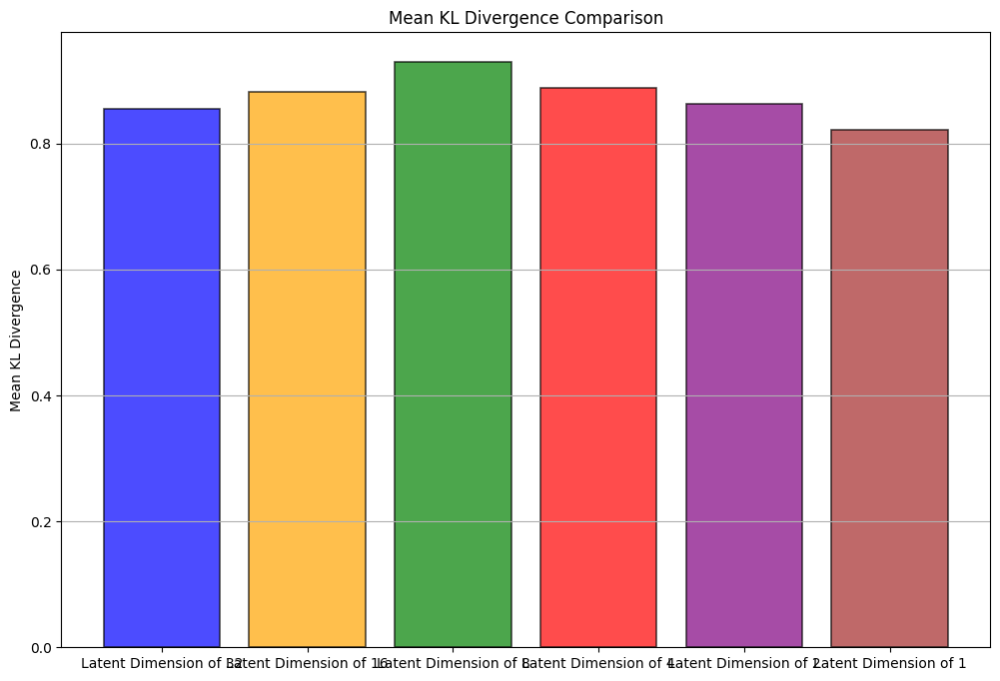

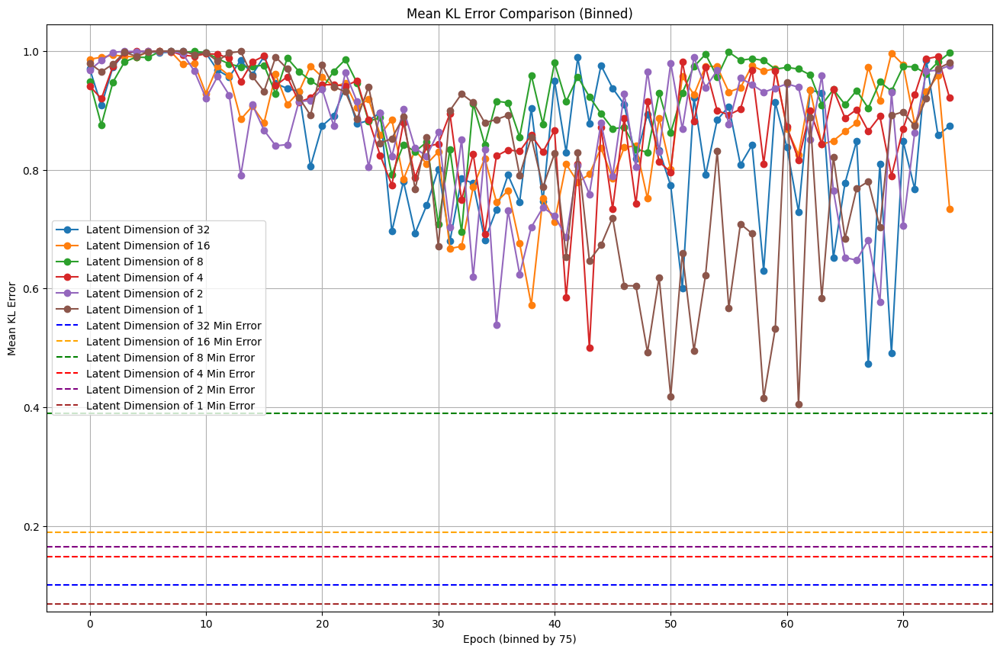

In [23]:
KL_lst1 = np.array(KL_lst1)
KL_lst2 = np.array(KL_lst2)
KL_lst3 = np.array(KL_lst3)
KL_lst4 = np.array(KL_lst4)
KL_lst5 = np.array(KL_lst5)
KL_lst6 = np.array(KL_lst6)

KL_mean_1 = np.mean(KL_lst1)
KL_mean_2 = np.mean(KL_lst2)
KL_mean_3 = np.mean(KL_lst3)
KL_mean_4 = np.mean(KL_lst4)
KL_mean_5 = np.mean(KL_lst5)
KL_mean_6 = np.mean(KL_lst6)
KL_mean = [KL_mean_1, KL_mean_2, KL_mean_3, KL_mean_4, KL_mean_5, KL_mean_6]

plt.figure(figsize=(12,8))
plt.bar(['Latent Dimension of 32', 'Latent Dimension of 16', 'Latent Dimension of 8', 'Latent Dimension of 4', 'Latent Dimension of 2', 'Latent Dimension of 1'],
        KL_mean, color=['blue', 'orange', 'green', 'red', 'purple', 'brown'],
        alpha=0.7, edgecolor='black', linewidth=1.2)
plt.ylabel('Mean KL Divergence')
plt.title('Mean KL Divergence Comparison')
plt.grid(axis='y')
plt.show()

KL_mean_1_over_75_bins = [np.mean(KL_lst1[i:i+20]) for i in range(0, len(KL_lst1), 20)]
KL_mean_2_over_75_bins = [np.mean(KL_lst2[i:i+20]) for i in range(0, len(KL_lst2), 20)]
KL_mean_3_over_75_bins = [np.mean(KL_lst3[i:i+20]) for i in range(0, len(KL_lst3), 20)]
KL_mean_4_over_75_bins = [np.mean(KL_lst4[i:i+20]) for i in range(0, len(KL_lst4), 20)]
KL_mean_5_over_75_bins = [np.mean(KL_lst5[i:i+20]) for i in range(0, len(KL_lst5), 20)]
KL_mean_6_over_75_bins = [np.mean(KL_lst6[i:i+20]) for i in range(0, len(KL_lst6), 20)]

plt.figure(figsize=(16,10))
plt.plot(KL_mean_1_over_75_bins, label='Latent Dimension of 32', marker='o')
plt.plot(KL_mean_2_over_75_bins, label='Latent Dimension of 16', marker='o')
plt.plot(KL_mean_3_over_75_bins, label='Latent Dimension of 8', marker='o')
plt.plot(KL_mean_4_over_75_bins, label='Latent Dimension of 4', marker='o')
plt.plot(KL_mean_5_over_75_bins, label='Latent Dimension of 2', marker='o')
plt.plot(KL_mean_6_over_75_bins, label='Latent Dimension of 1', marker='o')
plt.axhline(y=np.min(KL_lst1), color='blue', linestyle='--', label='Latent Dimension of 32 Min Error')
plt.axhline(y=np.min(KL_lst2), color='orange', linestyle='--', label='Latent Dimension of 16 Min Error')
plt.axhline(y=np.min(KL_lst3), color='green', linestyle='--', label='Latent Dimension of 8 Min Error')
plt.axhline(y=np.min(KL_lst4), color='red', linestyle='--', label='Latent Dimension of 4 Min Error')
plt.axhline(y=np.min(KL_lst5), color='purple', linestyle='--', label='Latent Dimension of 2 Min Error')
plt.axhline(y=np.min(KL_lst6), color='brown', linestyle='--', label='Latent Dimension of 1 Min Error')
plt.xlabel('Epoch (binned by 75)')
plt.ylabel('Mean KL Error')
plt.title('Mean KL Error Comparison (Binned)')
plt.legend()
plt.grid()
plt.show()

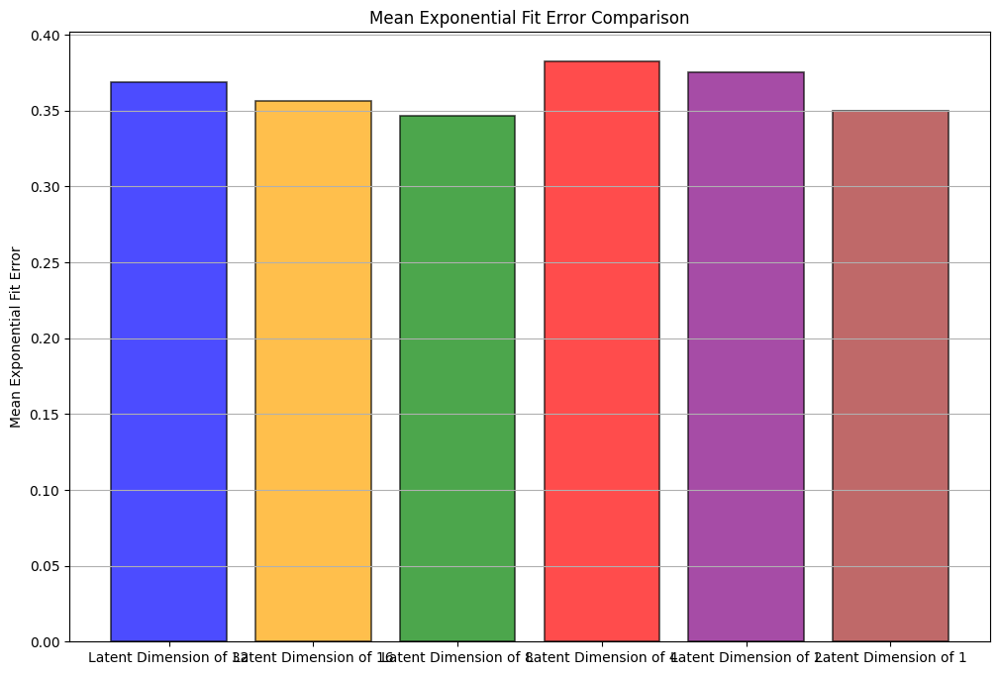

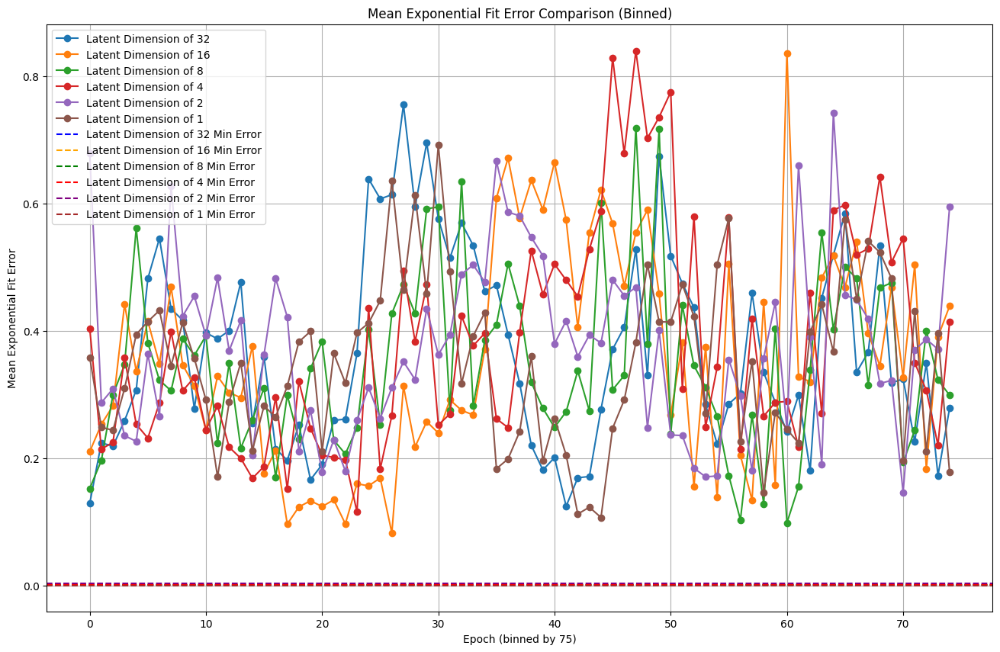

In [24]:
exp_fit_lst1 = np.array(exp_fit_lst1)
exp_fit_lst2 = np.array(exp_fit_lst2)
exp_fit_lst3 = np.array(exp_fit_lst3)
exp_fit_lst4 = np.array(exp_fit_lst4)
exp_fit_lst5 = np.array(exp_fit_lst5)
exp_fit_lst6 = np.array(exp_fit_lst6)

exp_mean_1 = np.mean(exp_fit_lst1)
exp_mean_2 = np.mean(exp_fit_lst2)
exp_mean_3 = np.mean(exp_fit_lst3)
exp_mean_4 = np.mean(exp_fit_lst4)
exp_mean_5 = np.mean(exp_fit_lst5)
exp_mean_6 = np.mean(exp_fit_lst6)

exp_mean = [exp_mean_1, exp_mean_2, exp_mean_3, exp_mean_4, exp_mean_5, exp_mean_6]

plt.figure(figsize=(12,8))
plt.bar(['Latent Dimension of 32', 'Latent Dimension of 16', 'Latent Dimension of 8', 'Latent Dimension of 4', 'Latent Dimension of 2', 'Latent Dimension of 1'],
        exp_mean, color=['blue', 'orange', 'green', 'red', 'purple', 'brown'],
        alpha=0.7, edgecolor='black', linewidth=1.2)
plt.ylabel('Mean Exponential Fit Error')
plt.title('Mean Exponential Fit Error Comparison')
plt.grid(axis='y')
plt.show()

Exp_mean_1_over_75_bins = [np.mean(exp_fit_lst1[i:i+20]) for i in range(0, len(exp_fit_lst1), 20)]
Exp_mean_2_over_75_bins = [np.mean(exp_fit_lst2[i:i+20]) for i in range(0, len(exp_fit_lst2), 20)]
Exp_mean_3_over_75_bins = [np.mean(exp_fit_lst3[i:i+20]) for i in range(0, len(exp_fit_lst3), 20)]
Exp_mean_4_over_75_bins = [np.mean(exp_fit_lst4[i:i+20]) for i in range(0, len(exp_fit_lst4), 20)]
Exp_mean_5_over_75_bins = [np.mean(exp_fit_lst5[i:i+20]) for i in range(0, len(exp_fit_lst5), 20)]
Exp_mean_6_over_75_bins = [np.mean(exp_fit_lst6[i:i+20]) for i in range(0, len(exp_fit_lst6), 20)]

plt.figure(figsize=(16,10))
plt.plot(Exp_mean_1_over_75_bins, label='Latent Dimension of 32', marker='o')
plt.plot(Exp_mean_2_over_75_bins, label='Latent Dimension of 16', marker='o')
plt.plot(Exp_mean_3_over_75_bins, label='Latent Dimension of 8', marker='o')
plt.plot(Exp_mean_4_over_75_bins, label='Latent Dimension of 4', marker='o')
plt.plot(Exp_mean_5_over_75_bins, label='Latent Dimension of 2', marker='o')
plt.plot(Exp_mean_6_over_75_bins, label='Latent Dimension of 1', marker='o')
plt.axhline(y=np.min(exp_fit_lst1), color='blue', linestyle='--', label='Latent Dimension of 32 Min Error')
plt.axhline(y=np.min(exp_fit_lst2), color='orange', linestyle='--', label='Latent Dimension of 16 Min Error')
plt.axhline(y=np.min(exp_fit_lst3), color='green', linestyle='--', label='Latent Dimension of 8 Min Error')
plt.axhline(y=np.min(exp_fit_lst4), color='red', linestyle='--', label='Latent Dimension of 4 Min Error')
plt.axhline(y=np.min(exp_fit_lst5), color='purple', linestyle='--', label='Latent Dimension of 2 Min Error')
plt.axhline(y=np.min(exp_fit_lst6), color='brown', linestyle='--', label='Latent Dimension of 1 Min Error')
plt.xlabel('Epoch (binned by 75)')
plt.ylabel('Mean Exponential Fit Error')
plt.title('Mean Exponential Fit Error Comparison (Binned)')
plt.legend()
plt.grid()
plt.show()

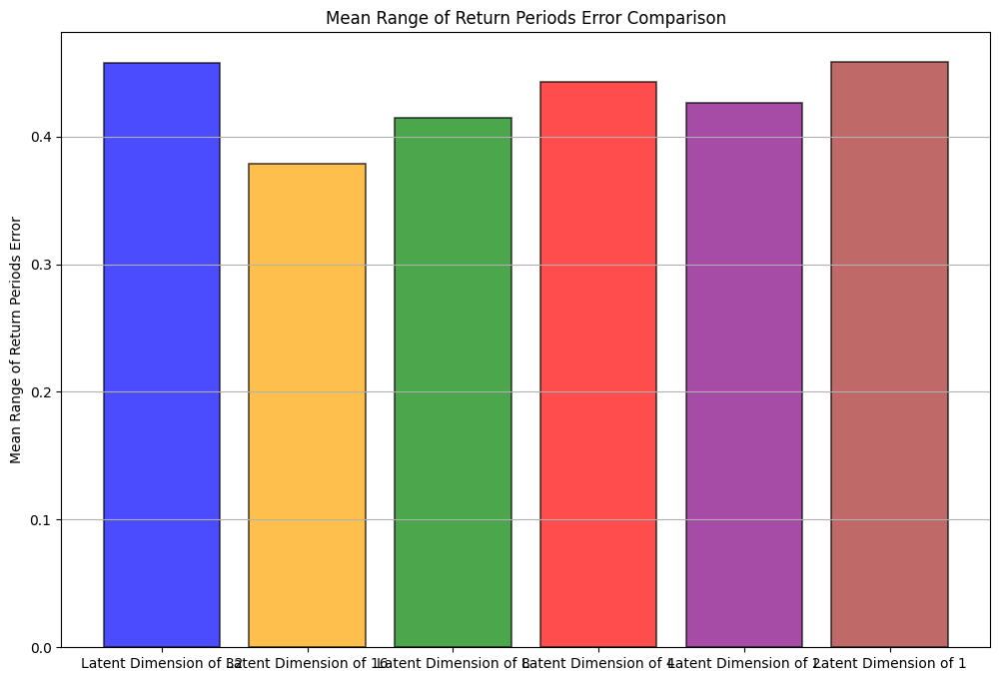

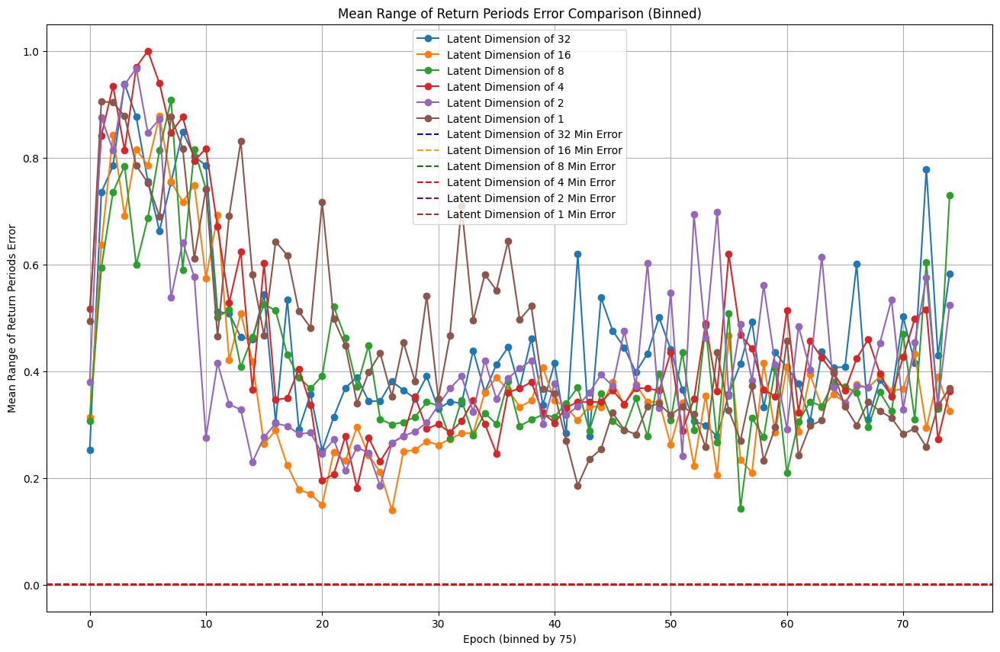

In [25]:
range_lst1 = np.array(range_lst1)
range_lst2 = np.array(range_lst2)
range_lst3 = np.array(range_lst3)
range_lst4 = np.array(range_lst4)
range_lst5 = np.array(range_lst5)
range_lst6 = np.array(range_lst6)

range_mean_1 = np.mean(range_lst1)
range_mean_2 = np.mean(range_lst2)
range_mean_3 = np.mean(range_lst3)
range_mean_4 = np.mean(range_lst4)
range_mean_5 = np.mean(range_lst5)
range_mean_6 = np.mean(range_lst6)
range_mean = [range_mean_1, range_mean_2, range_mean_3, range_mean_4, range_mean_5, range_mean_6]

plt.figure(figsize=(12,8))
plt.bar(['Latent Dimension of 32', 'Latent Dimension of 16', 'Latent Dimension of 8', 'Latent Dimension of 4', 'Latent Dimension of 2', 'Latent Dimension of 1'],
        range_mean, color=['blue', 'orange', 'green', 'red', 'purple', 'brown'],
        alpha=0.7, edgecolor='black', linewidth=1.2)
plt.ylabel('Mean Range of Return Periods Error')
plt.title('Mean Range of Return Periods Error Comparison')
plt.grid(axis='y')
plt.show()

Range_mean_1_over_75_bins = [np.mean(range_lst1[i:i+20]) for i in range(0, len(range_lst1), 20)]
Range_mean_2_over_75_bins = [np.mean(range_lst2[i:i+20]) for i in range(0, len(range_lst2), 20)]
Range_mean_3_over_75_bins = [np.mean(range_lst3[i:i+20]) for i in range(0, len(range_lst3), 20)]
Range_mean_4_over_75_bins = [np.mean(range_lst4[i:i+20]) for i in range(0, len(range_lst4), 20)]
Range_mean_5_over_75_bins = [np.mean(range_lst5[i:i+20]) for i in range(0, len(range_lst5), 20)]
Range_mean_6_over_75_bins = [np.mean(range_lst6[i:i+20]) for i in range(0, len(range_lst6), 20)]

plt.figure(figsize=(16,10))
plt.plot(Range_mean_1_over_75_bins, label='Latent Dimension of 32', marker='o')
plt.plot(Range_mean_2_over_75_bins, label='Latent Dimension of 16', marker='o')
plt.plot(Range_mean_3_over_75_bins, label='Latent Dimension of 8', marker='o')
plt.plot(Range_mean_4_over_75_bins, label='Latent Dimension of 4', marker='o')
plt.plot(Range_mean_5_over_75_bins, label='Latent Dimension of 2', marker='o')
plt.plot(Range_mean_6_over_75_bins, label='Latent Dimension of 1', marker='o')
plt.axhline(y=np.min(range_lst1), color='blue', linestyle='--', label='Latent Dimension of 32 Min Error')
plt.axhline(y=np.min(range_lst2), color='orange', linestyle='--', label='Latent Dimension of 16 Min Error')
plt.axhline(y=np.min(range_lst3), color='green', linestyle='--', label='Latent Dimension of 8 Min Error')
plt.axhline(y=np.min(range_lst4), color='red', linestyle='--', label='Latent Dimension of 4 Min Error')
plt.axhline(y=np.min(range_lst5), color='purple', linestyle='--', label='Latent Dimension of 2 Min Error')
plt.axhline(y=np.min(range_lst6), color='brown', linestyle='--', label='Latent Dimension of 1 Min Error')
plt.xlabel('Epoch (binned by 75)')
plt.ylabel('Mean Range of Return Periods Error')
plt.title('Mean Range of Return Periods Error Comparison (Binned)')
plt.legend()
plt.grid()
plt.show()

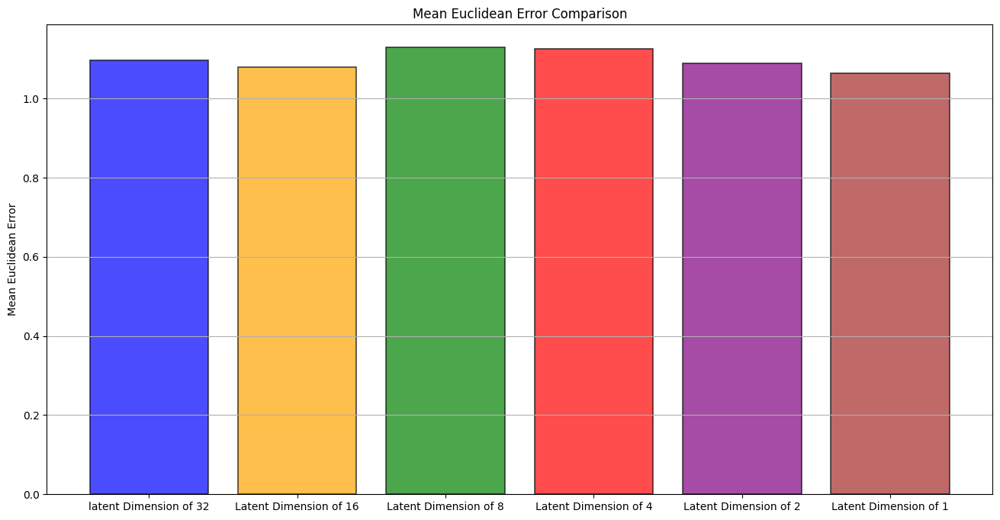

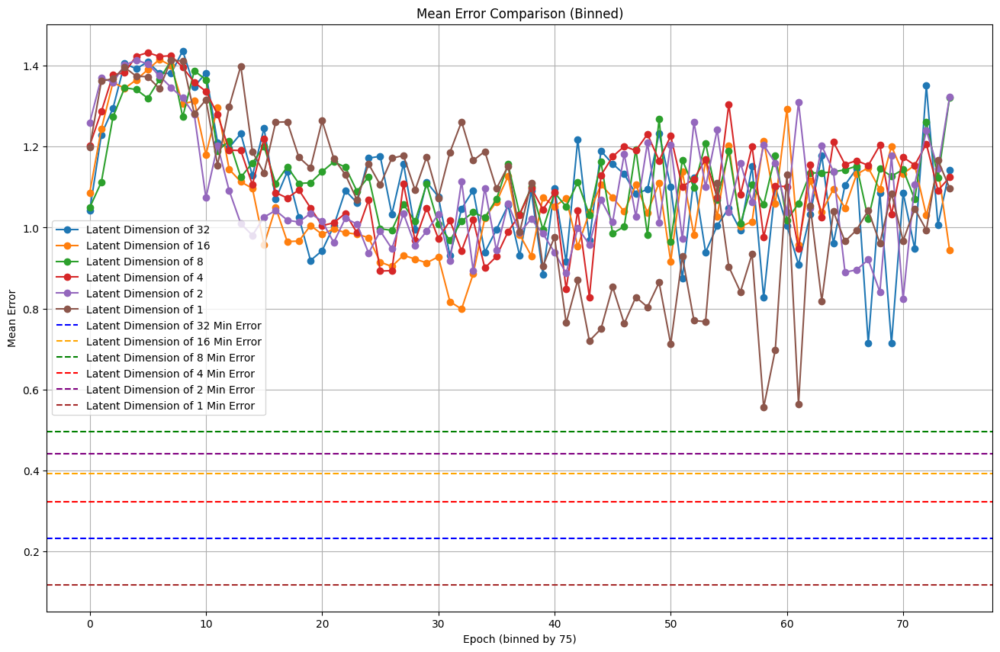

In [26]:
error_lst1 = np.array(error_lst1)
error_lst2 = np.array(error_lst2)
error_lst3 = np.array(error_lst3)
error_lst4 = np.array(error_lst4)
error_lst5 = np.array(error_lst5)
error_lst6 = np.array(error_lst6)

error_mean_1 = np.mean(error_lst1)
error_mean_2 = np.mean(error_lst2)
error_mean_3 = np.mean(error_lst3)
error_mean_4 = np.mean(error_lst4)
error_mean_5 = np.mean(error_lst5)
error_mean_6 = np.mean(error_lst6)
error_mean = [error_mean_1, error_mean_2, error_mean_3, error_mean_4, error_mean_5, error_mean_6]

plt.figure(figsize=(16,8))
plt.bar(['latent Dimension of 32', 'Latent Dimension of 16', 'Latent Dimension of 8', 'Latent Dimension of 4', 'Latent Dimension of 2', 'Latent Dimension of 1'],
        error_mean, color=['blue', 'orange', 'green', 'red', 'purple', 'brown'],
        alpha=0.7, edgecolor='black', linewidth=1.2)
plt.ylabel('Mean Euclidean Error')
plt.title('Mean Euclidean Error Comparison')
plt.grid(axis='y')
plt.show()

Error_mean_1_over_75_bins = [np.mean(error_lst1[i:i+20]) for i in range(0, len(error_lst1), 20)]
Error_mean_2_over_75_bins = [np.mean(error_lst2[i:i+20]) for i in range(0, len(error_lst2), 20)]
Error_mean_3_over_75_bins = [np.mean(error_lst3[i:i+20]) for i in range(0, len(error_lst3), 20)]
Error_mean_4_over_75_bins = [np.mean(error_lst4[i:i+20]) for i in range(0, len(error_lst4), 20)]
Error_mean_5_over_75_bins = [np.mean(error_lst5[i:i+20]) for i in range(0, len(error_lst5), 20)]
Error_mean_6_over_75_bins = [np.mean(error_lst6[i:i+20]) for i in range(0, len(error_lst6), 20)]

plt.figure(figsize=(16,10))
plt.plot(Error_mean_1_over_75_bins, label='Latent Dimension of 32', marker='o')
plt.plot(Error_mean_2_over_75_bins, label='Latent Dimension of 16', marker='o')
plt.plot(Error_mean_3_over_75_bins, label='Latent Dimension of 8', marker='o')
plt.plot(Error_mean_4_over_75_bins, label='Latent Dimension of 4', marker='o')
plt.plot(Error_mean_5_over_75_bins, label='Latent Dimension of 2', marker='o')
plt.plot(Error_mean_6_over_75_bins, label='Latent Dimension of 1', marker='o')
plt.axhline(y=np.min(error_lst1), color='blue', linestyle='--', label='Latent Dimension of 32 Min Error')
plt.axhline(y=np.min(error_lst2), color='orange', linestyle='--', label='Latent Dimension of 16 Min Error')
plt.axhline(y=np.min(error_lst3), color='green', linestyle='--', label='Latent Dimension of 8 Min Error')
plt.axhline(y=np.min(error_lst4), color='red', linestyle='--', label='Latent Dimension of 4 Min Error')
plt.axhline(y=np.min(error_lst5), color='purple', linestyle='--', label='Latent Dimension of 2 Min Error')
plt.axhline(y=np.min(error_lst6), color='brown', linestyle='--', label='Latent Dimension of 1 Min Error')
plt.xlabel('Epoch (binned by 75)')
plt.ylabel('Mean Error')
plt.title('Mean Error Comparison (Binned)')
plt.legend()
plt.grid()
plt.show()